FIP200 LD and inclusion quantification  
- Exclude cells with faint inclusions that don’t segment.  
- %SA overlap between LDs and synuclein inclusions.  
- number of inclusions  
- surface area of inclusions  
- SA and number of LDs in inclusions and outside inclusions  
- analyze LDs only in green cells (Cellpose)  
- We imaged only cells that contain inclusions.  

Import Libraries

In [14]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, binary_dilation, disk
import czifile
import skimage.io as io
from skimage import exposure
from cellpose import models
model = models.Cellpose(model_type='cyto')
model = models.Cellpose(model_type='nuclei')

c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\cellpose\resnet_torch.py:275: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(filename, 

Define Sub Functions

In [15]:
def show_image(image):
    io.imshow(image, cmap='gray')
    plt.show()

def preprocess_green_channel(green_channel):
    """Preprocess the green channel for cell segmentation and inclusion quantification."""
    confocal_img = gaussian(green_channel, sigma=2)
    confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = (confocal_img - confocal_img.min()) / (confocal_img.max() - confocal_img.min())
    
    return confocal_img

def preprocess_dapi_channel(dapi_channel):
    """Preprocess the DAPI channel for nuclei quantification."""
    blurred_dapi = gaussian(dapi_channel, sigma=2)
    threshold_value = threshold_otsu(blurred_dapi)
    binary_image = blurred_dapi > threshold_value
    # show_image(binary_image)
    cleaned_image = remove_small_objects(binary_image, min_size=400)
    merged_image = binary_dilation(cleaned_image, footprint=disk(5))
    labeled_image = label(merged_image)
    return labeled_image

def count_nuclei(labeled_image):
    """Count the number of nuclei in the labeled image."""
    return len(np.unique(labeled_image)) - 1



In [16]:
def analyze_image(image_path, basename):
    """
    Analyze an image by its individual cells
    Args:
        image_path: Path to the .czi image file.
        basename: Base name for the file, used in the output DataFrame.

    Returns:
        A DataFrame containing details about each image 
        A second DataFrame containing details about each detected cell
    """
    
    # Load the image and squeeze dimensions
    image = czifile.imread(image_path)
    image_squeezed = np.squeeze(image)

    # Separate the channels
    red_channel = image_squeezed[0, :, :]
    green_channel = image_squeezed[1, :, :]

    threshold_red = threshold_otsu(gaussian(red_channel)) + 0.1
    red_channel_thresholded = gaussian(red_channel) > threshold_red

    # TODO: use cellpose for red channel

    print("Red Channel")
    show_image(red_channel_thresholded)

    green_channel = preprocess_green_channel(green_channel)
    print("Green Channel")
    show_image(green_channel)


    green_channel_remove_inclusions = np.where(green_channel < 0.8, green_channel, 0) # remove inclusions
    green_channel_remove_inclusions = gaussian(green_channel_remove_inclusions, sigma=10) # blur

    # Detect cells in the green channel
    masks, flows, styles, diams = model.eval(green_channel_remove_inclusions, diameter=300, channels=[0, 0])
    labeled_cells = label(masks)
    
    print("Segmented Cells")
    show_image(labeled_cells)


    # Initialize lists to store results
    num_inclusions = []
    total_inclusion_areas = []


    number_of_ld_in_inclusions_list = []
    area_of_ld_in_inclusions_list = []
    number_of_ld_outside_inclusions_list = []
    area_of_ld_outside_inclusions_list = []

    # Analyze each detected cell
    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:
            continue
        
        
        mask = labeled_cells == cell.label
        
        applied_mask_blurred = gaussian(green_channel, sigma=5) * mask
        applied_mask_eliminate_background = applied_mask_blurred[applied_mask_blurred > 0] # filter out 0
        
        # normalize 
        applied_mask_eliminate_background = (applied_mask_eliminate_background - np.min(applied_mask_eliminate_background)) / ((np.max(applied_mask_eliminate_background) - np.min(applied_mask_eliminate_background)))

        # calculate statistics
        mean_intensity = np.mean(applied_mask_eliminate_background)
        median_intensity = np.median(applied_mask_eliminate_background)
        q1 = np.percentile(applied_mask_eliminate_background, 25)
        q3 = np.percentile(applied_mask_eliminate_background, 75)
        
        hist, bin_edges = np.histogram(applied_mask_eliminate_background, bins='fd')
        
        applied_mask = green_channel * mask
        # 0.4 is an empirical value that seems to work well
        if q3 < 0.4 and len(bin_edges) > 20:
            # the population is skewed to the left, indicating that there are inclusions
            threshold = max(threshold_otsu(applied_mask),0.5) # use otsu thresholding to find the threshold
        elif q3 >= 0.9:
            # definitely no inclusions
            threshold = 1
        else:
            # probably no inclusions, but not sure, so we set a very high threshold in case there are inclusions
            threshold = 0.99
        
        inclusions = applied_mask > threshold # apply the threshold
        inclusions_labeled = label(inclusions)

        
        ld_cell = red_channel_thresholded*mask # find the lipid droplets in the cell
        ld_cell_labeled = label(ld_cell) # label the lipid droplets in the cell
        number_of_ld_in_inclusions = 0
        area_of_ld_in_inclusions = 0
        number_of_ld_outside_inclusions = 0
        area_of_ld_outside_inclusions = 0
        for ld in regionprops(ld_cell_labeled):
            if ld.area < 10:
                continue
            ld_image = ld_cell_labeled == ld.label
            # show_image(ld_image)
            overlap = inclusions_labeled * ld_image
            if np.sum(overlap) > 0:
                number_of_ld_in_inclusions += 1
                area_of_ld_in_inclusions += ld.area
            else:
                number_of_ld_outside_inclusions += 1
                area_of_ld_outside_inclusions += ld.area
        number_of_ld_in_inclusions_list.append(number_of_ld_in_inclusions)
        area_of_ld_in_inclusions_list.append(area_of_ld_in_inclusions)
        number_of_ld_outside_inclusions_list.append(number_of_ld_outside_inclusions)
        area_of_ld_outside_inclusions_list.append(area_of_ld_outside_inclusions)
                

        inclusion_areas = [inclusion.area for inclusion in regionprops(inclusions_labeled) if inclusion.area > 10] # filter out small inclusions
        inclusion_areas = np.array(inclusion_areas)
        total_inclusion_area = np.sum(inclusion_areas)
        
        if len(inclusion_areas) > 0:
            print("Threshold: ", threshold)
            print("Bin count", len(bin_edges))

            plt.hist(applied_mask_eliminate_background, bins='fd')  
            plt.axvline(mean_intensity, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_intensity:.2f}')
            plt.axvline(median_intensity, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median_intensity:.2f}')
            plt.axvline(q1, color='blue', linestyle='dashed', linewidth=2, label=f'Q1: {q1:.2f}')
            plt.axvline(q3, color='purple', linestyle='dashed', linewidth=2, label=f'Q3: {q3:.2f}')
            plt.legend()
            plt.title("Intensity histogram")
            plt.show()

            print("Inclusion Areas: ", inclusion_areas)
            show_image(inclusions)
            
        
        # store results
        total_inclusion_areas.append(total_inclusion_area)
        num_inclusions.append(len(inclusion_areas))
    
    # analysis by image
    df1 = pd.DataFrame({
        "File_Name:": [basename],
        "Number_of_Inclusions": [np.sum(num_inclusions)],
        "Area_of_Inclusions": [np.sum(total_inclusion_areas)],
        "Number_of_LD_in_Inclusions": [np.sum(number_of_ld_in_inclusions_list)],
        "Area_of_LD_in_Inclusions": [np.sum(area_of_ld_in_inclusions_list)],
        "Number_of_LD_outside_Inclusions": [np.sum(number_of_ld_outside_inclusions_list)],
        "Area_of_LD_outside_Inclusions": [np.sum(area_of_ld_outside_inclusions_list)],
    })
    
   
    return df1

In [17]:
def analyze_all_images(image_folder):
    all_data_1 = []
    for well_image in os.listdir(image_folder):
        
        if well_image.lower().endswith(".czi"):  # Filter for CZI files
            
            print(well_image)

            well_image_path = os.path.join(image_folder, well_image)
            well_image_base_name = os.path.basename(well_image)[:-4]
            
            df1 = analyze_image(well_image_path, well_image_base_name)
            all_data_1.append(df1)
            
            print("-" * 200)

    combined_df_1 = pd.concat(all_data_1, ignore_index=True)
    combined_df_1.to_excel(f"{image_folder[:6]}_analysis_by_image.xlsx", index=False)


Define Main Function

In [18]:
folders = ['11725_lipidDroplets_FIP200']

1K_FIP200_LT_noOA_01.czi
Red Channel


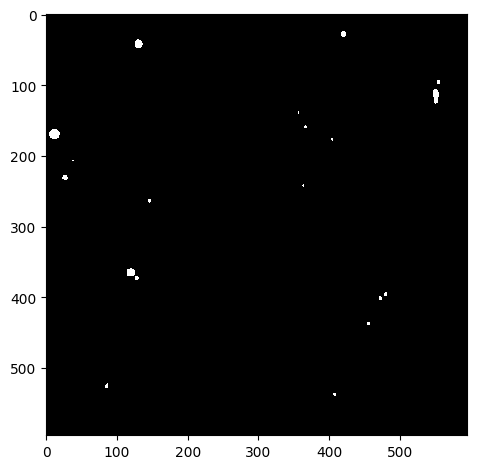

Green Channel


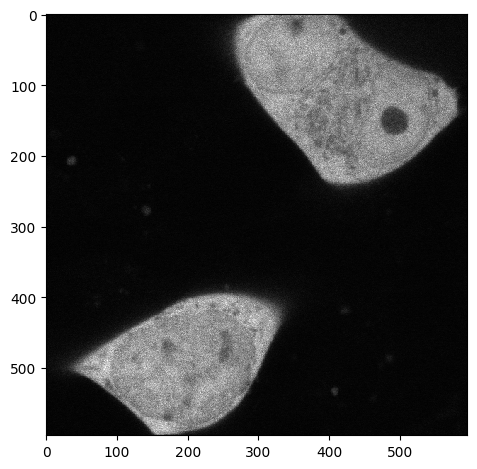

Segmented Cells


c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:158: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


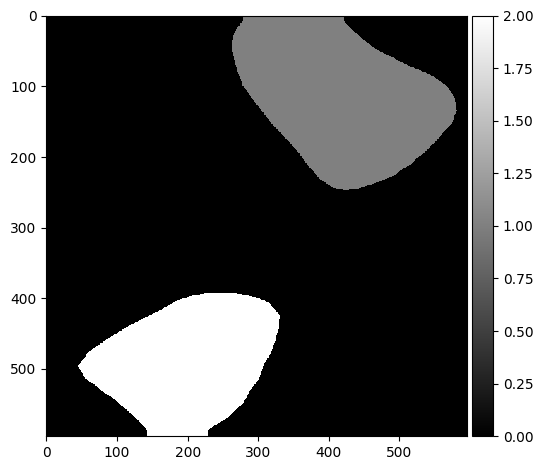

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_02.czi
Red Channel


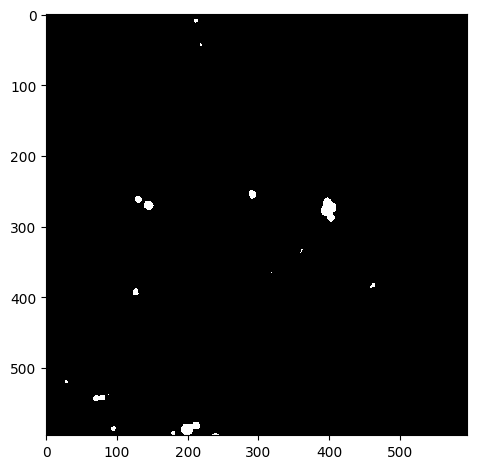

Green Channel


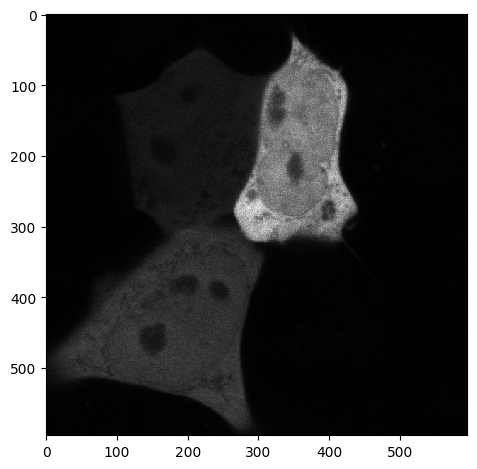

Segmented Cells


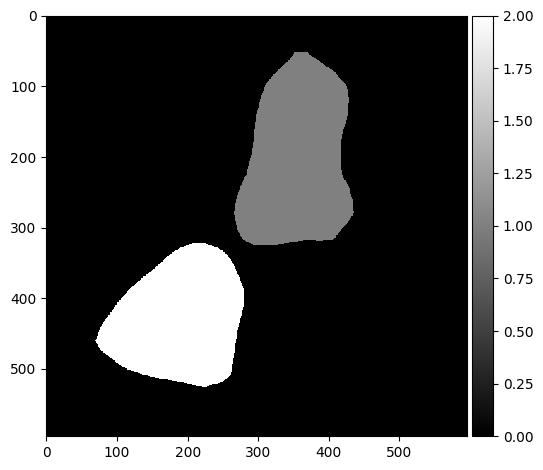

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_03.czi
Red Channel


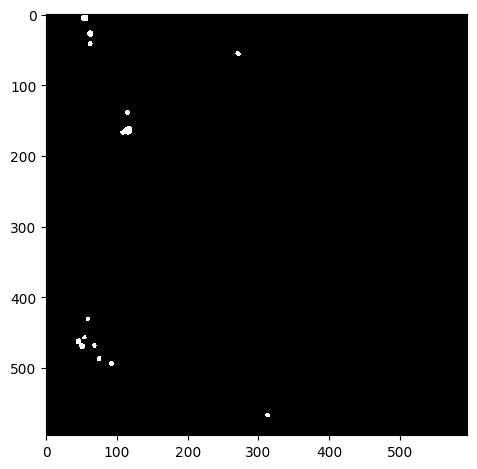

Green Channel


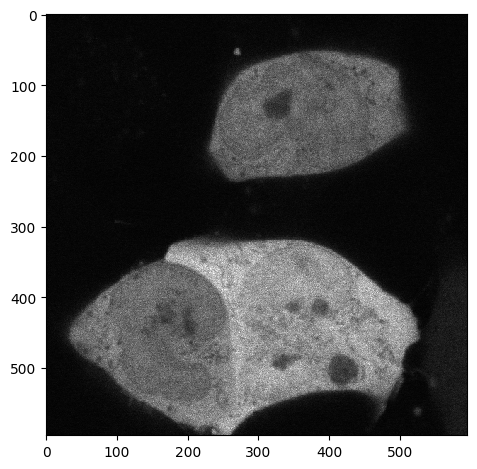

Segmented Cells


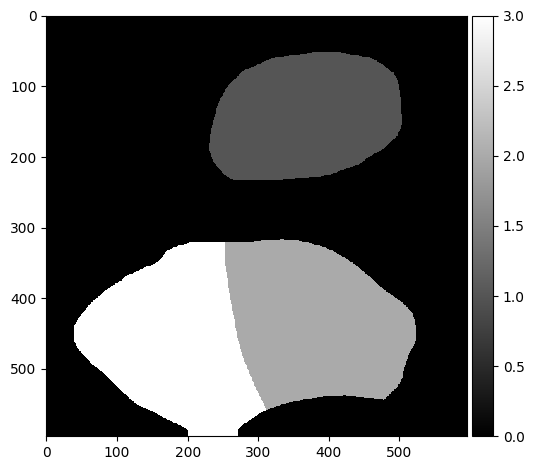

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_04.czi
Red Channel


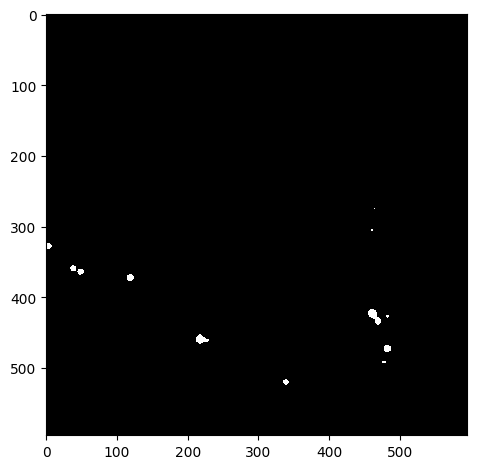

Green Channel


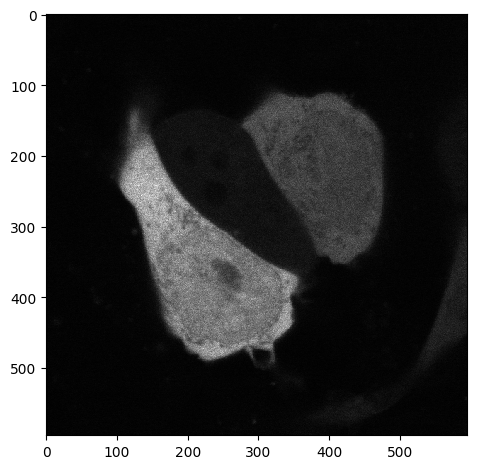

Segmented Cells


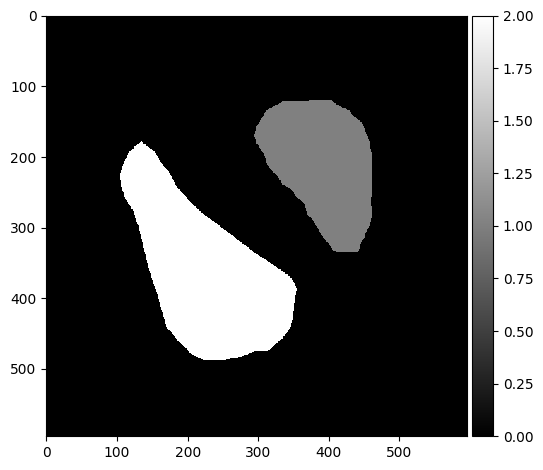

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_05.czi
Red Channel


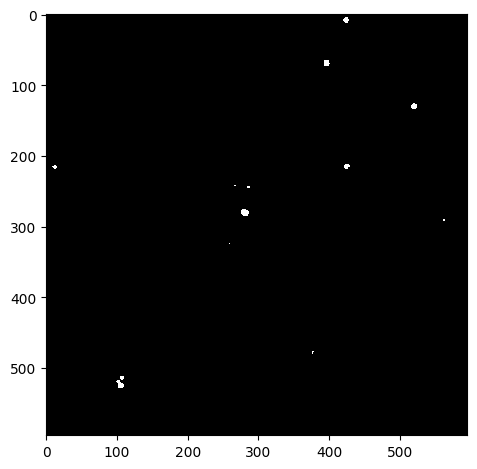

Green Channel


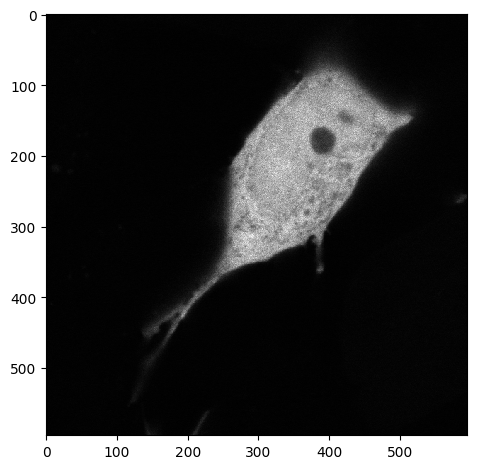

Segmented Cells


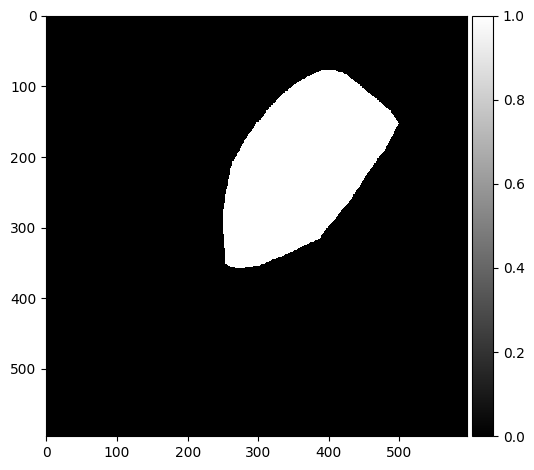

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_noOA_06.czi
Red Channel


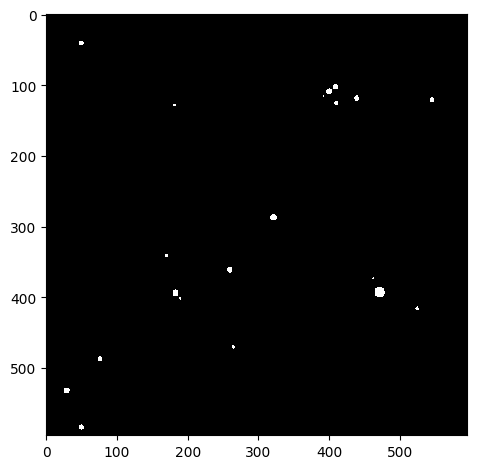

Green Channel


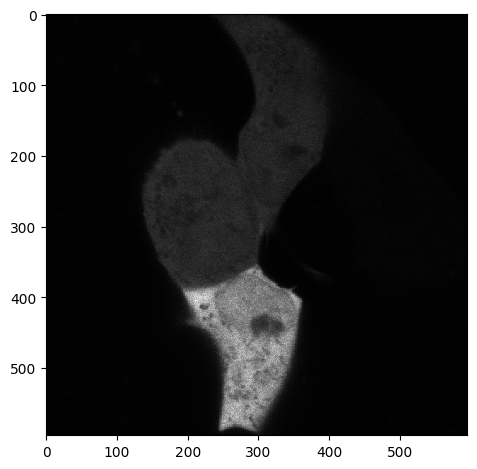

Segmented Cells


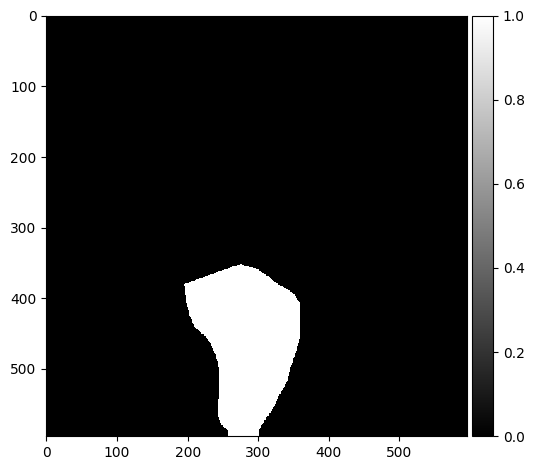

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_01.czi
Red Channel


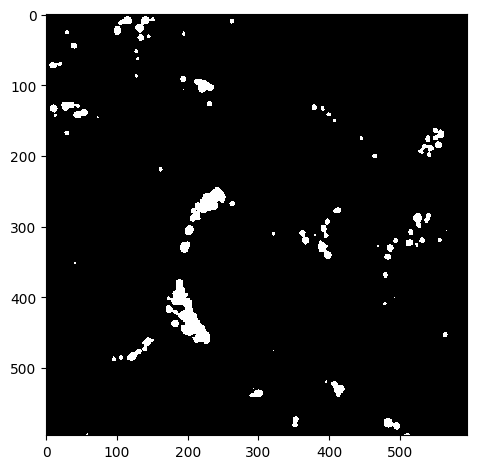

Green Channel


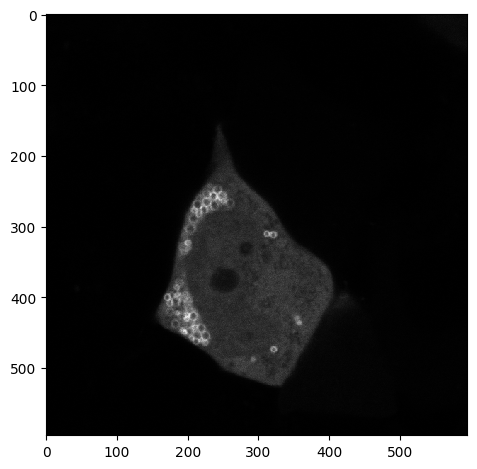

Segmented Cells


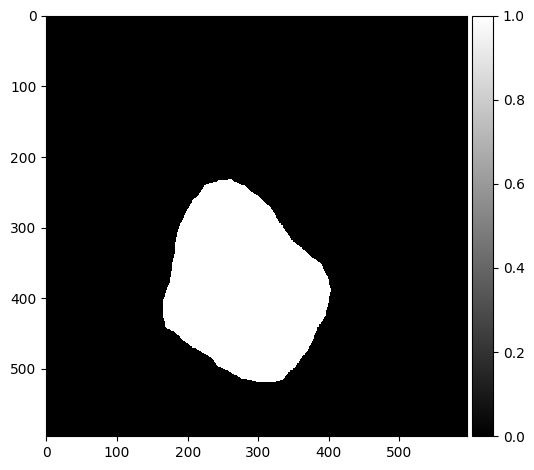

Threshold:  0.5
Bin count 232


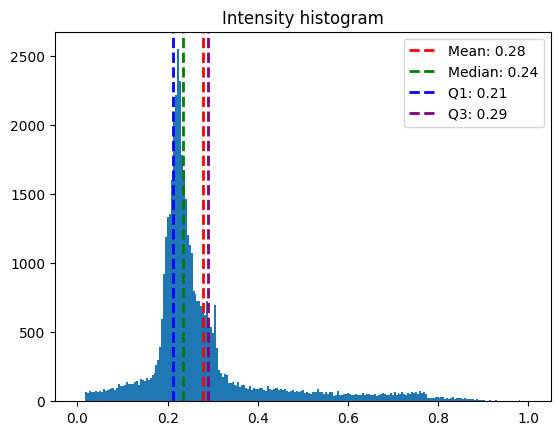

Inclusion Areas:  [396.  71.  30.  12.  48.  11.  85.  68.  40. 502.  26.  22.  73.  31.]


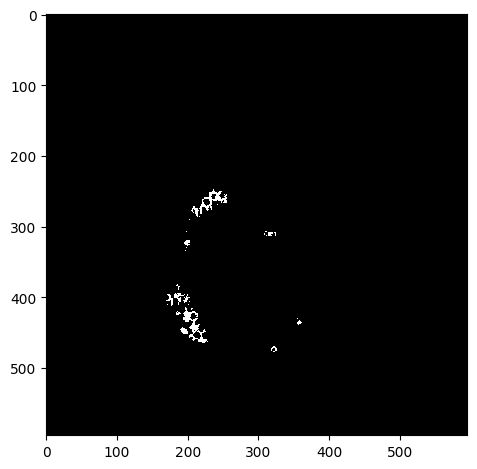

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_02.czi
Red Channel


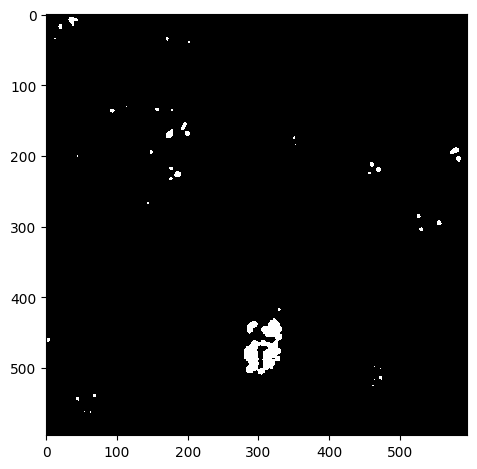

Green Channel


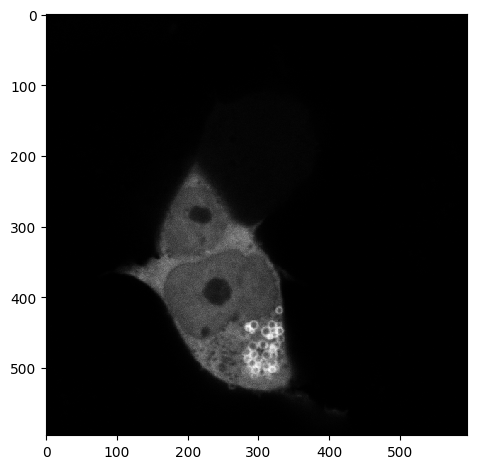

Segmented Cells


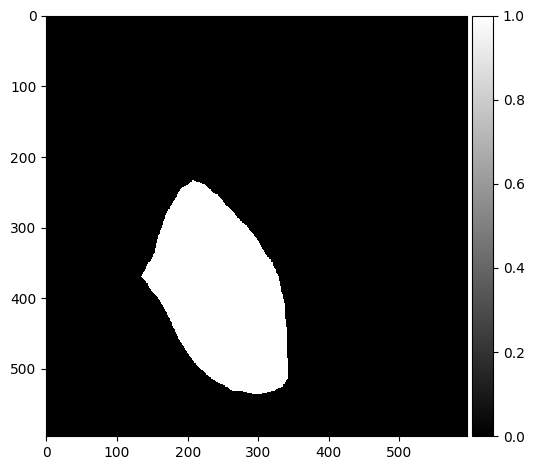

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_03.czi
Red Channel


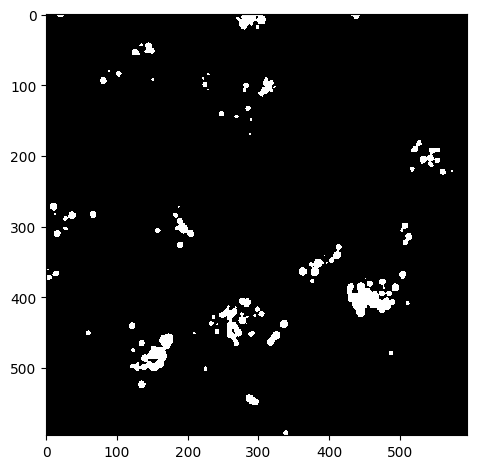

Green Channel


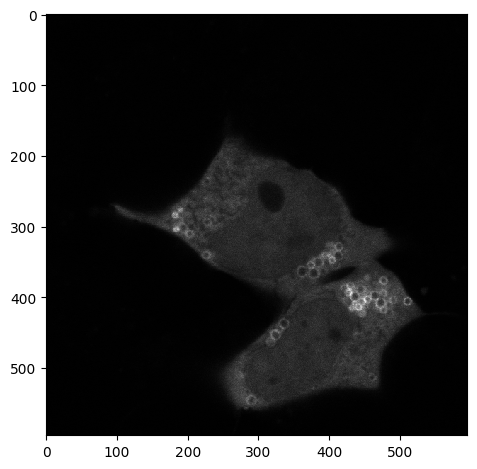

Segmented Cells


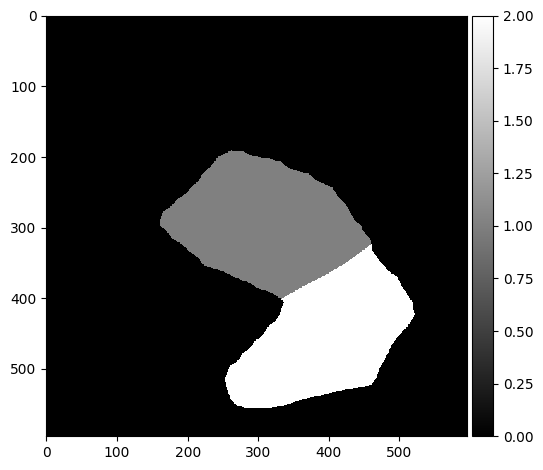

Threshold:  0.5
Bin count 198


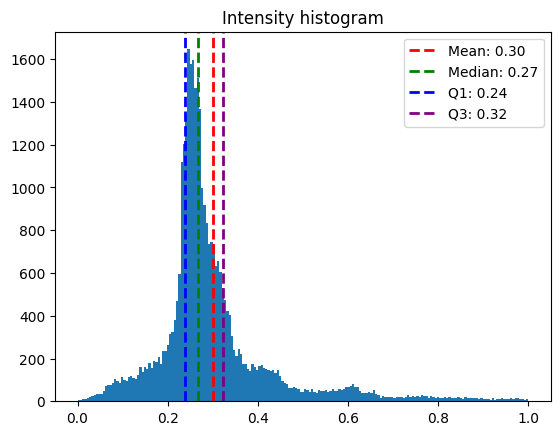

Inclusion Areas:  [118. 347.  56.]


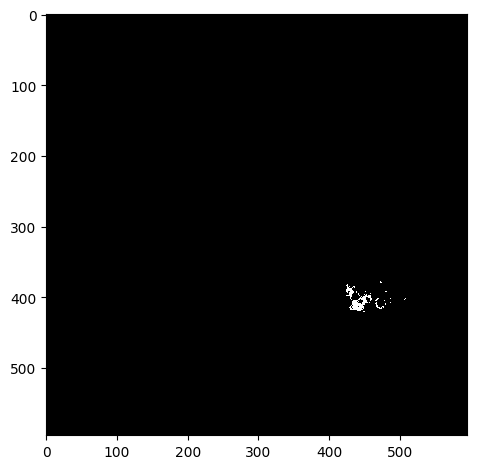

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_04.czi
Red Channel


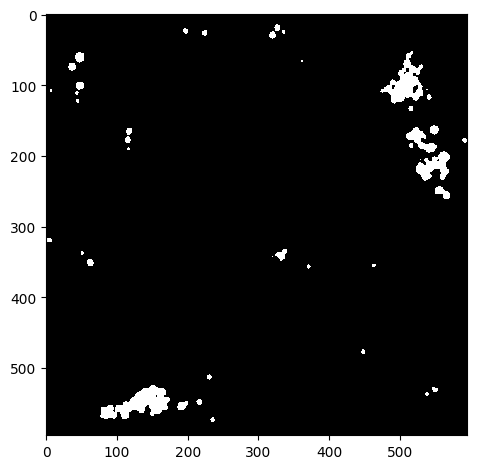

Green Channel


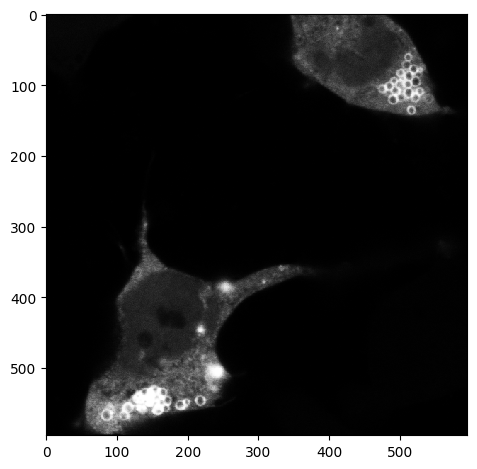

Segmented Cells


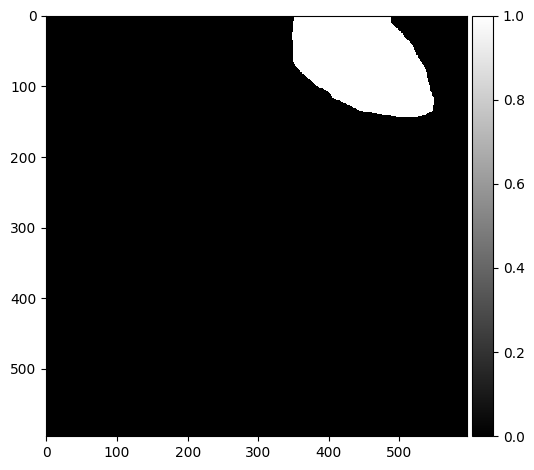

Threshold:  0.5
Bin count 90


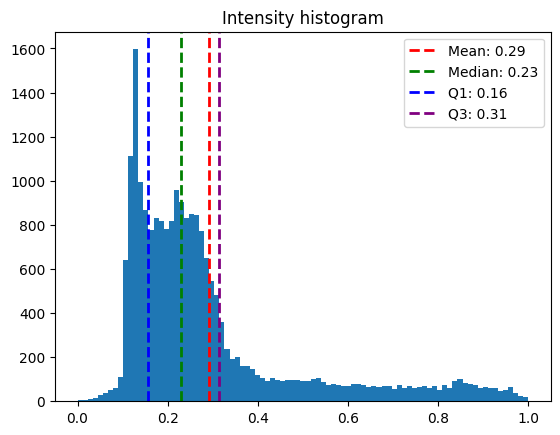

Inclusion Areas:  [2059.  107.]


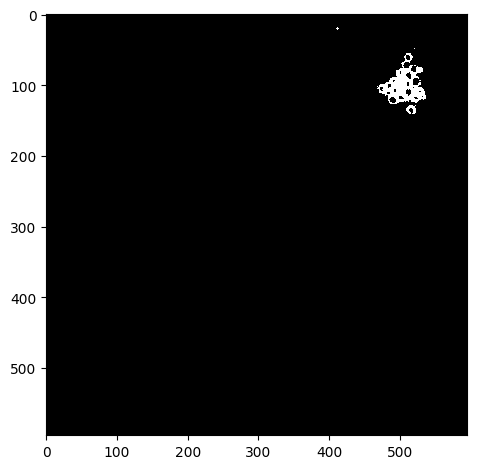

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_05.czi
Red Channel


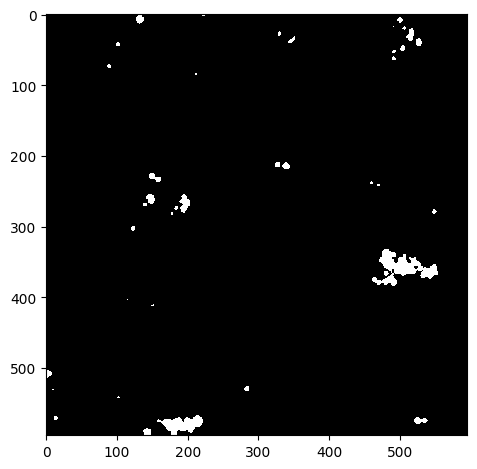

Green Channel


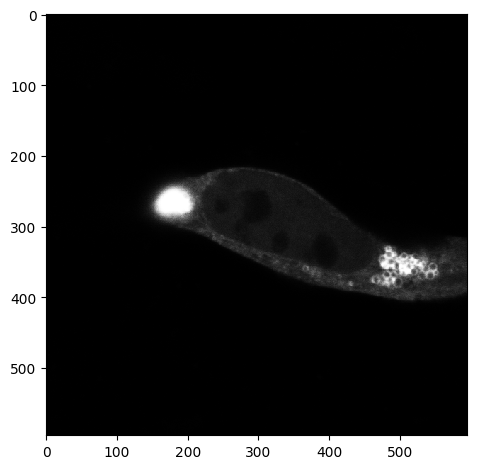

Segmented Cells


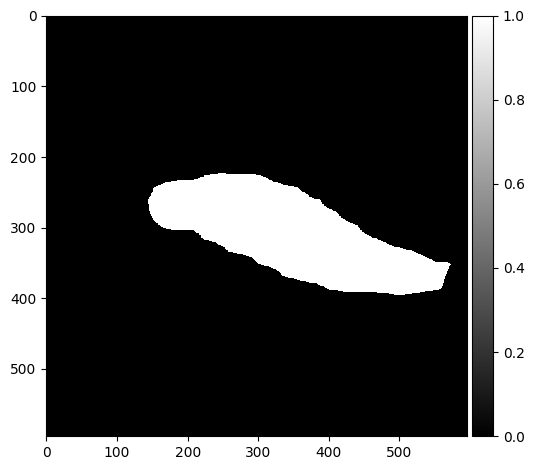

Threshold:  0.5
Bin count 156


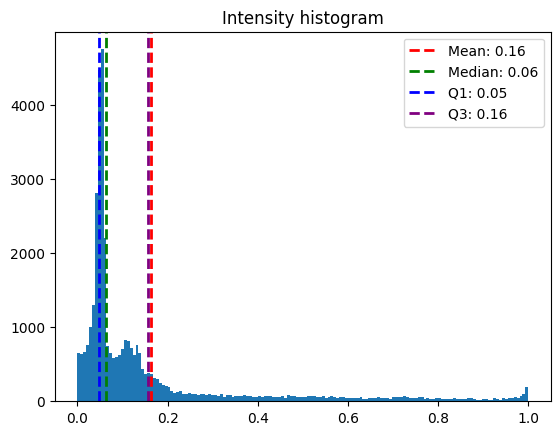

Inclusion Areas:  [1964. 1827.   20.   18.]


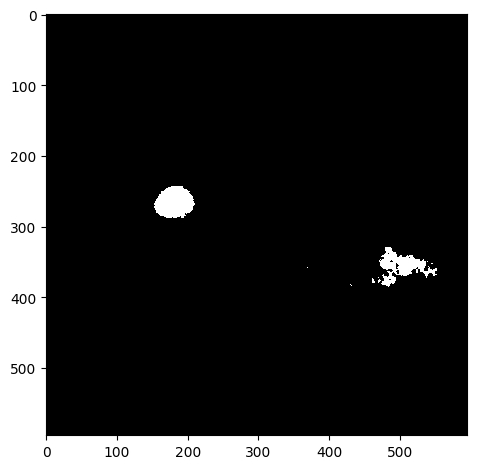

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_FIP200_LT_OA_06.czi
Red Channel


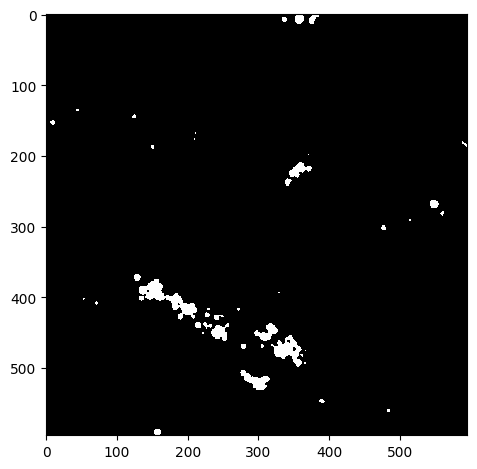

Green Channel


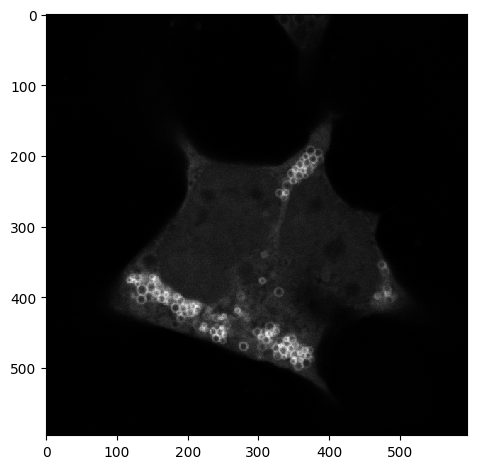

Segmented Cells


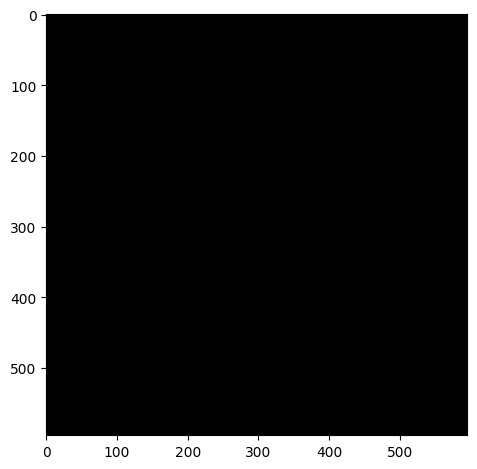

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_01.czi
Red Channel


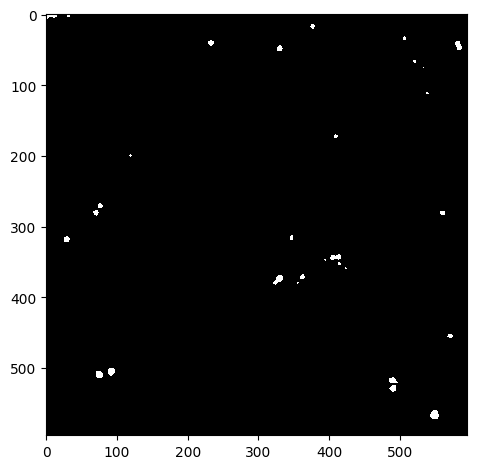

Green Channel


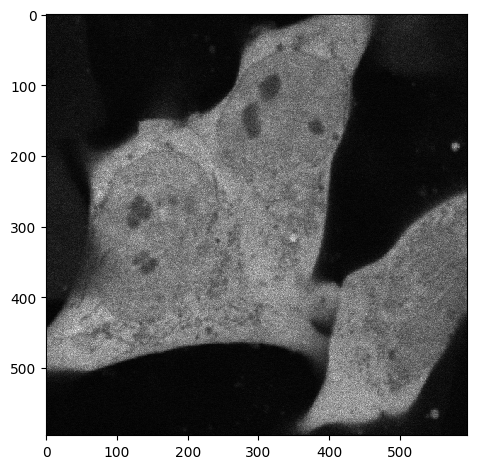

Segmented Cells


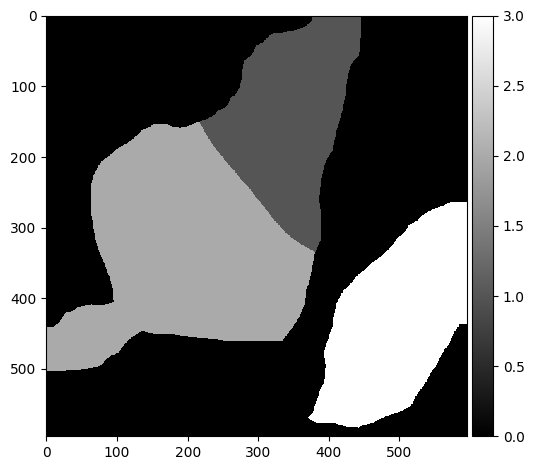

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_02.czi
Red Channel


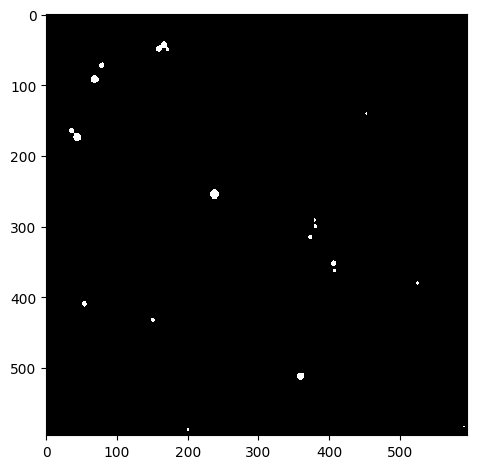

Green Channel


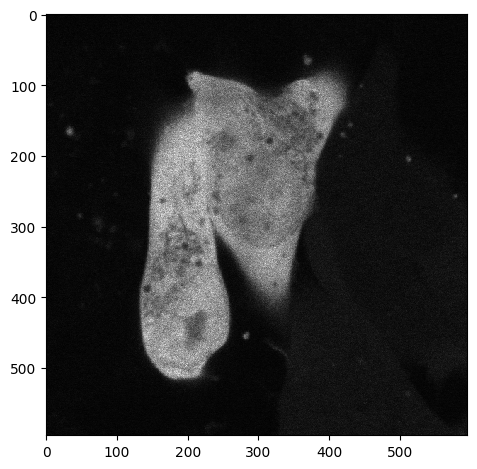

Segmented Cells


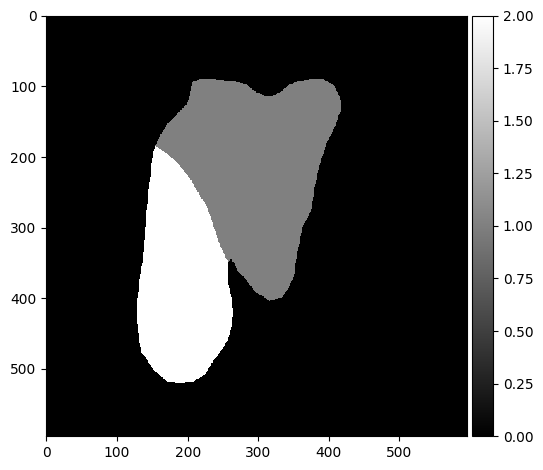

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_03.czi
Red Channel


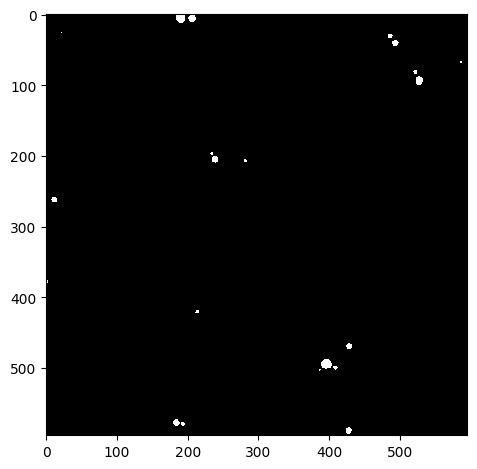

Green Channel


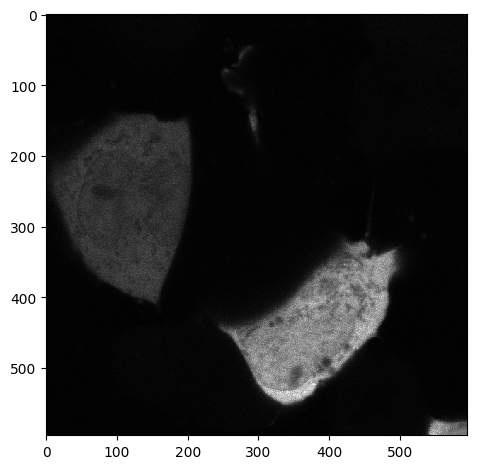

Segmented Cells


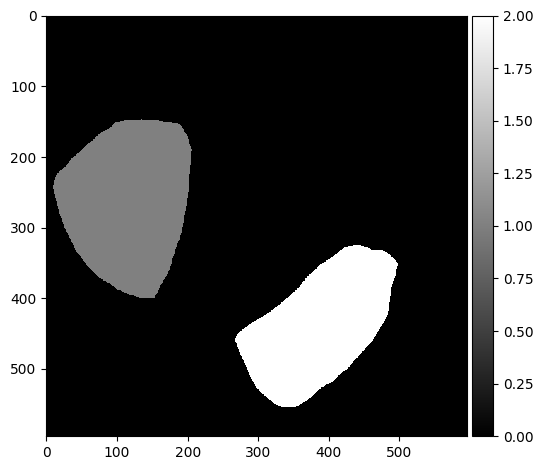

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_04.czi
Red Channel


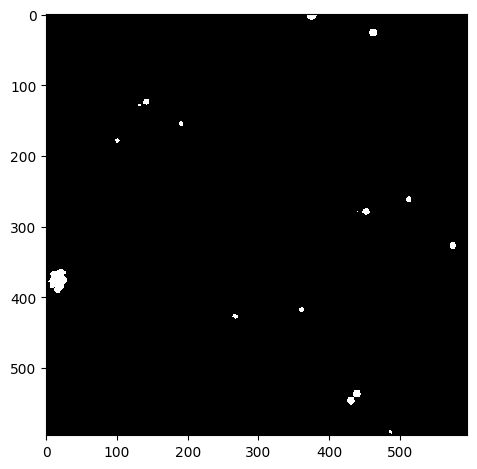

Green Channel


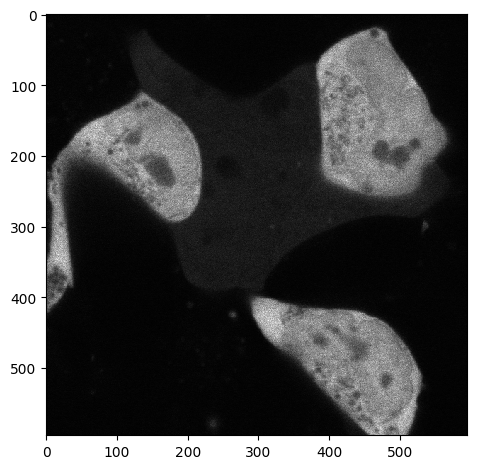

Segmented Cells


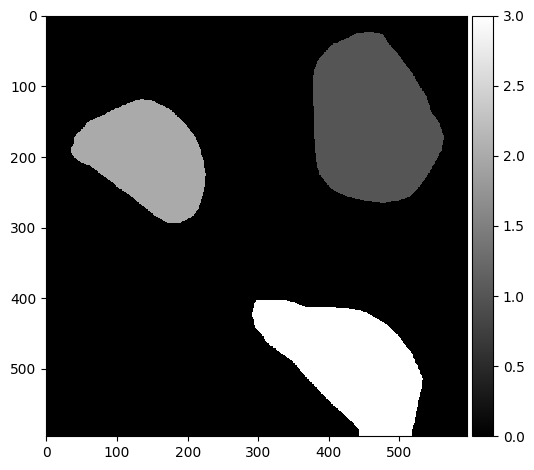

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_05.czi
Red Channel


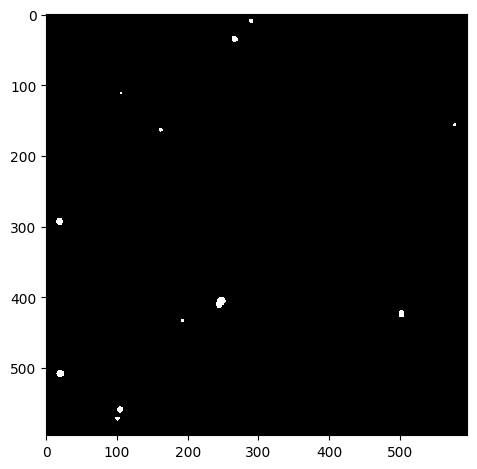

Green Channel


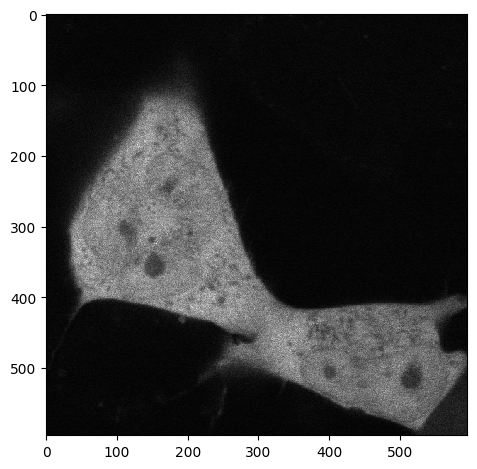

Segmented Cells


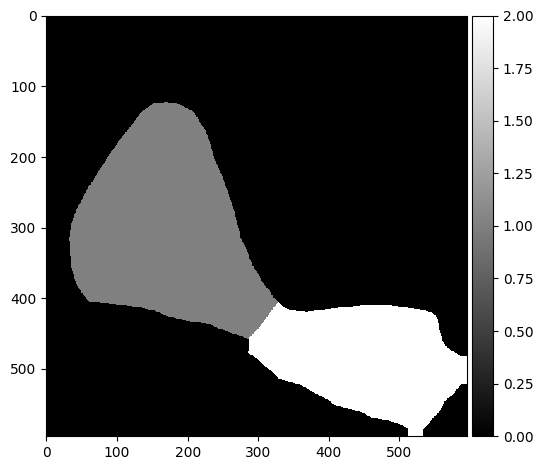

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_noOA_06.czi
Red Channel


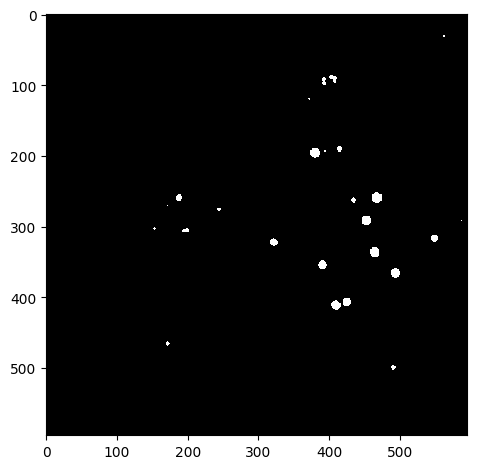

Green Channel


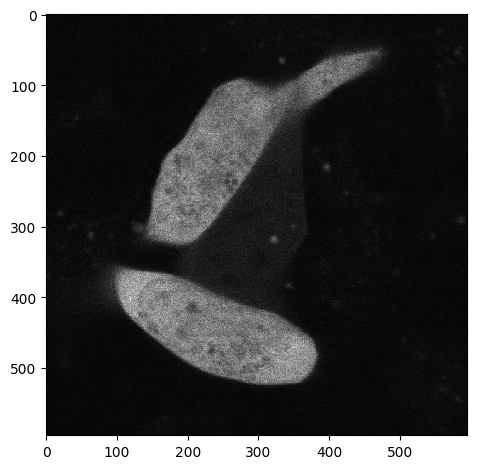

Segmented Cells


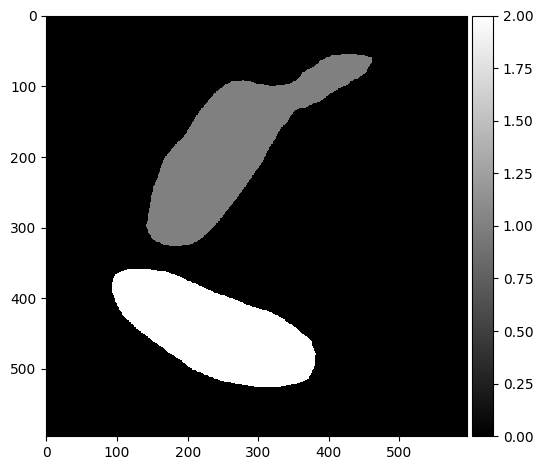

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_01.czi
Red Channel


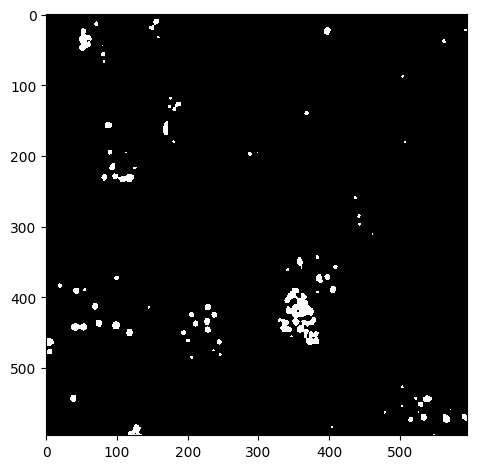

Green Channel


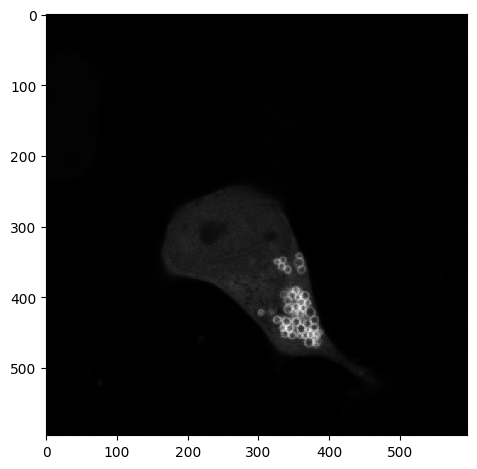

Segmented Cells


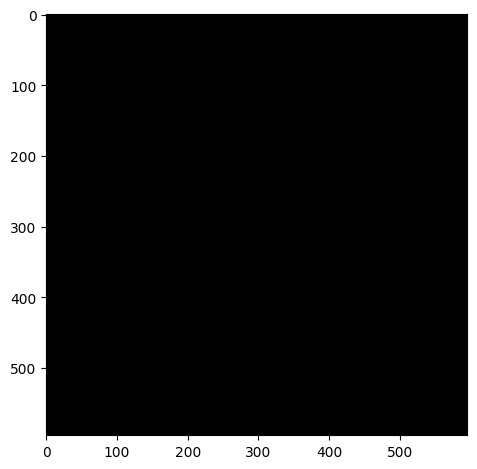

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_02.czi
Red Channel


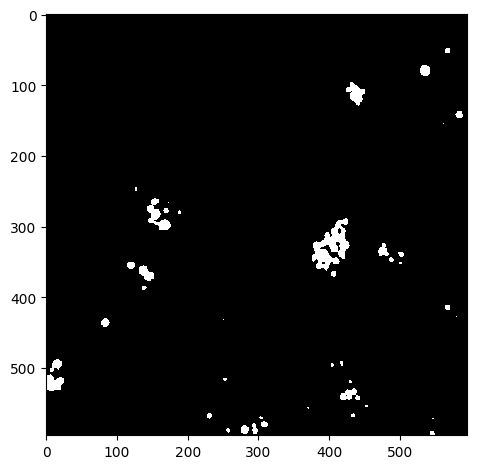

Green Channel


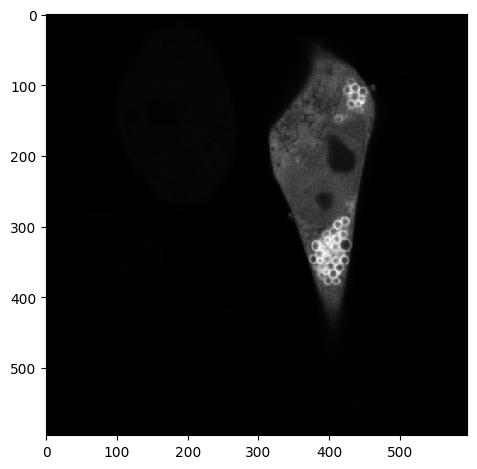

Segmented Cells


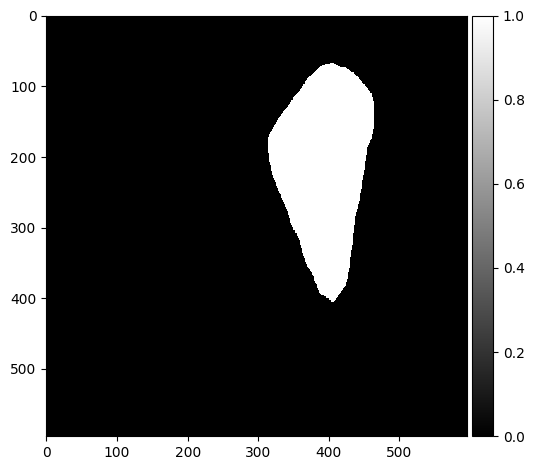

Threshold:  0.5
Bin count 144


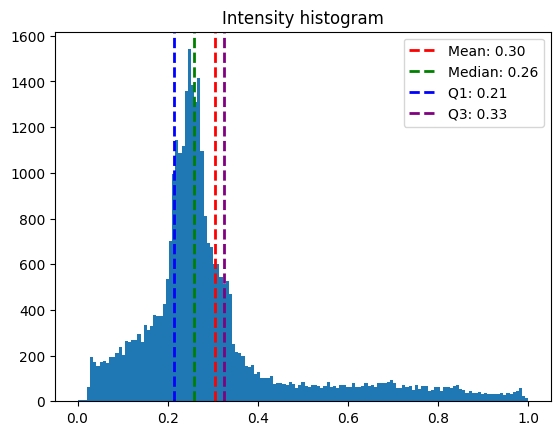

Inclusion Areas:  [ 642.   16. 2765.]


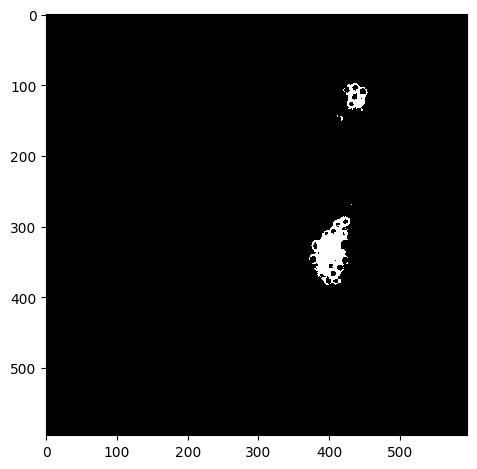

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_03.czi
Red Channel


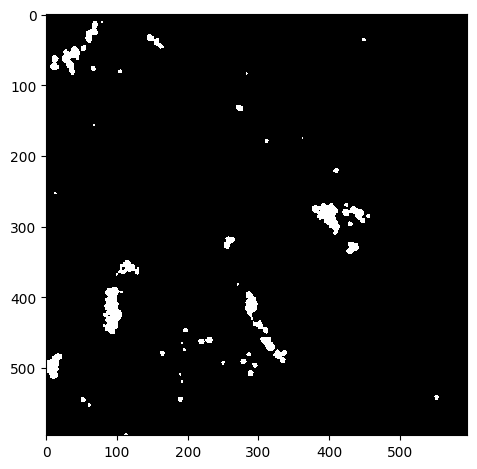

Green Channel


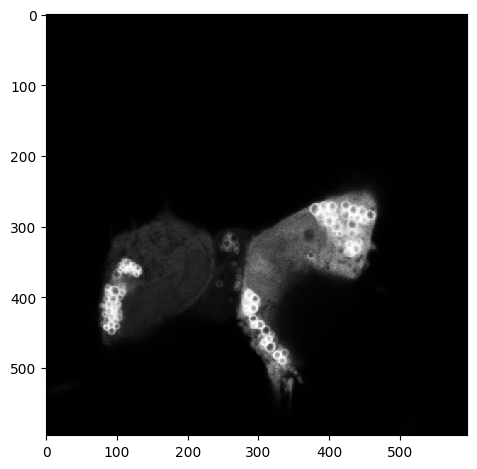

Segmented Cells


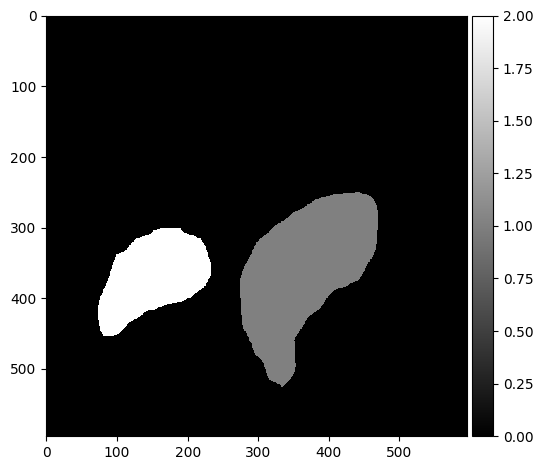

Threshold:  0.99
Bin count 46


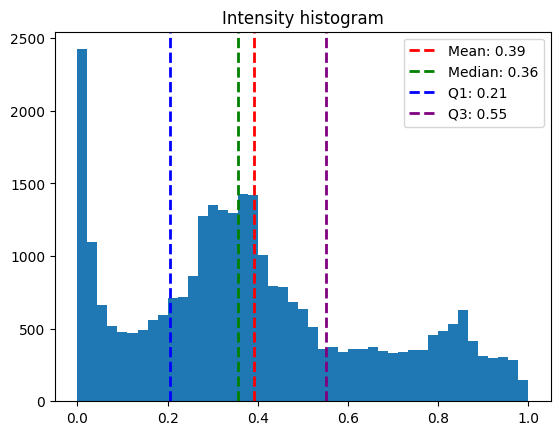

Inclusion Areas:  [22.]


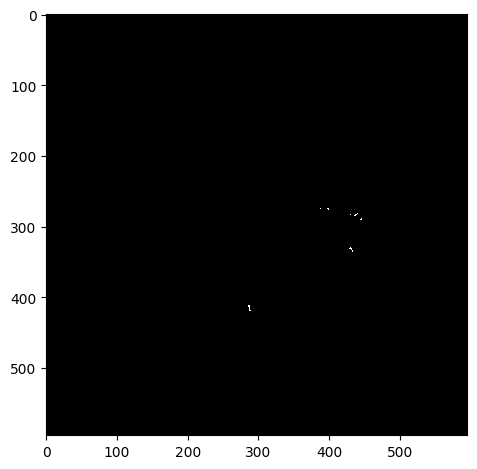

Threshold:  0.5
Bin count 76


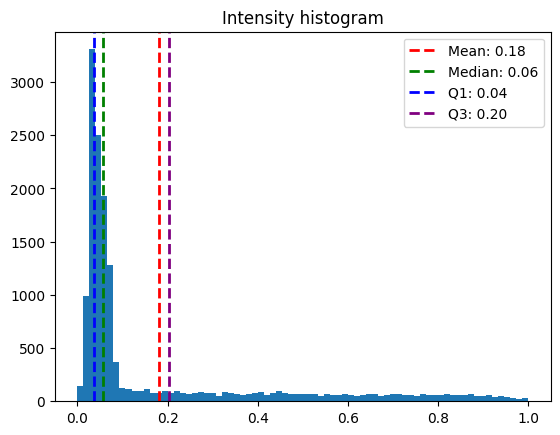

Inclusion Areas:  [ 605. 1546.]


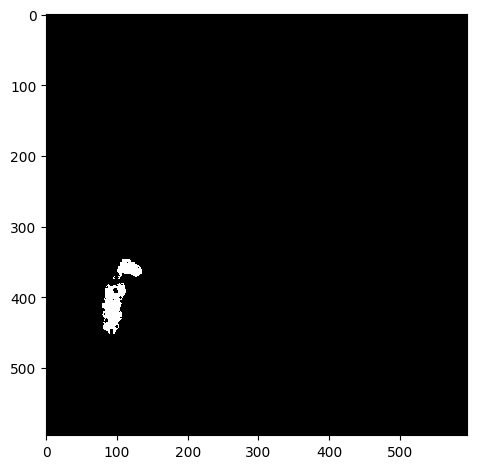

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_04.czi
Red Channel


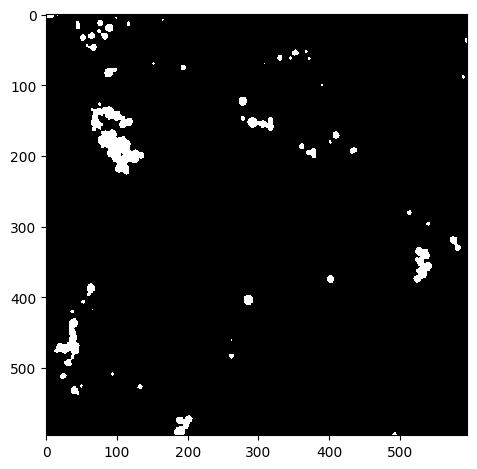

Green Channel


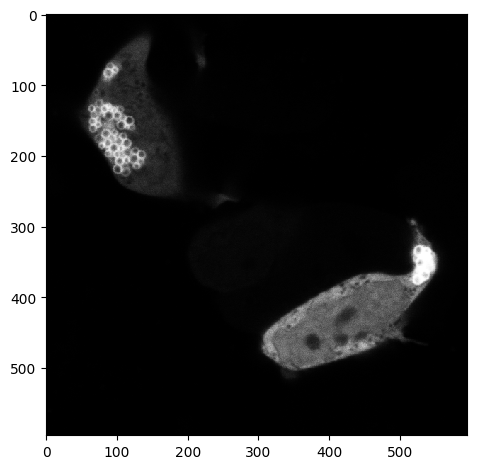

Segmented Cells


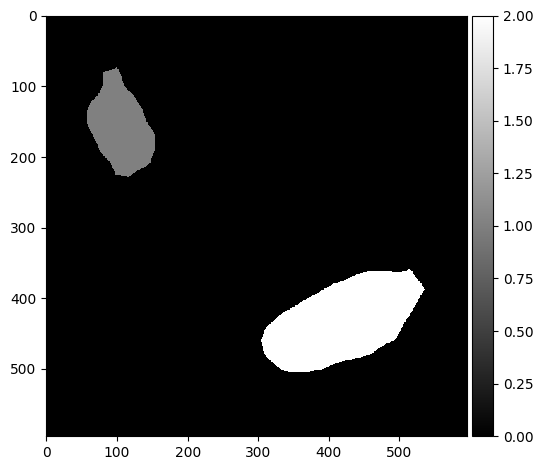

Threshold:  0.5
Bin count 120


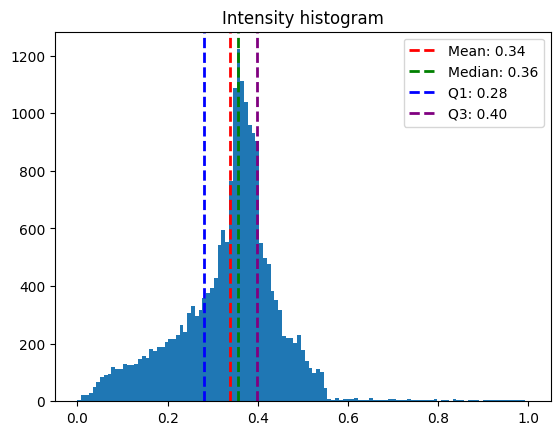

Inclusion Areas:  [276.  80.  30.  23. 336.  22. 799. 336.  14.  13.]


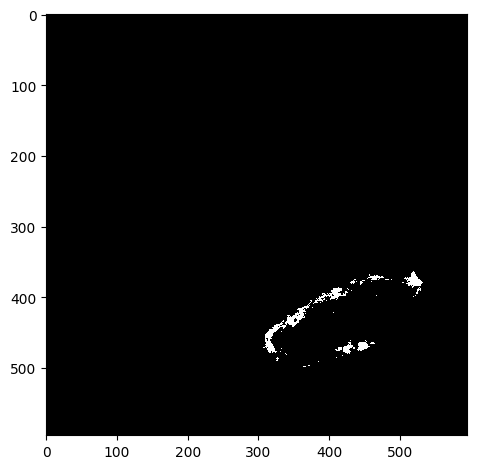

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_05.czi
Red Channel


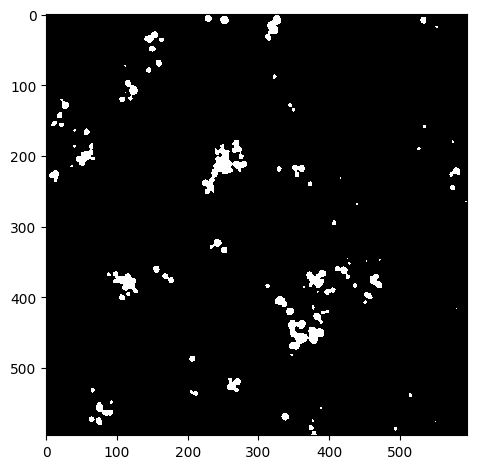

Green Channel


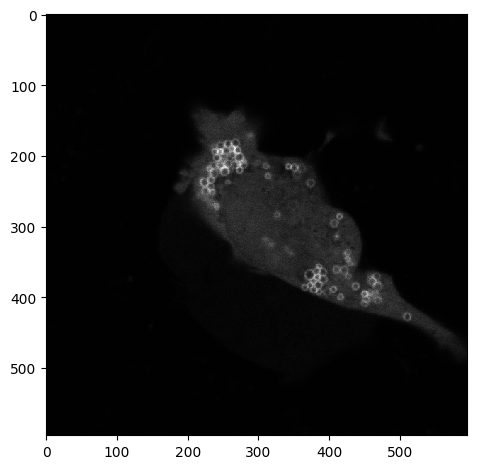

Segmented Cells


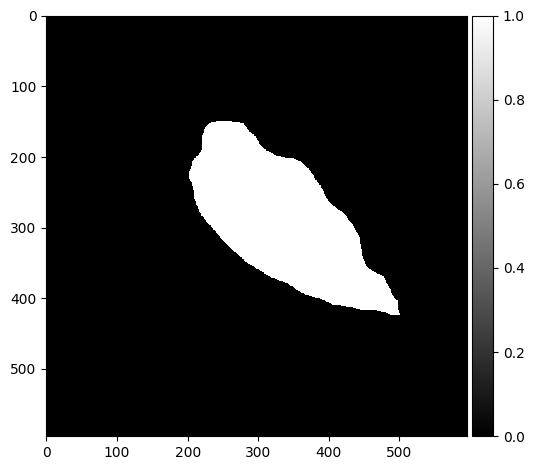

Threshold:  0.5
Bin count 157


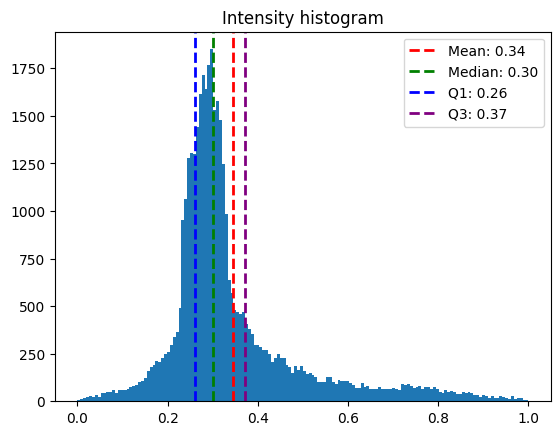

Inclusion Areas:  [245. 309. 170. 153.  11.  16.  12.  51.]


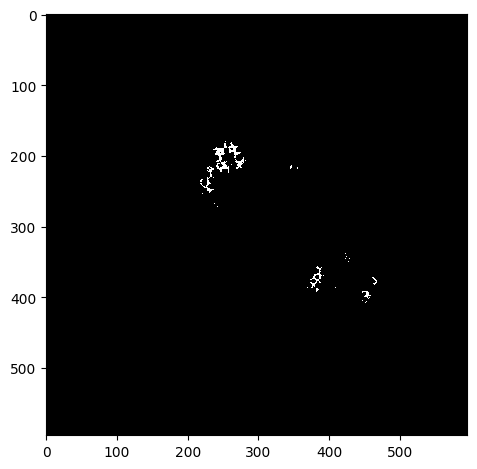

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_LT_OA_06.czi
Red Channel


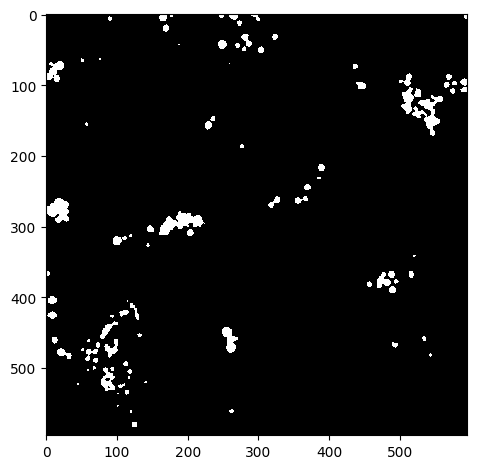

Green Channel


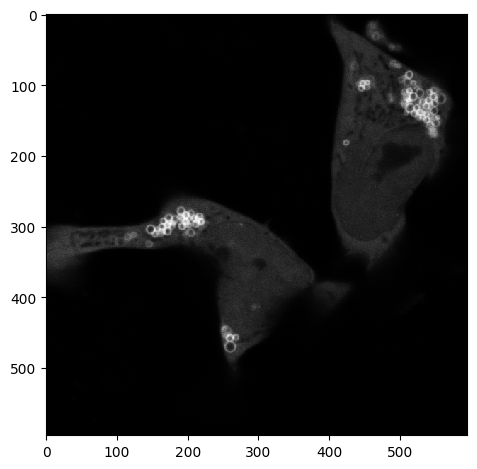

Segmented Cells


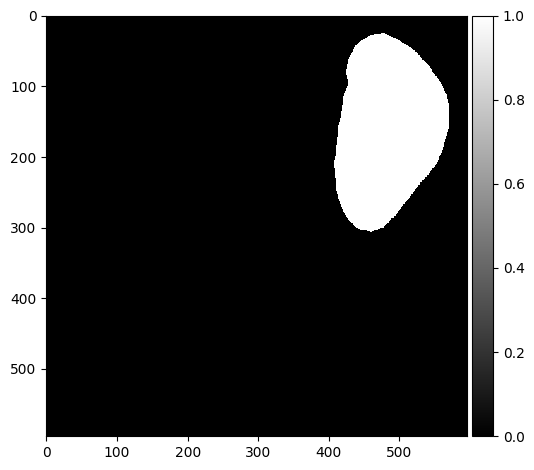

Threshold:  0.5
Bin count 249


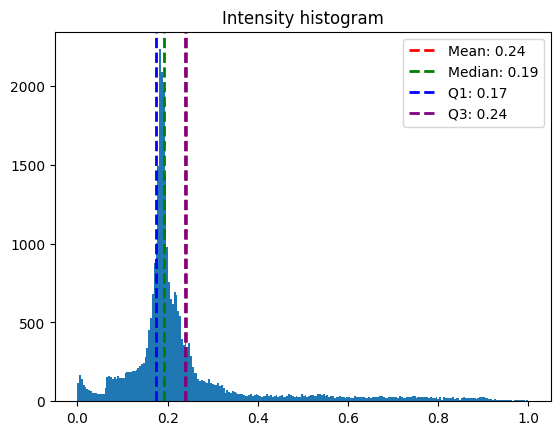

Inclusion Areas:  [  44.  145.   11. 1351.]


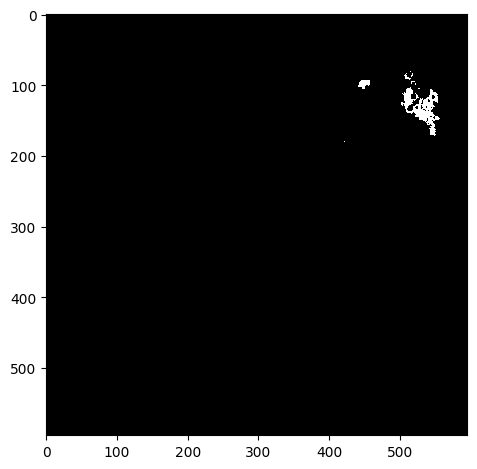

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_01.czi
Red Channel


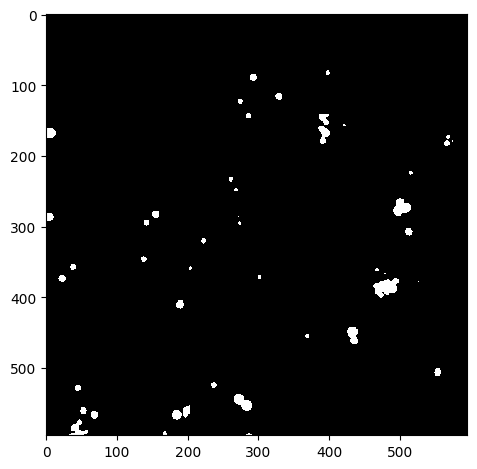

Green Channel


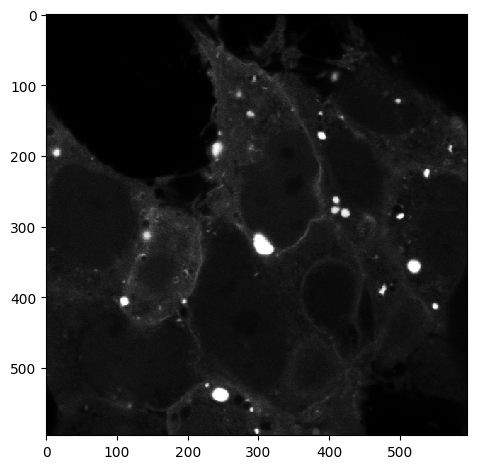

Segmented Cells


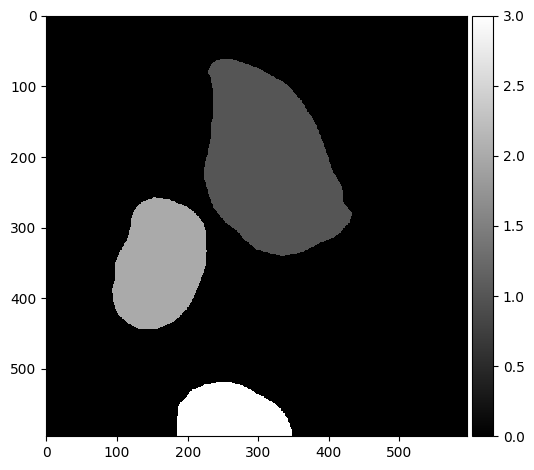

Threshold:  0.5
Bin count 239


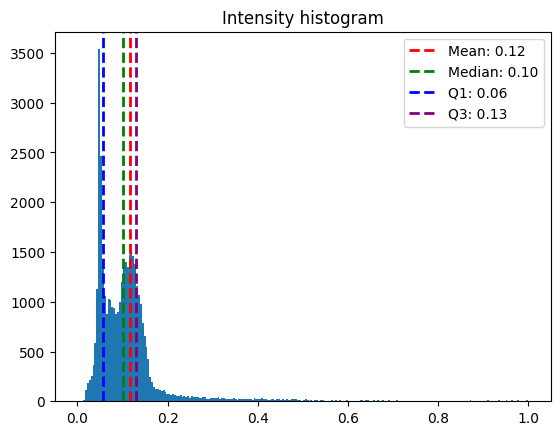

Inclusion Areas:  [ 19.  57.  51. 217.  69.  85. 115. 481.]


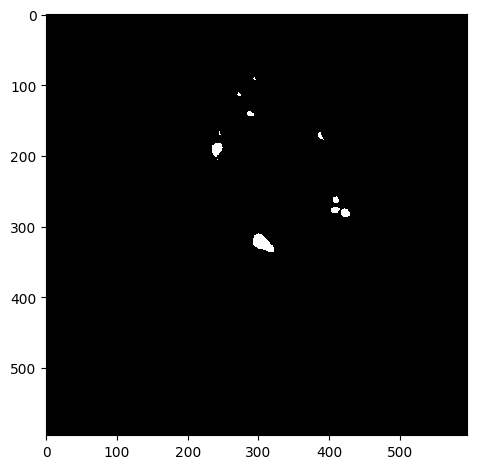

Threshold:  0.5
Bin count 151


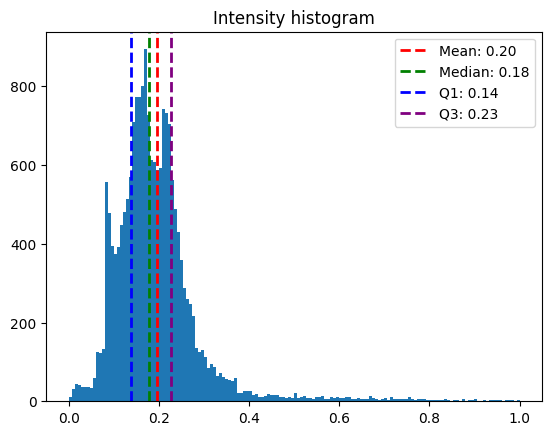

Inclusion Areas:  [ 96. 135.  29.]


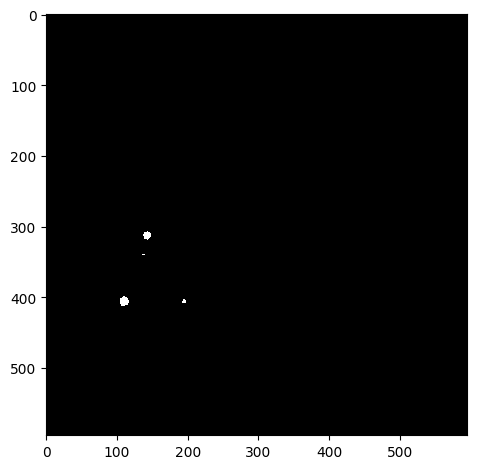

Threshold:  0.5
Bin count 153


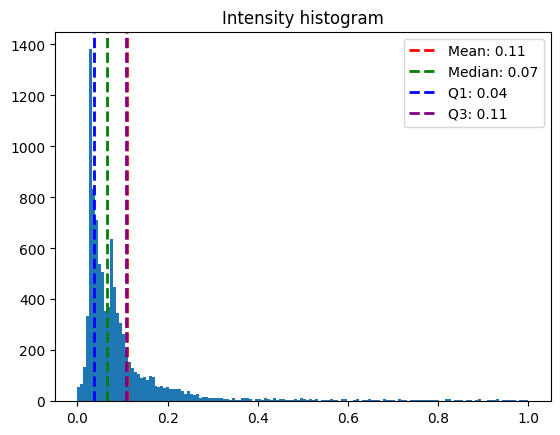

Inclusion Areas:  [ 20. 375.  26.  36.]


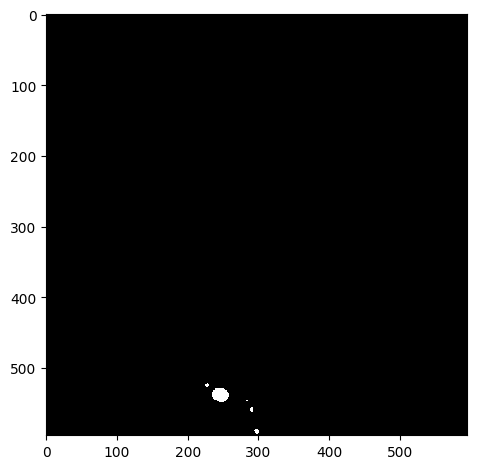

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_02.czi
Red Channel


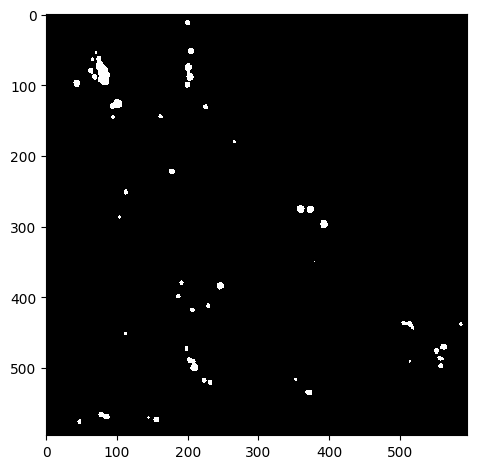

Green Channel


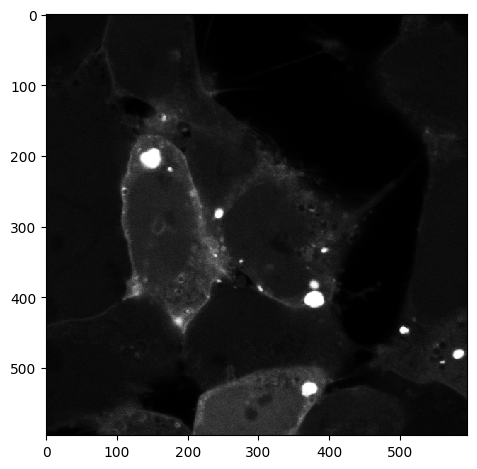

Segmented Cells


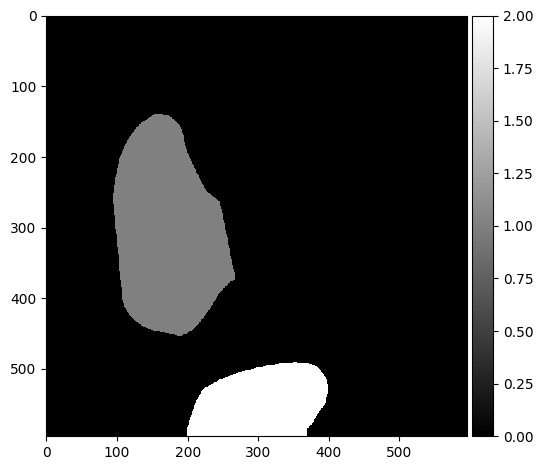

Threshold:  0.5
Bin count 188


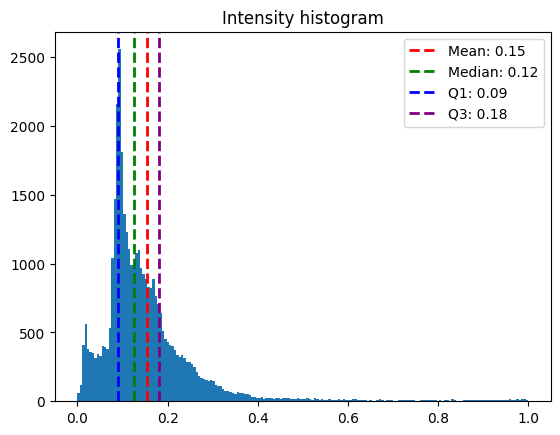

Inclusion Areas:  [ 35. 686.  30.  16.  24. 137.  25.  17.  14.  31. 117.]


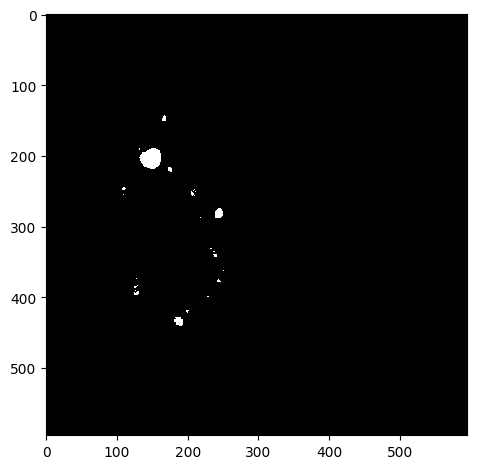

Threshold:  0.5
Bin count 326


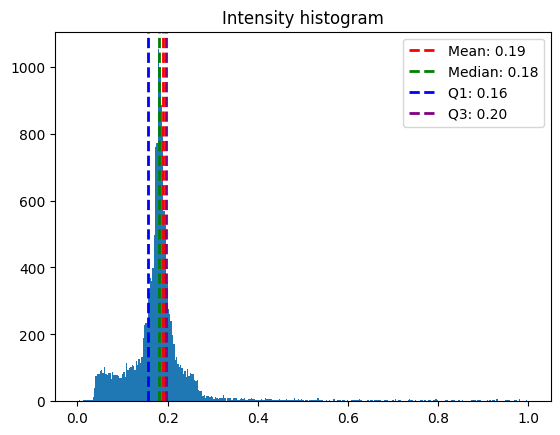

Inclusion Areas:  [381.]


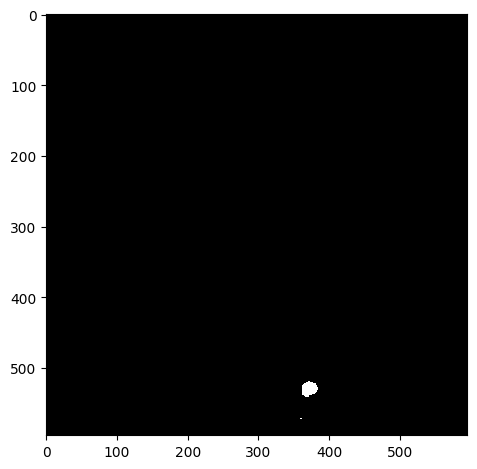

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_03.czi
Red Channel


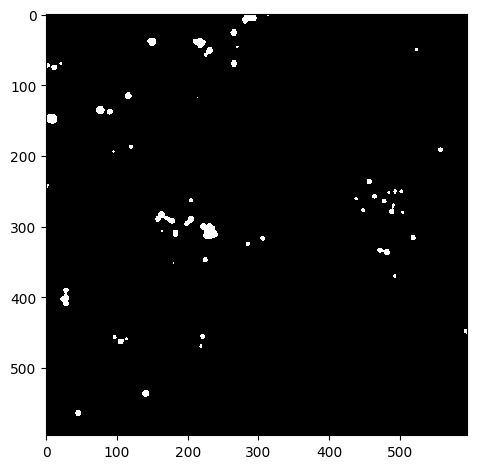

Green Channel


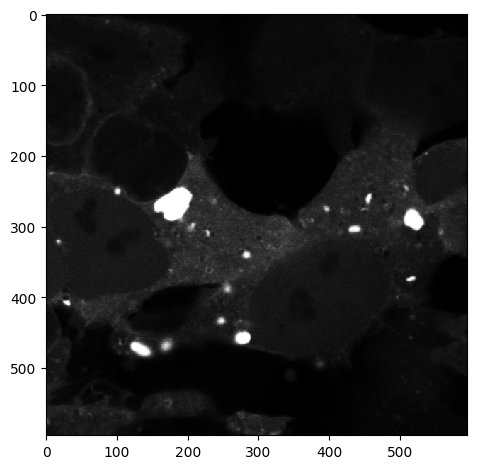

Segmented Cells


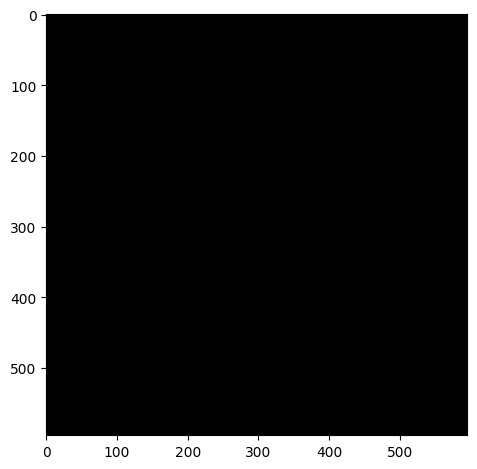

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_04.czi
Red Channel


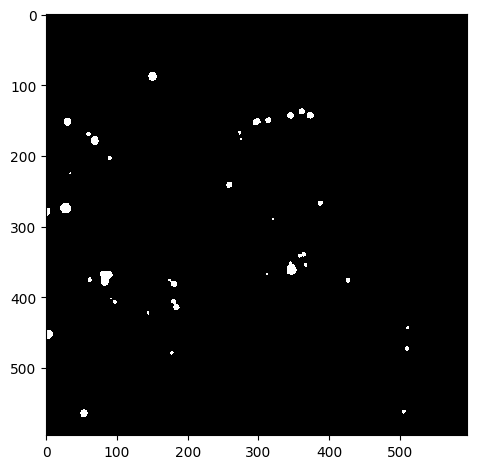

Green Channel


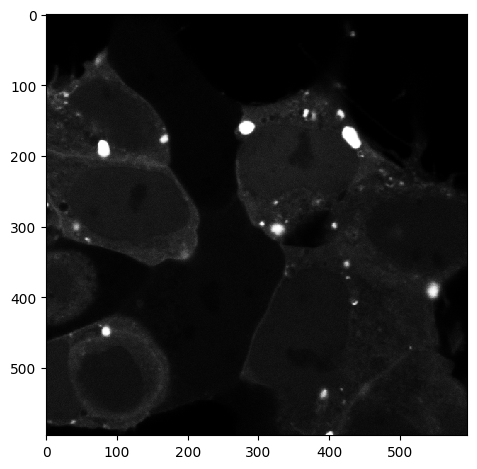

Segmented Cells


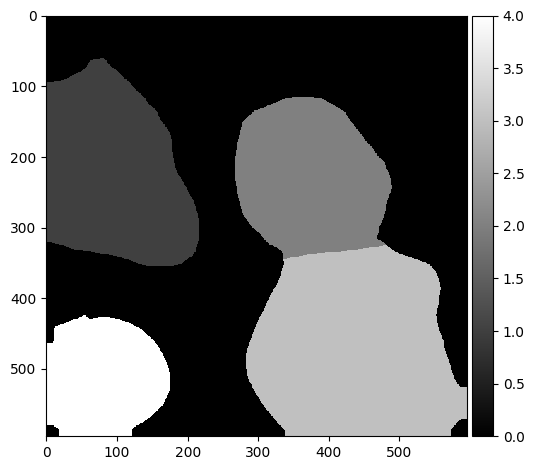

Threshold:  0.5
Bin count 356


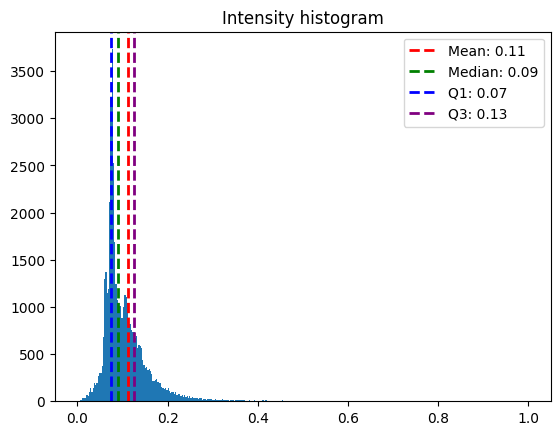

Inclusion Areas:  [ 30. 101. 350.  20.  40.  17.]


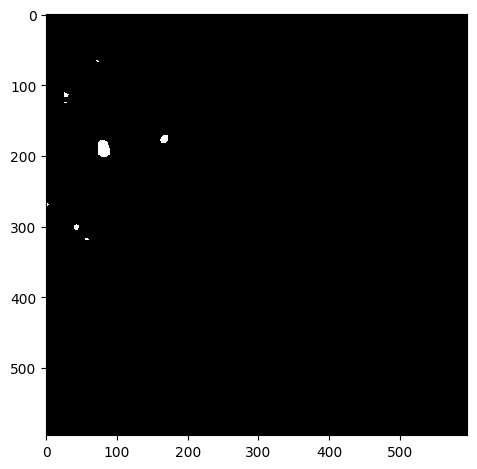

Threshold:  0.5
Bin count 452


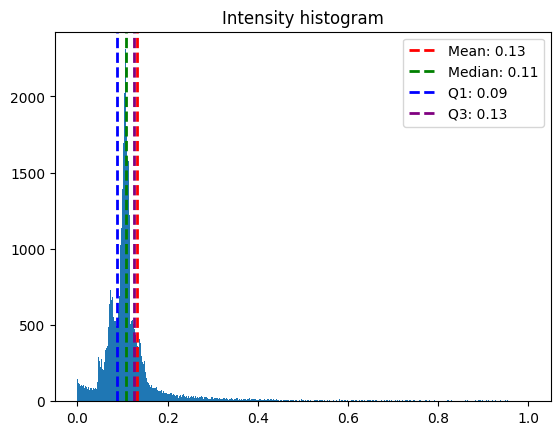

Inclusion Areas:  [ 67.  76.  29. 312. 556.  13.  32.  32. 223.]


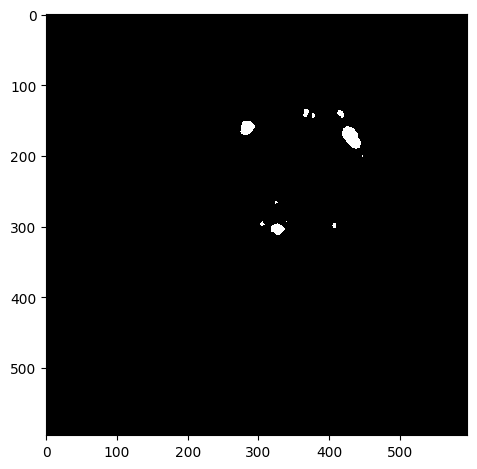

Threshold:  0.5
Bin count 654


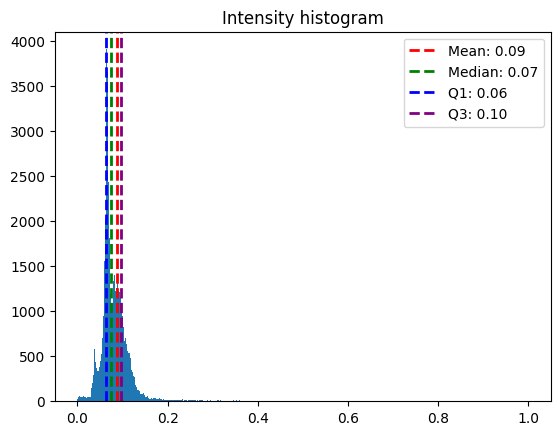

Inclusion Areas:  [ 32. 237.  22.  64.  43.]


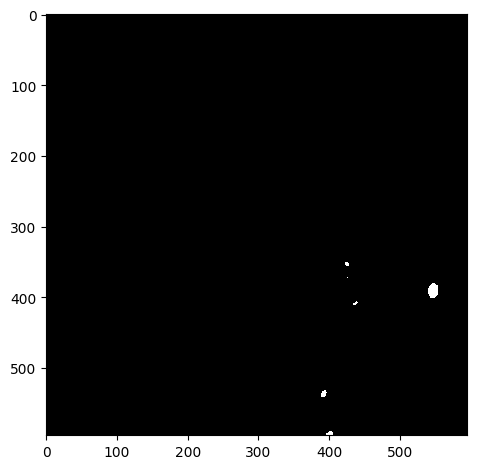

Threshold:  0.5
Bin count 188


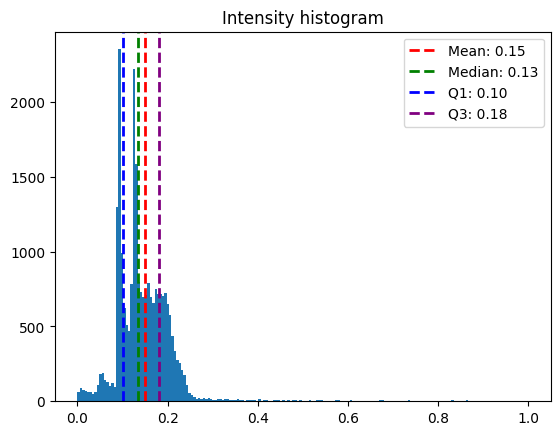

Inclusion Areas:  [139.]


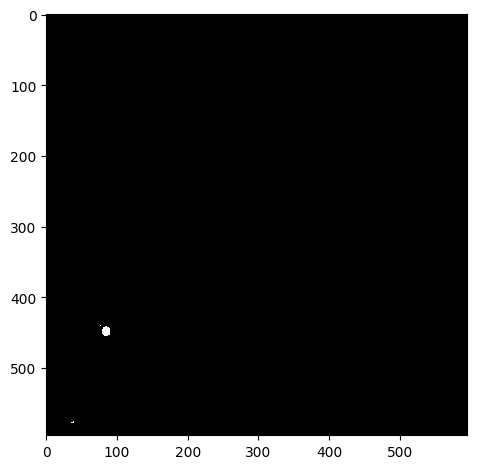

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_05.czi
Red Channel


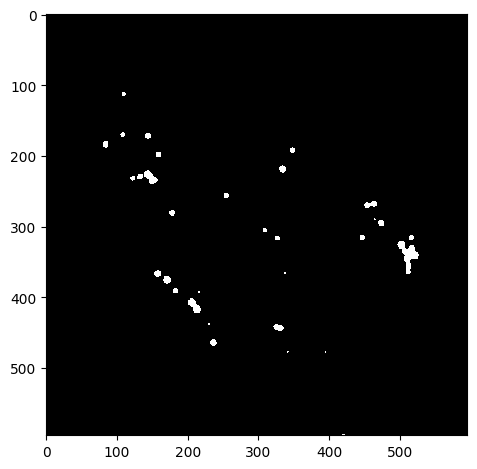

Green Channel


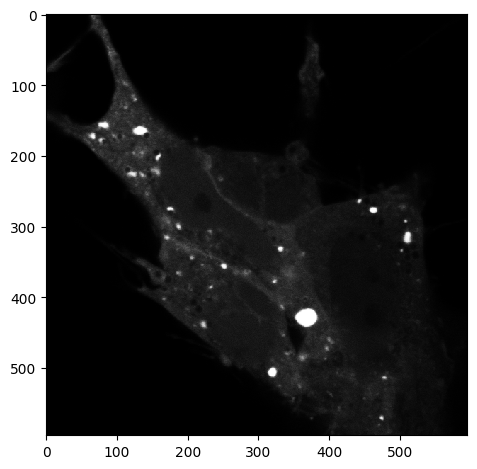

Segmented Cells


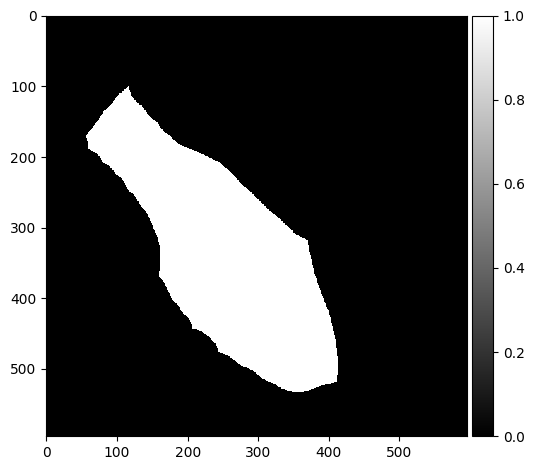

Threshold:  0.5
Bin count 269


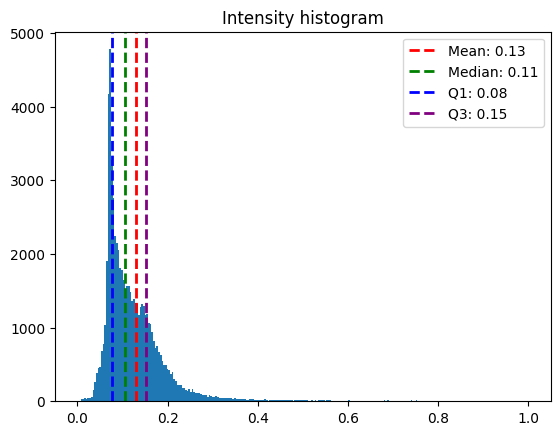

Inclusion Areas:  [110. 204.  57.  24.  42.  41.  72.  18.  34.  34.  26.  47.  14.  48.
  21.  11. 632.  39. 133.]


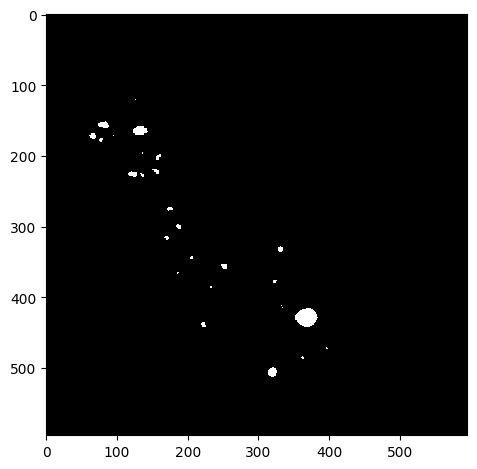

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_noOA_06.czi
Red Channel


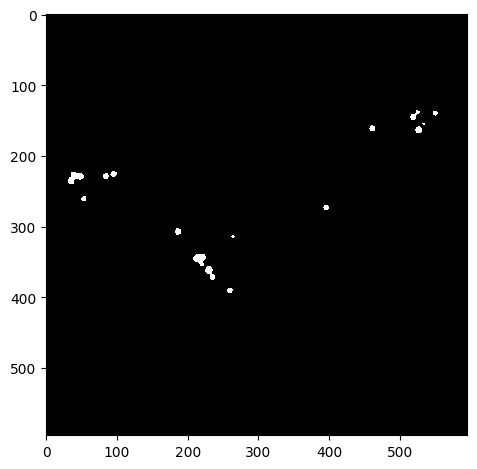

Green Channel


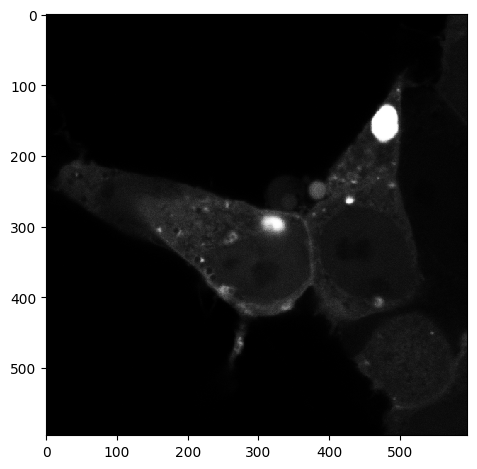

Segmented Cells


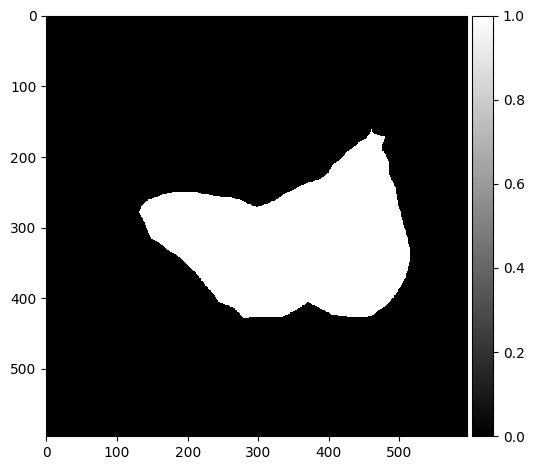

Threshold:  0.5
Bin count 278


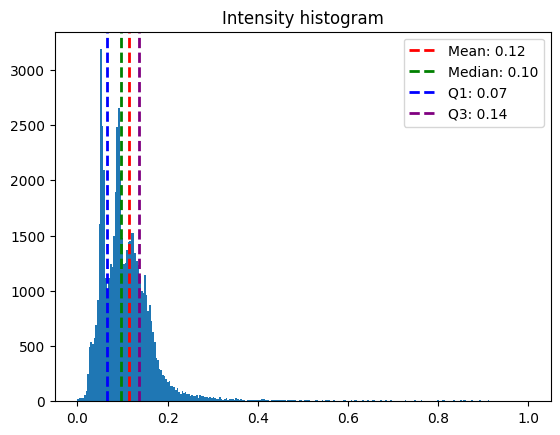

Inclusion Areas:  [171.  93. 603.  14.  12.  30.]


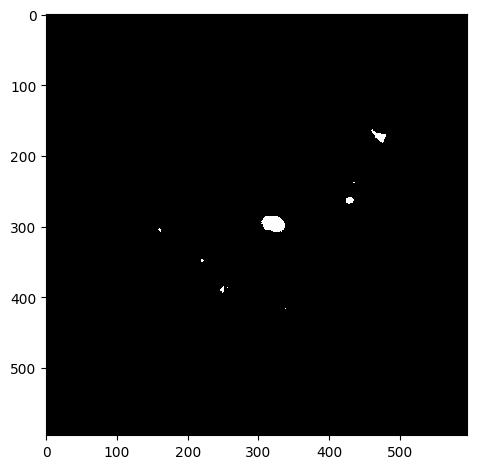

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_01.czi
Red Channel


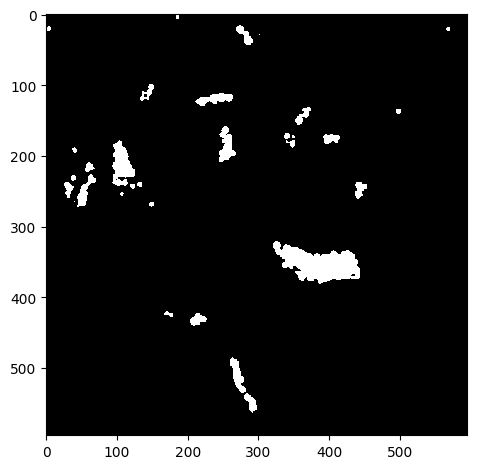

Green Channel


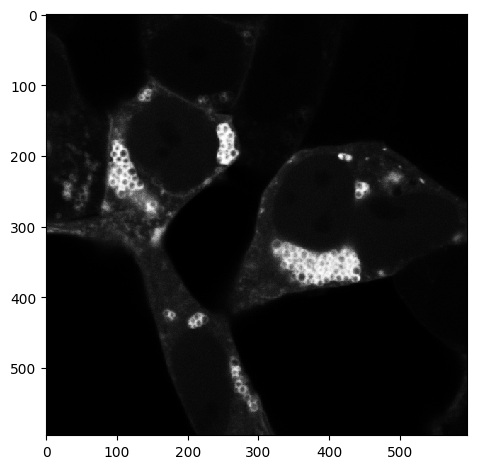

Segmented Cells


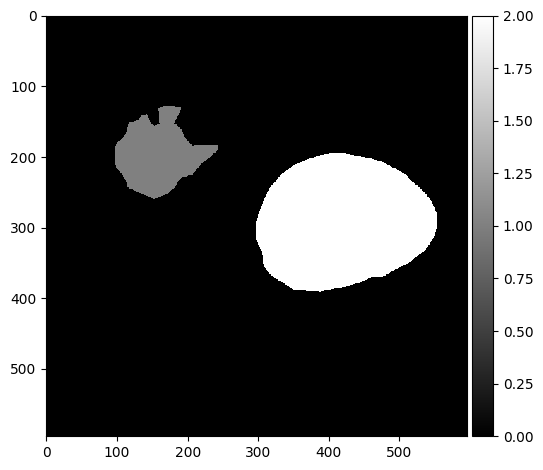

Threshold:  0.5
Bin count 139


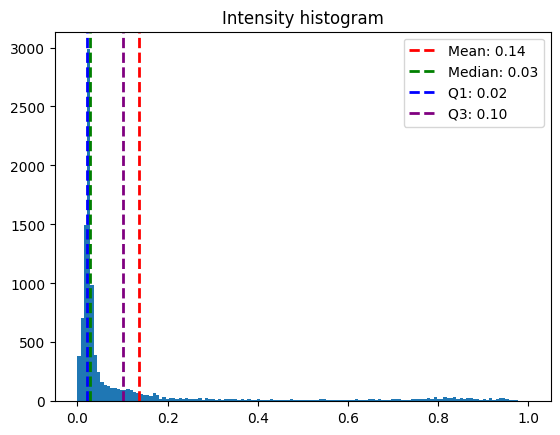

Inclusion Areas:  [937.]


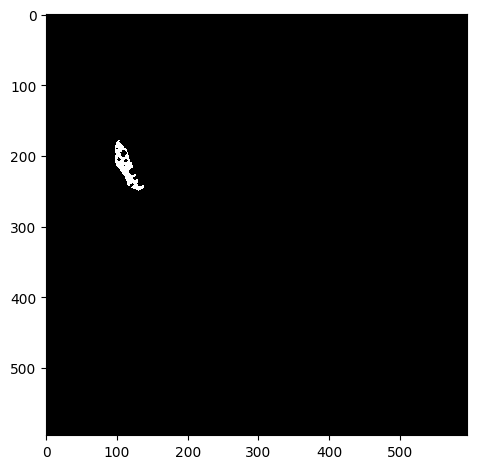

Threshold:  0.5
Bin count 144


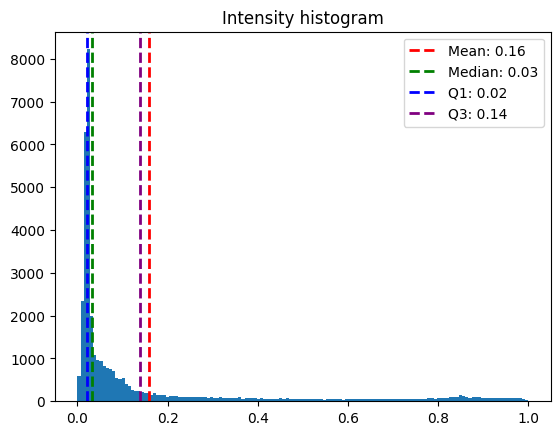

Inclusion Areas:  [ 119.   34.  218. 4273.]


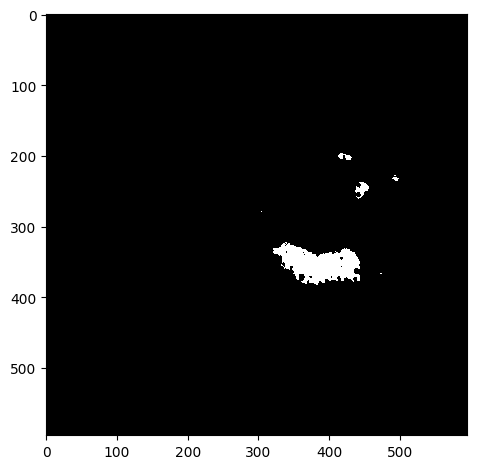

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_02.czi
Red Channel


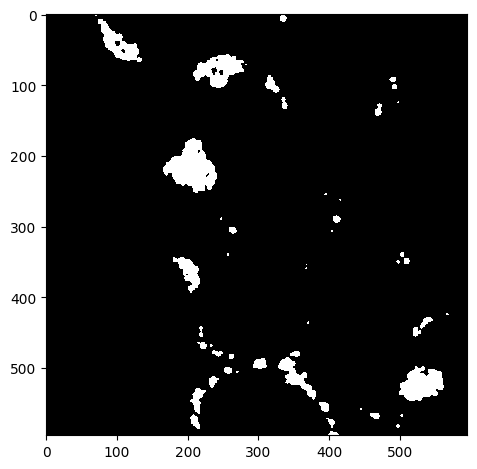

Green Channel


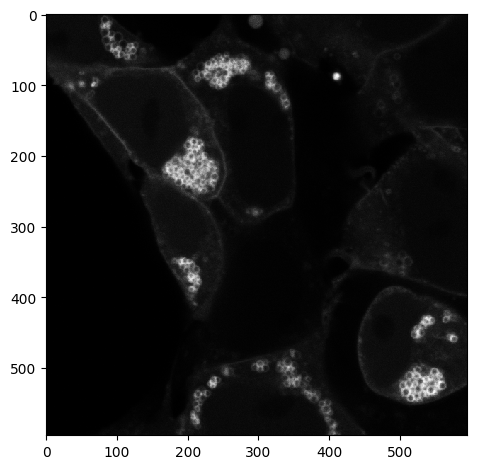

Segmented Cells


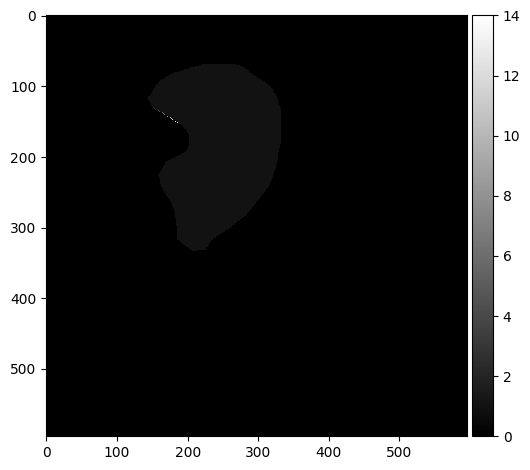

Threshold:  0.5
Bin count 101


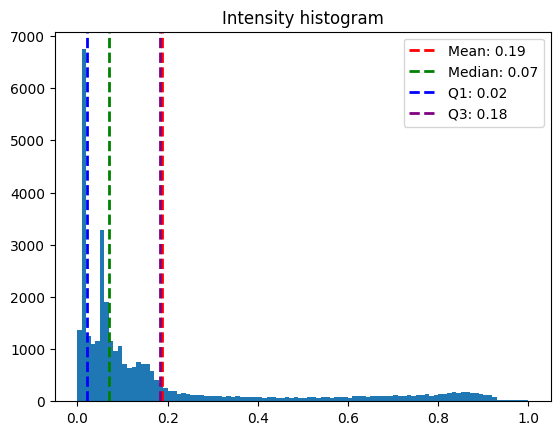

Inclusion Areas:  [ 776.   25. 2058.   18.   57.]


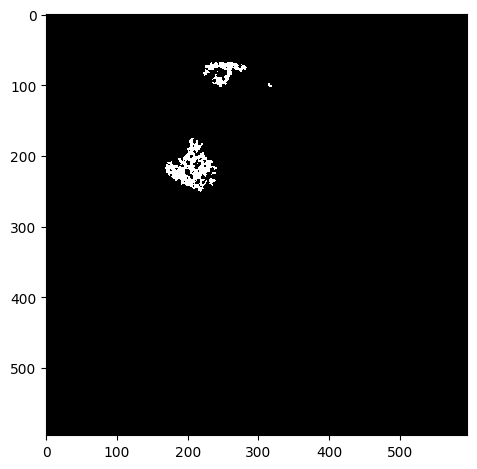

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_03.czi
Red Channel


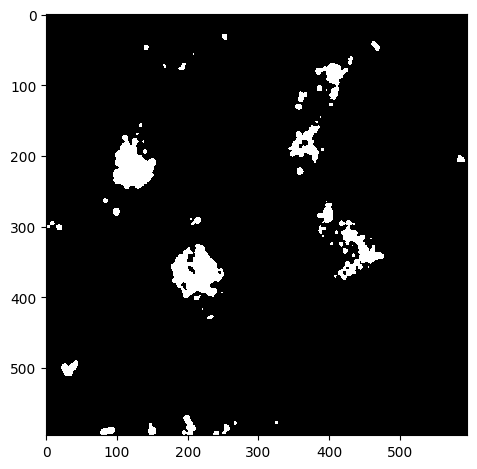

Green Channel


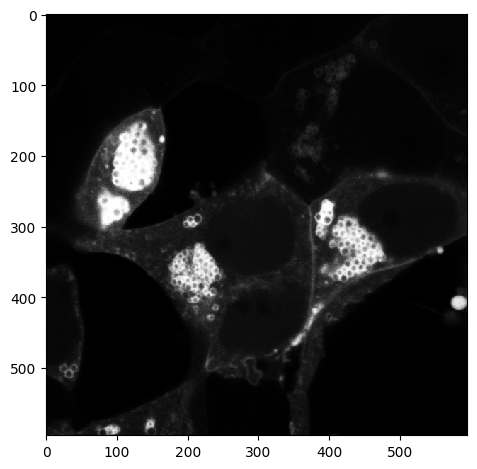

Segmented Cells


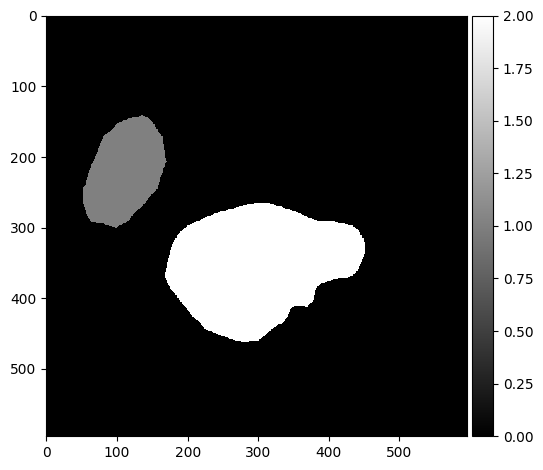

Threshold:  0.99
Bin count 20


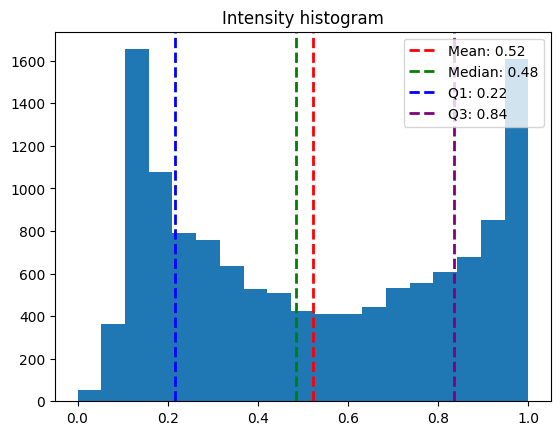

Inclusion Areas:  [359.  11. 533.  89. 368.  23.]


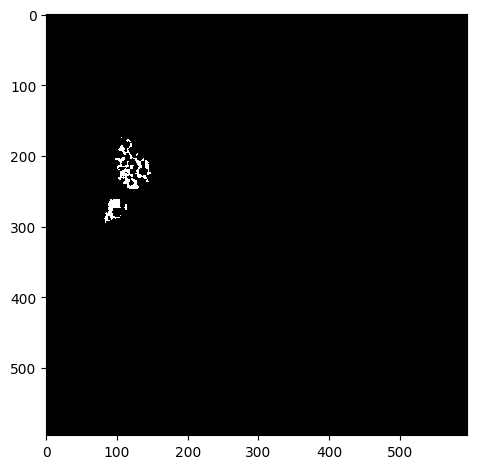

Threshold:  0.5
Bin count 66


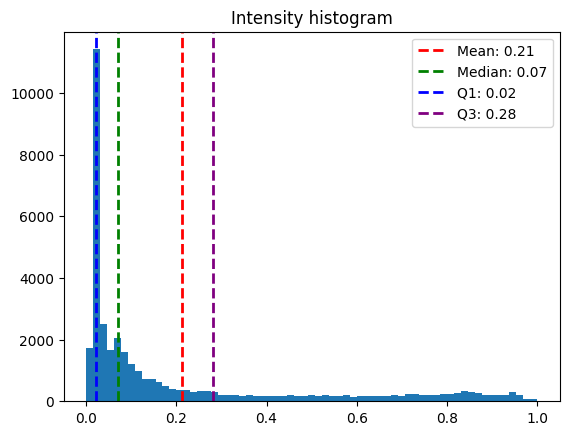

Inclusion Areas:  [ 352. 2305.   78. 3077.   50.   16.]


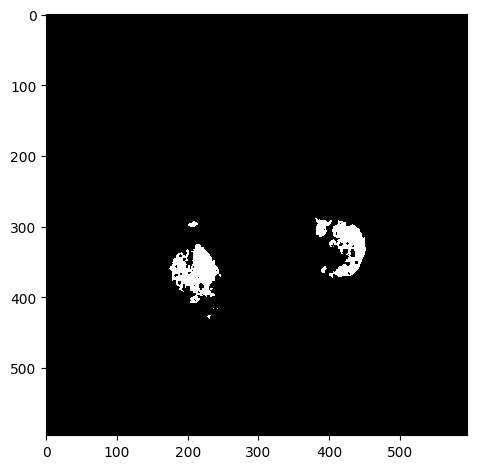

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_04.czi
Red Channel


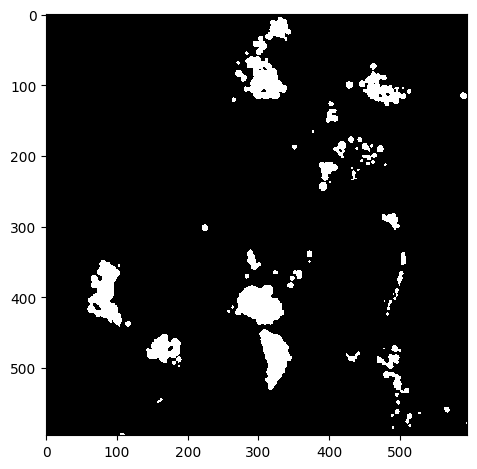

Green Channel


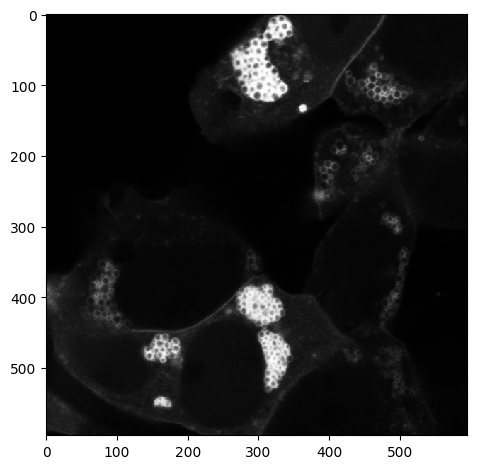

Segmented Cells


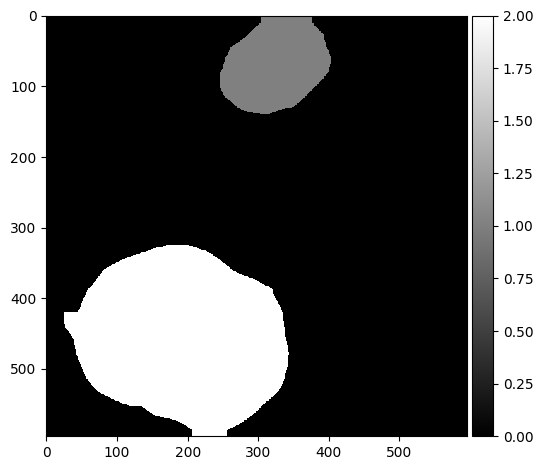

Threshold:  0.99
Bin count 25


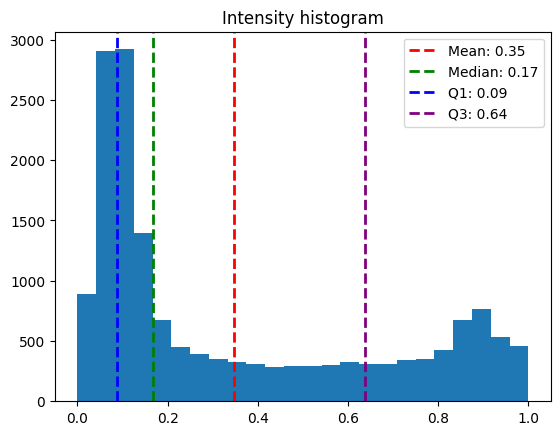

Inclusion Areas:  [19. 30. 14. 19. 34. 21. 43. 14. 19.]


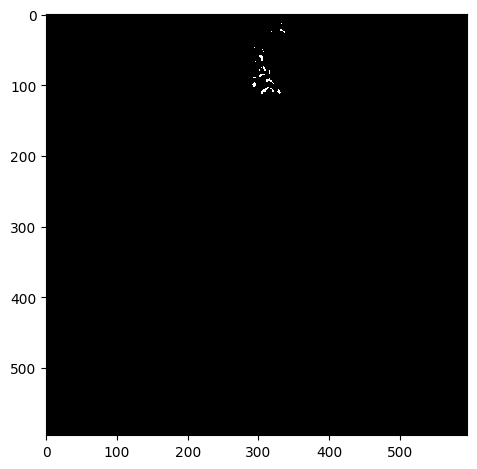

Threshold:  0.5
Bin count 215


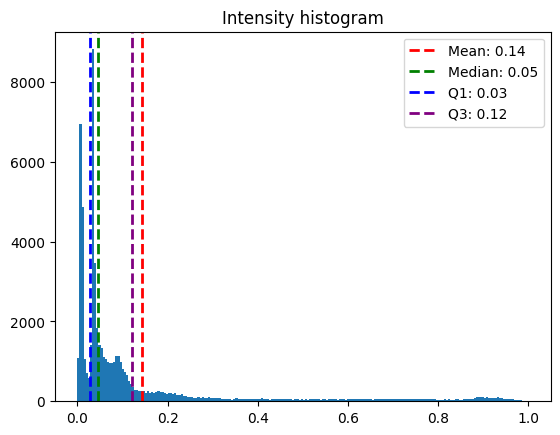

Inclusion Areas:  [2401. 2067.  963.  239.]


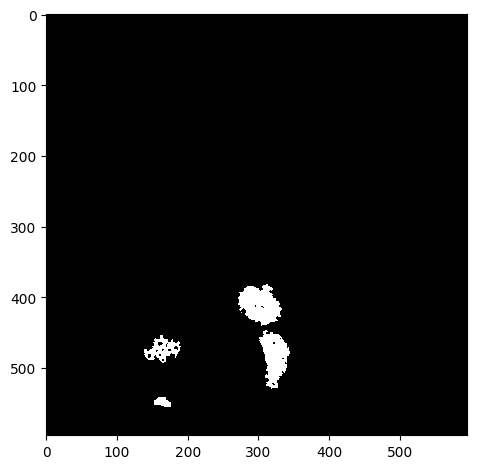

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_05.czi
Red Channel


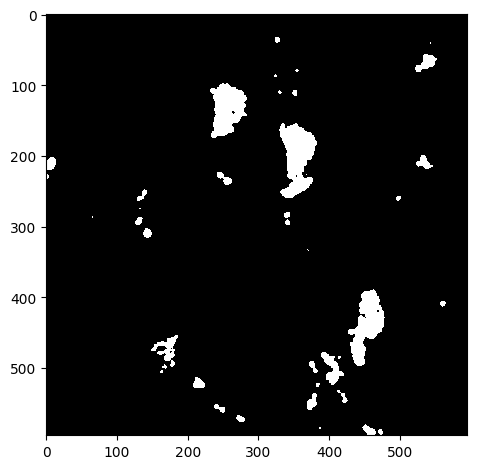

Green Channel


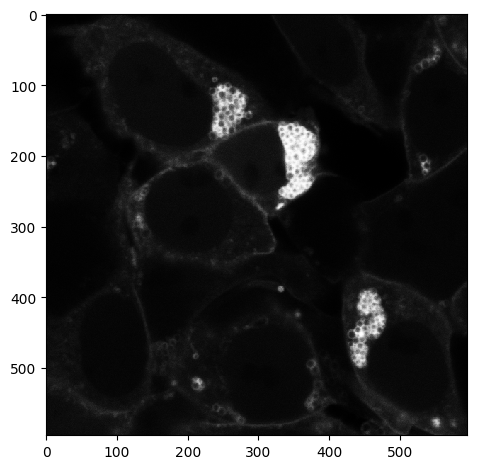

Segmented Cells


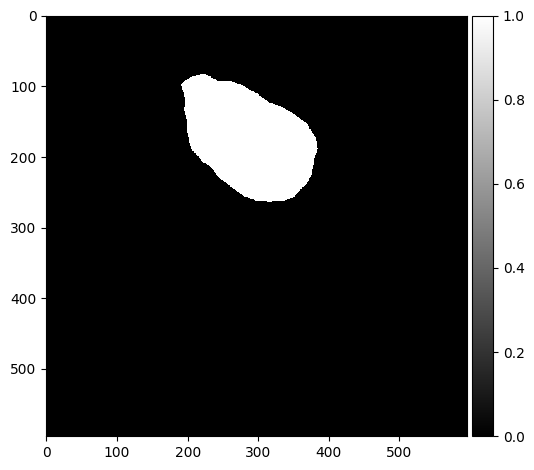

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_FIP200_LT_OA_06.czi
Red Channel


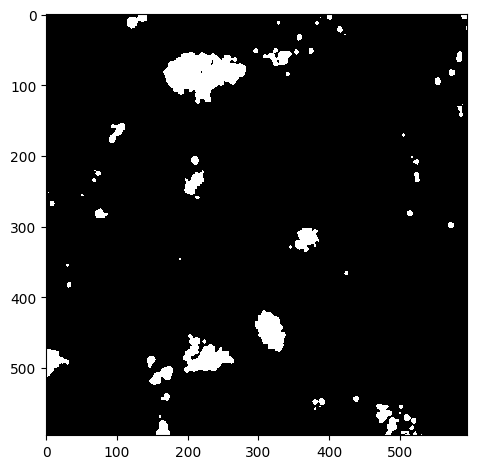

Green Channel


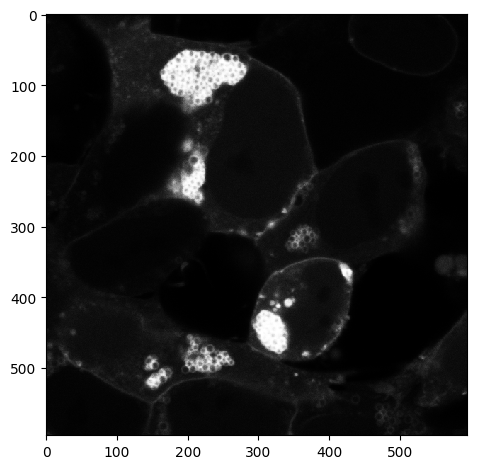

Segmented Cells


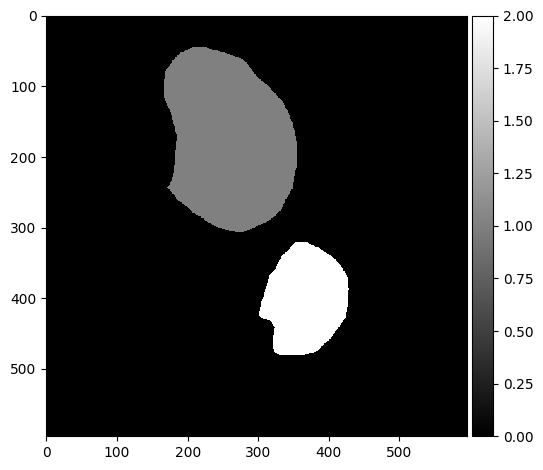

Threshold:  0.5
Bin count 54


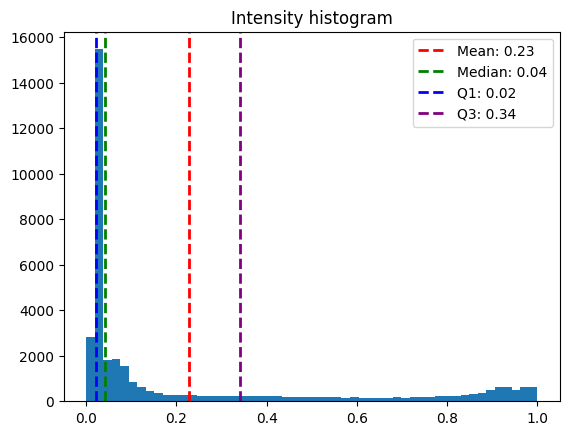

Inclusion Areas:  [5846.   92. 1710.]


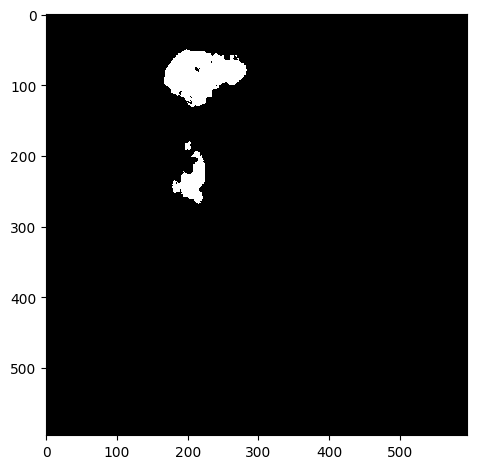

Threshold:  0.5
Bin count 110


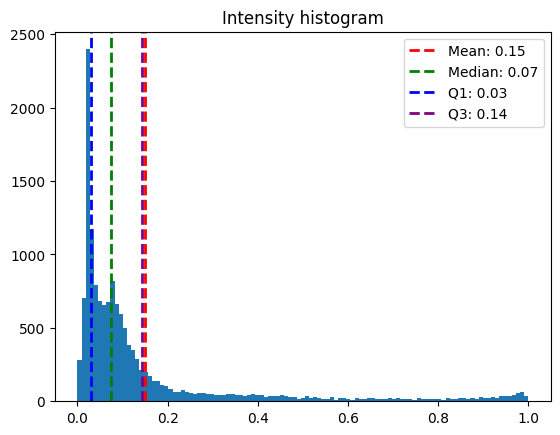

Inclusion Areas:  [  18.  127.  129.   30.   63. 1056.   12.]


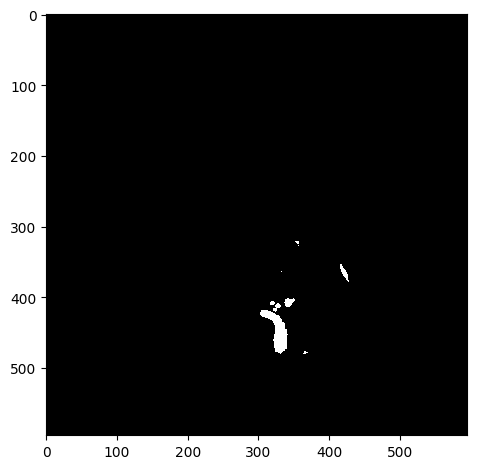

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_01.czi
Red Channel


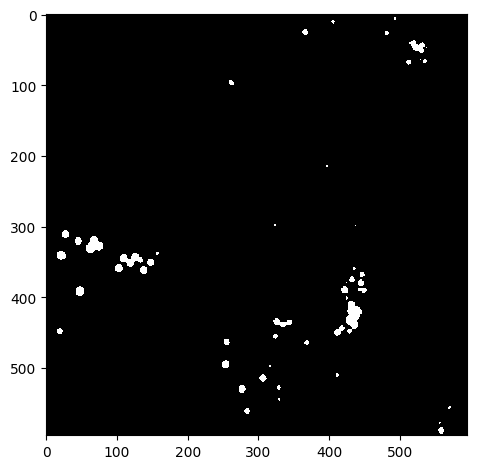

Green Channel


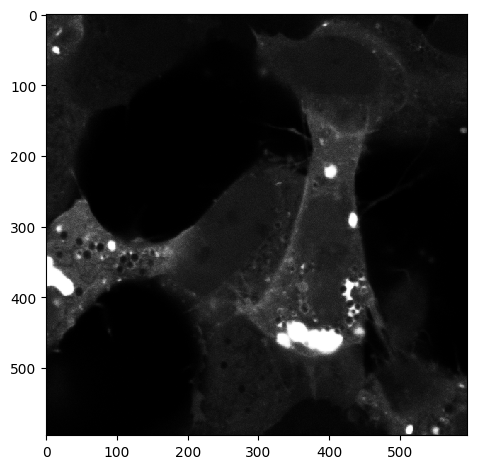

Segmented Cells


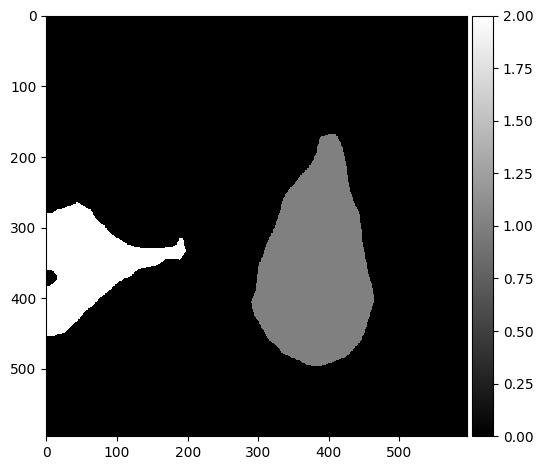

Threshold:  0.5
Bin count 134


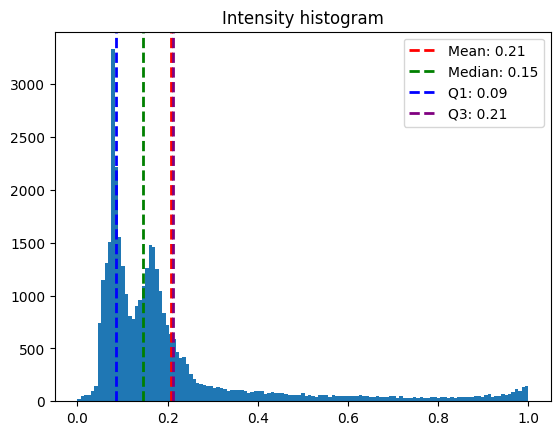

Inclusion Areas:  [ 292.  229.   18.   29.  332.   17.  131. 2657.   47.   13.  119.]


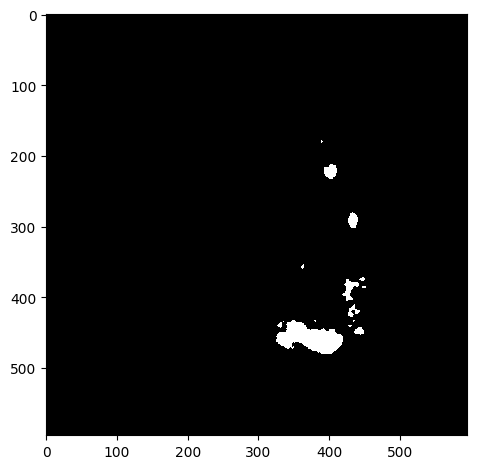

Threshold:  0.5
Bin count 133


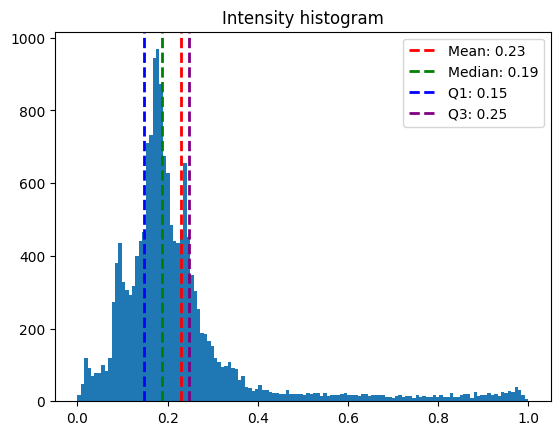

Inclusion Areas:  [ 70.  41. 163.  30.  18.  15.  35.  30.  23. 937.  19.]


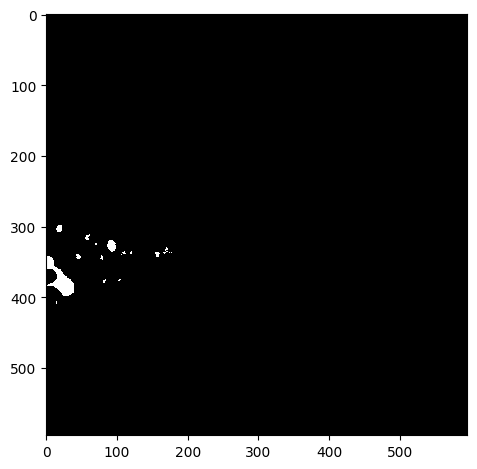

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_02.czi
Red Channel


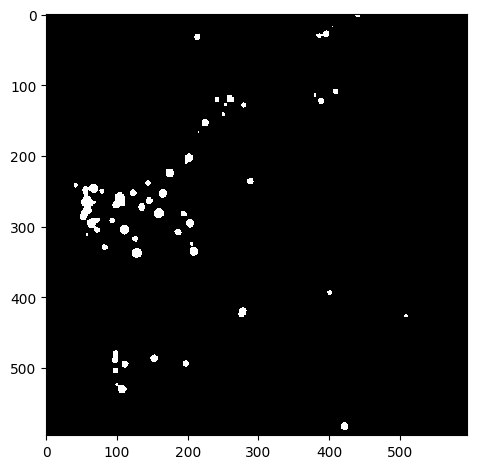

Green Channel


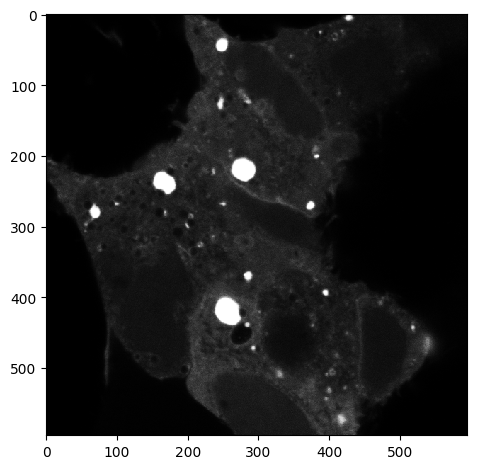

Segmented Cells


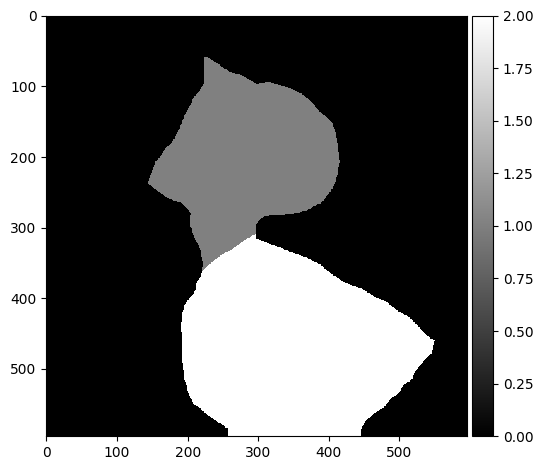

Threshold:  0.5
Bin count 351


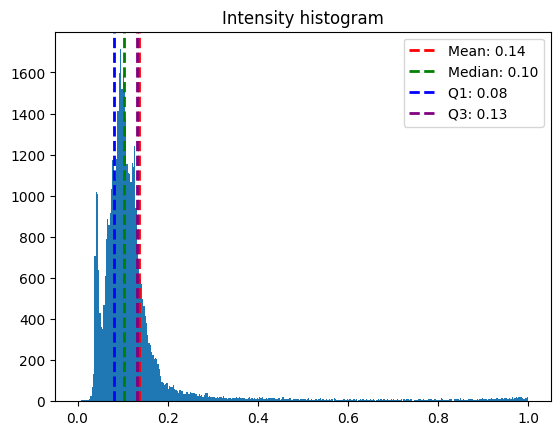

Inclusion Areas:  [106.  32.  34. 901.  17. 741.  77.  21.]


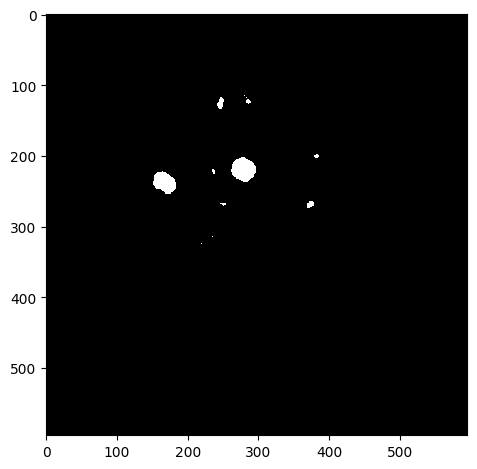

Threshold:  0.5
Bin count 291


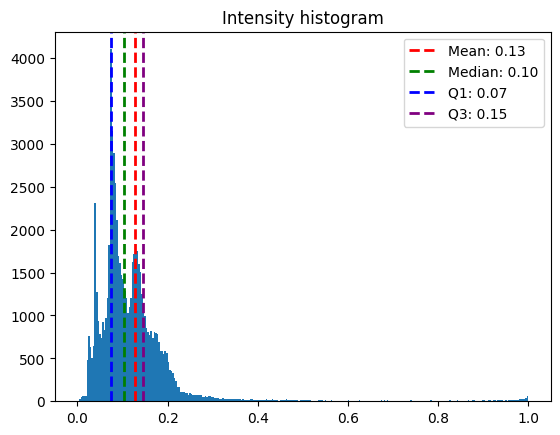

Inclusion Areas:  [ 120.   54. 1172.   33.   20.   25.   31.  118.]


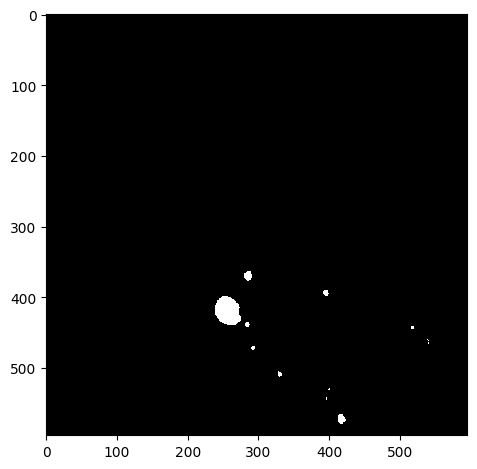

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_03.czi
Red Channel


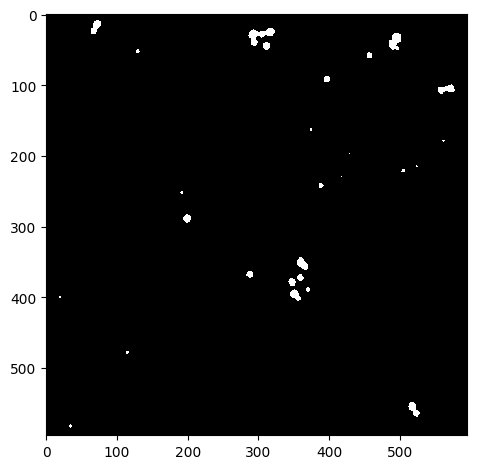

Green Channel


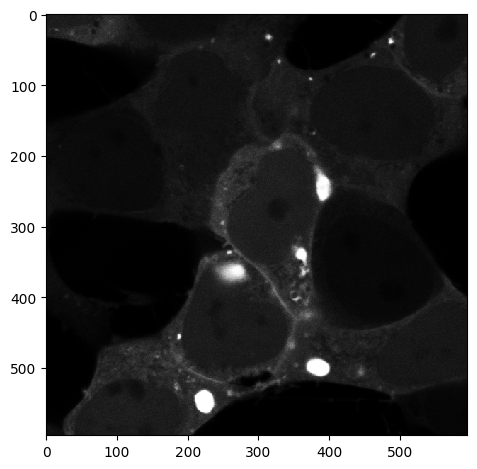

Segmented Cells


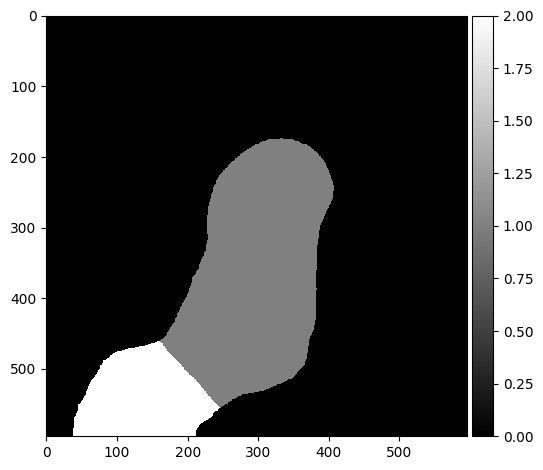

Threshold:  0.5
Bin count 219


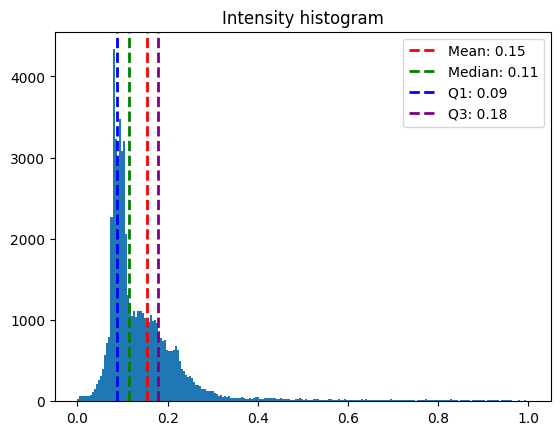

Inclusion Areas:  [672.  14. 363.  23. 689.  33.  32.  46.]


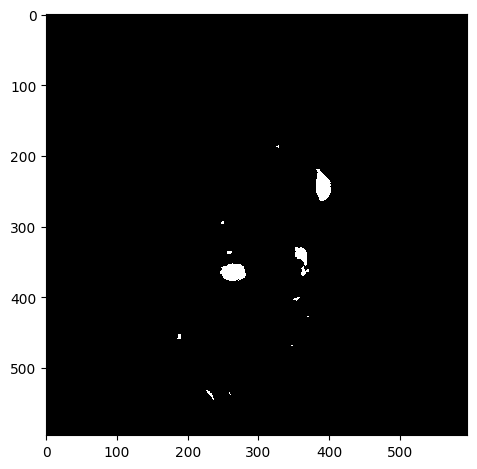

Threshold:  0.5
Bin count 225


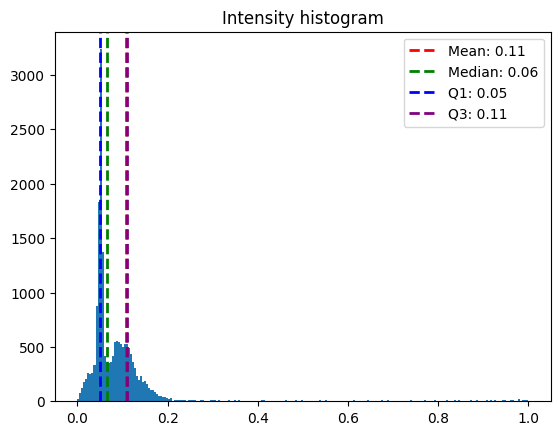

Inclusion Areas:  [683.]


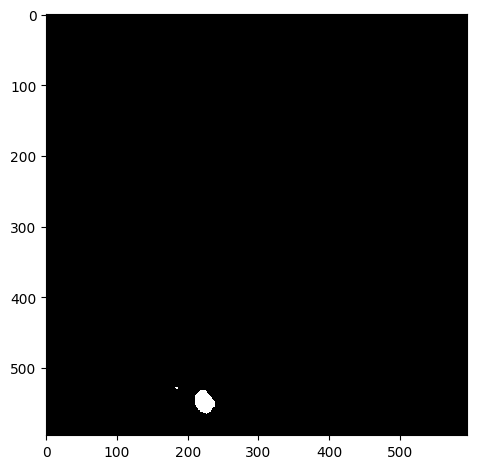

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_04.czi
Red Channel


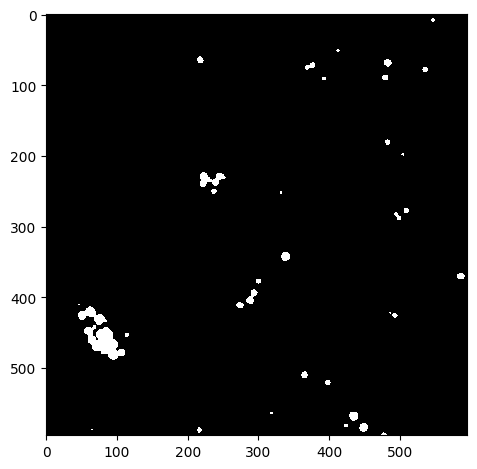

Green Channel


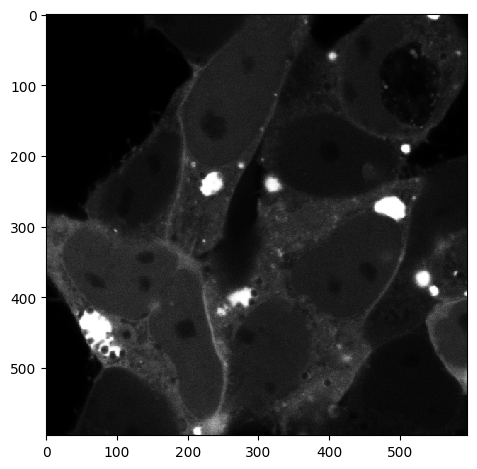

Segmented Cells


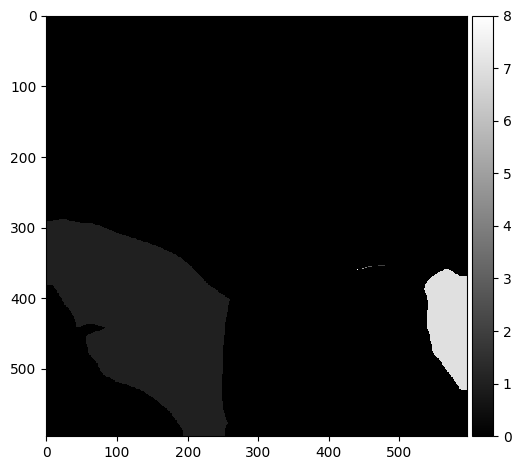

Threshold:  0.5
Bin count 254


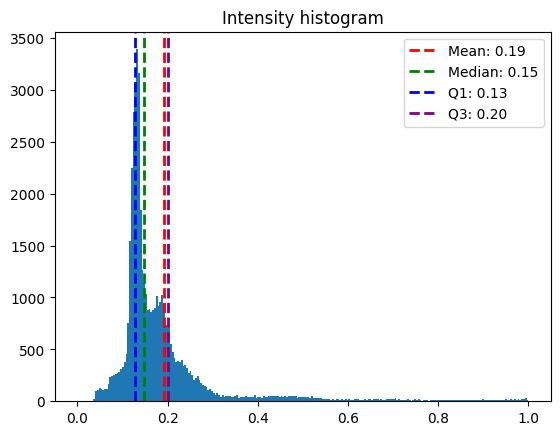

Inclusion Areas:  [  13.  149. 1726.  317.  156.]


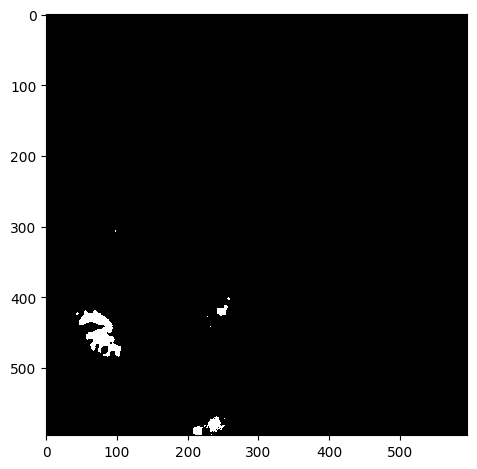

Threshold:  0.5
Bin count 76


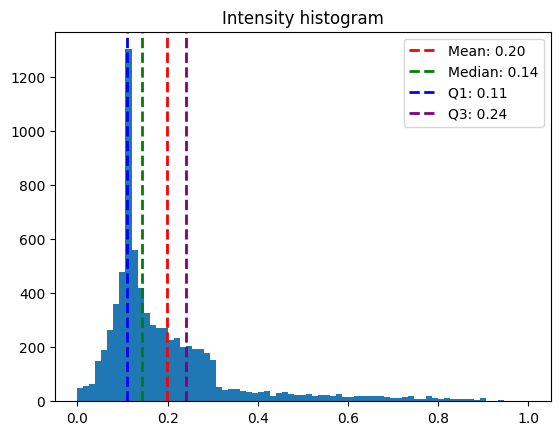

Inclusion Areas:  [ 15.  43. 156.  30.  59.]


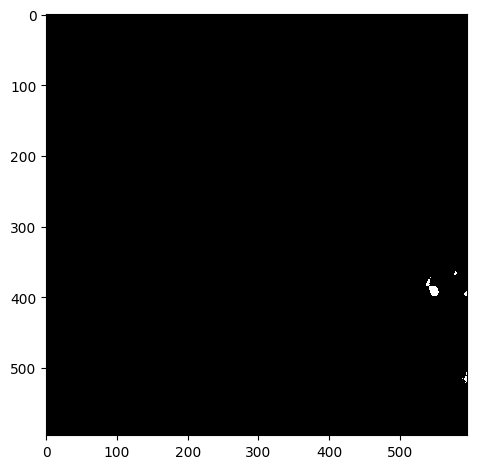

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_05.czi
Red Channel


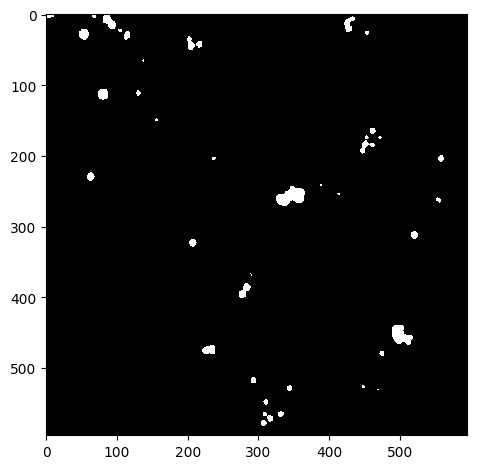

Green Channel


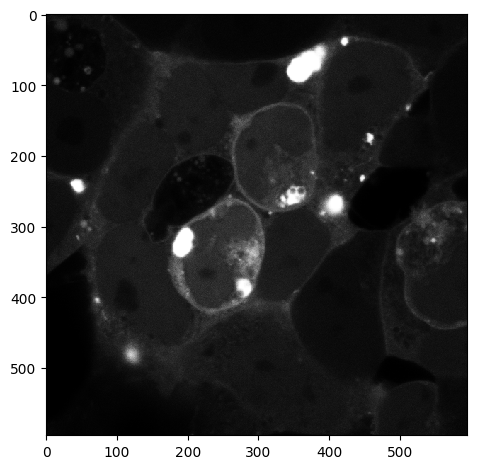

Segmented Cells


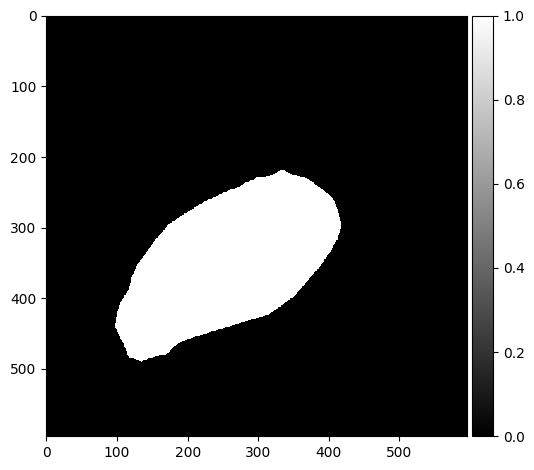

Threshold:  0.5
Bin count 143


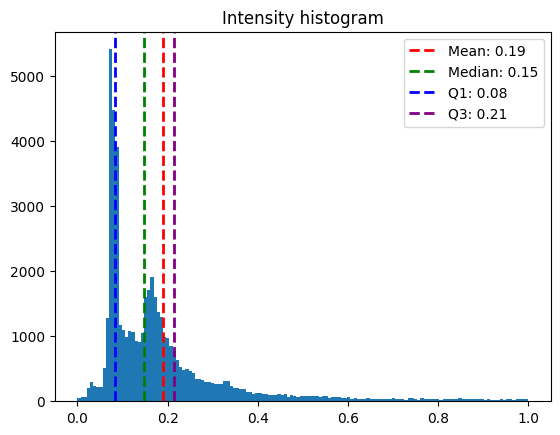

Inclusion Areas:  [ 650.  483.   32.   12. 1003.  423.   12.  499.   12.  136.]


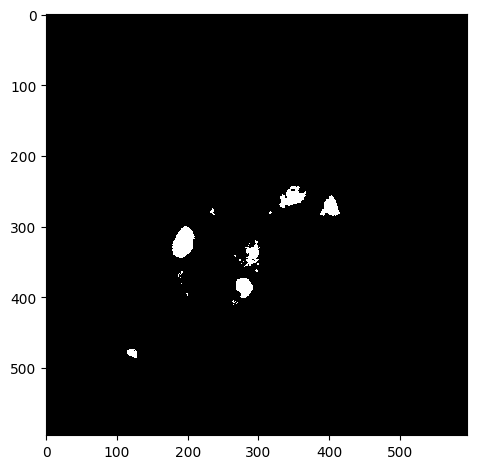

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_noOA_06.czi
Red Channel


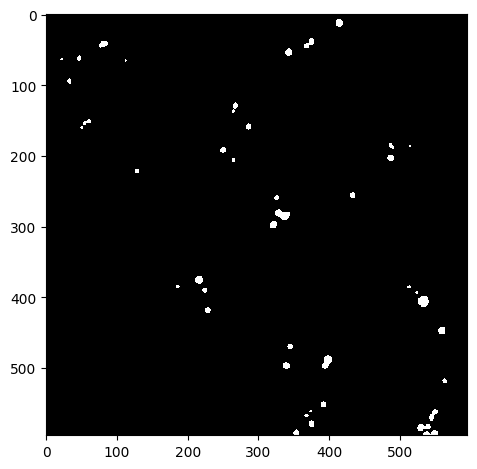

Green Channel


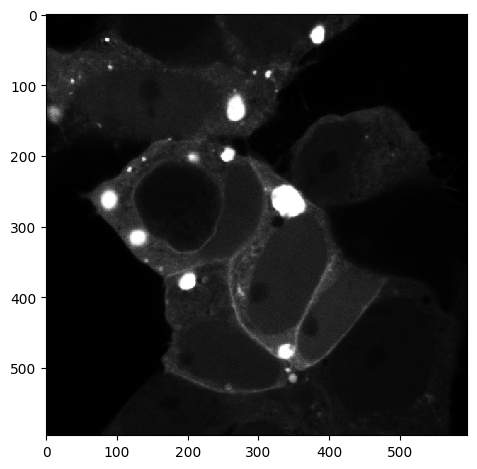

Segmented Cells


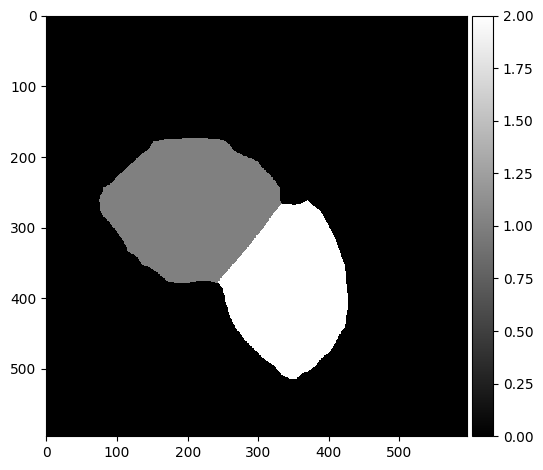

Threshold:  0.5
Bin count 144


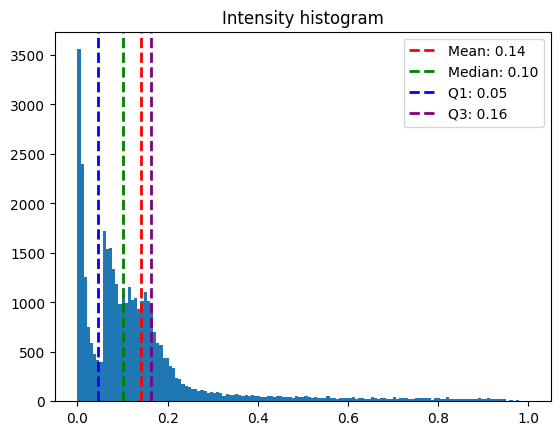

Inclusion Areas:  [303. 123.  24.  35. 351. 547. 499. 250.]


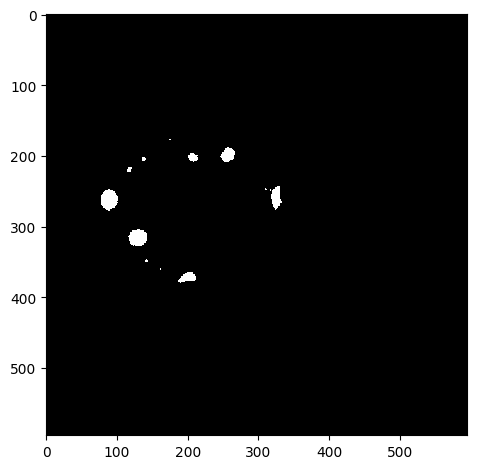

Threshold:  0.5
Bin count 177


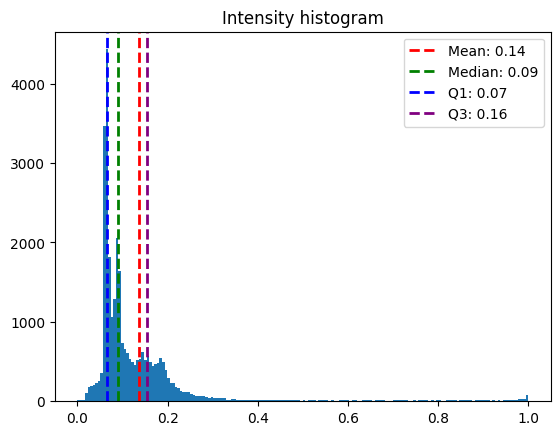

Inclusion Areas:  [694.  48. 464.  25.  37.]


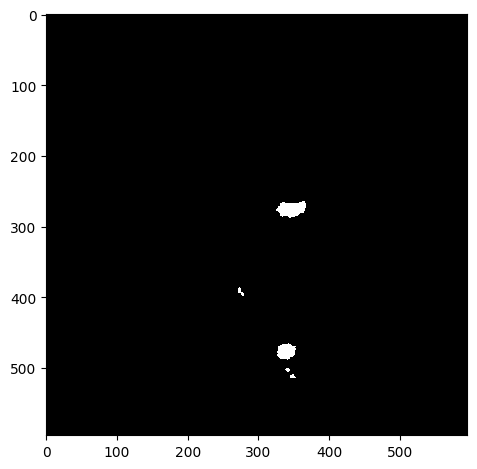

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_01.czi
Red Channel


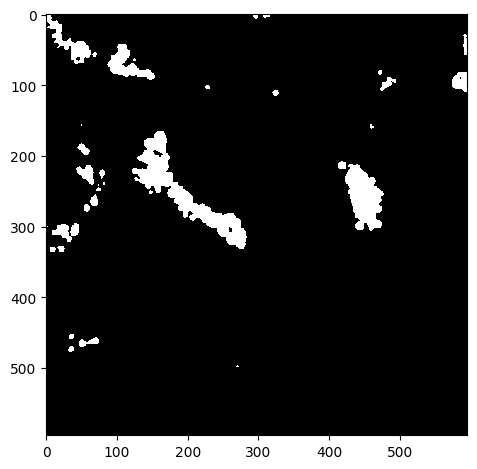

Green Channel


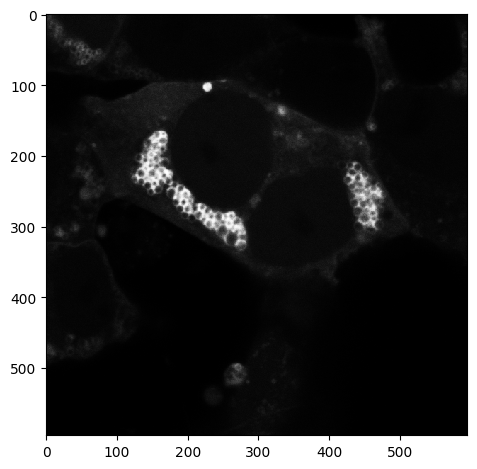

Segmented Cells


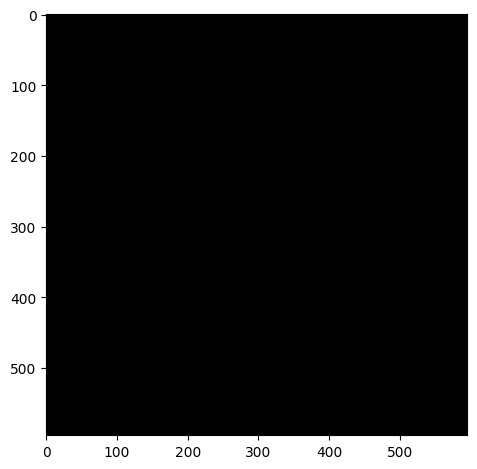

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_02.czi
Red Channel


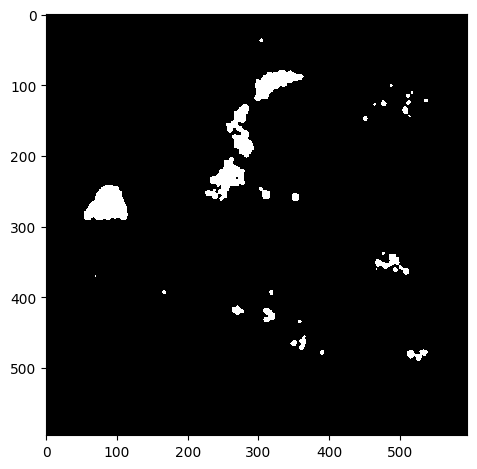

Green Channel


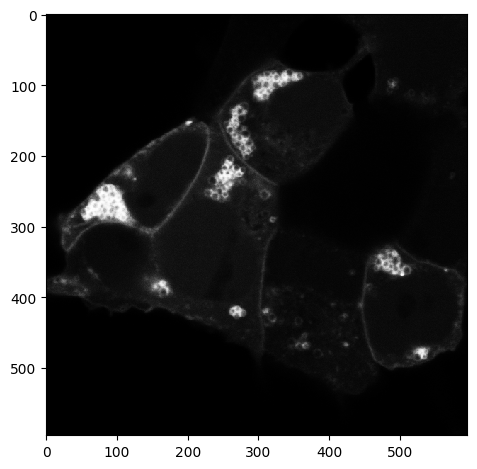

Segmented Cells


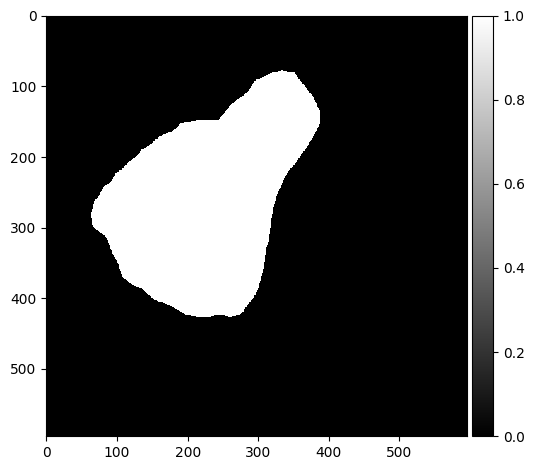

Threshold:  0.5
Bin count 230


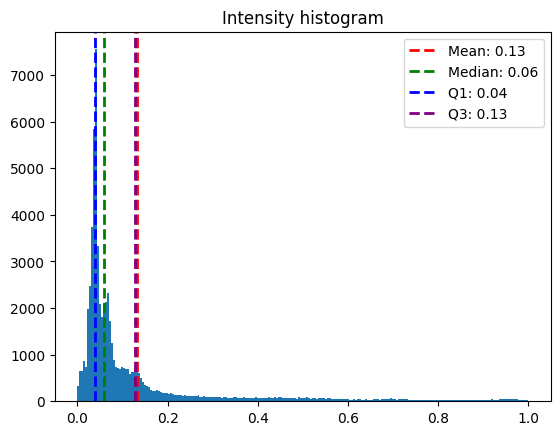

Inclusion Areas:  [1050.  662.   30.   37.  875.   22. 1946.   63.  223.  160.]


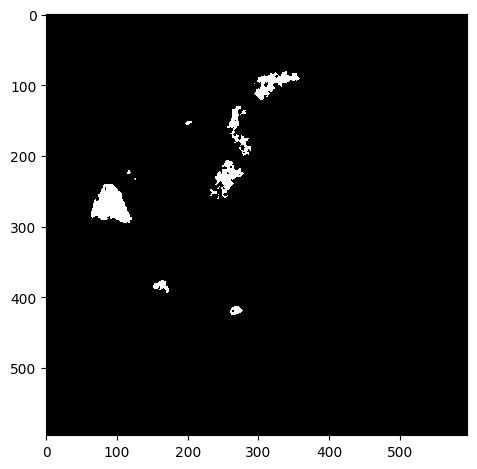

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_03.czi
Red Channel


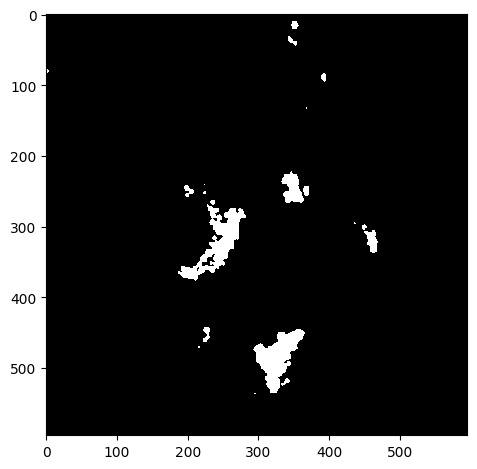

Green Channel


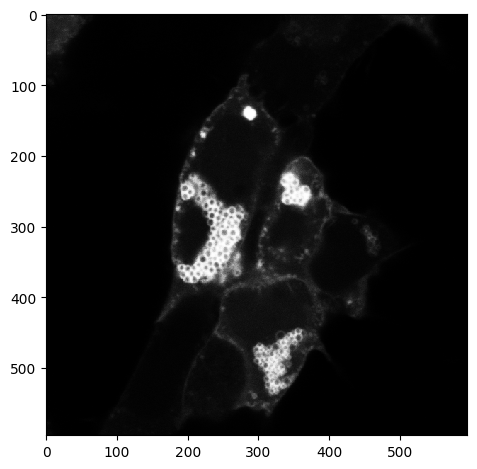

Segmented Cells


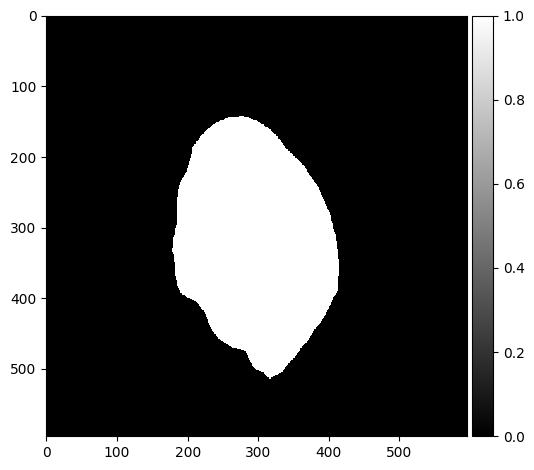

Threshold:  0.5
Bin count 99


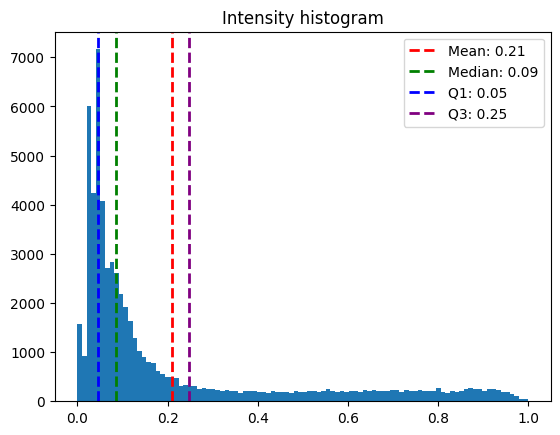

Inclusion Areas:  [  69.   45.   21. 1495. 6043.   15.  260.   36. 1835.]


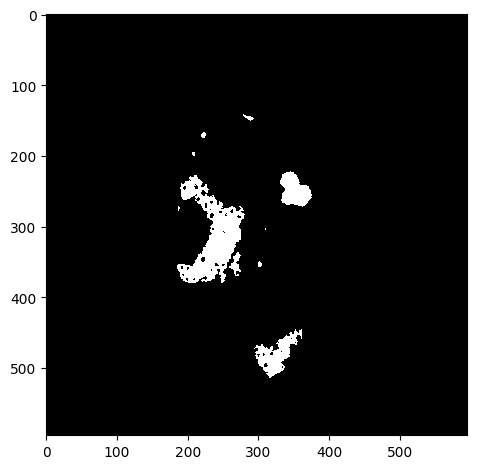

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_04.czi
Red Channel


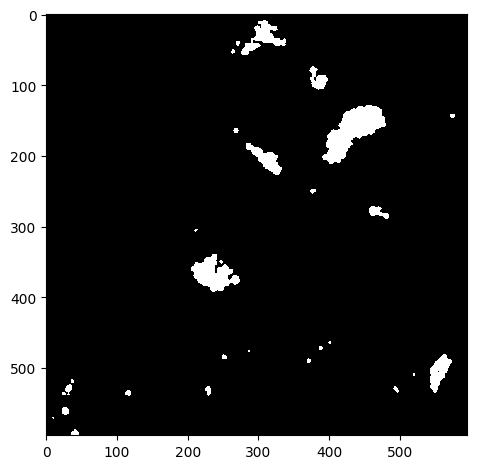

Green Channel


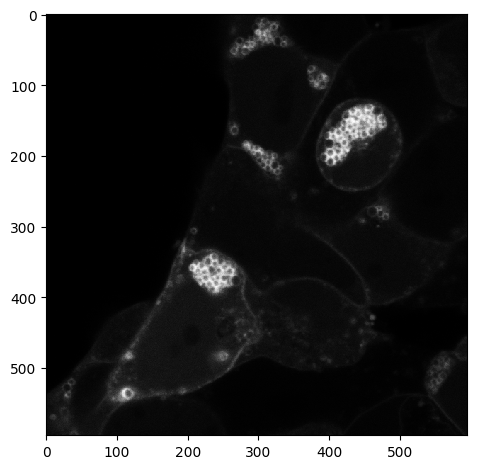

Segmented Cells


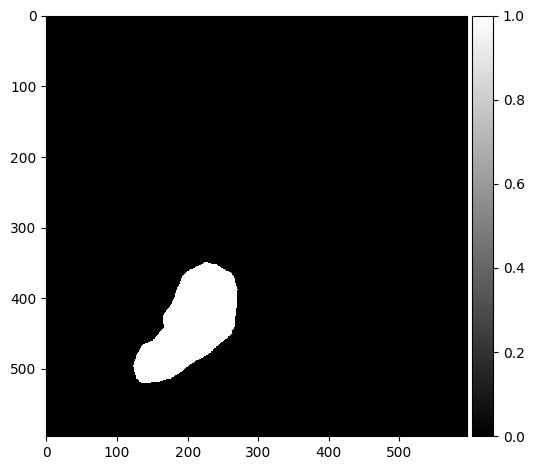

Threshold:  0.5
Bin count 274


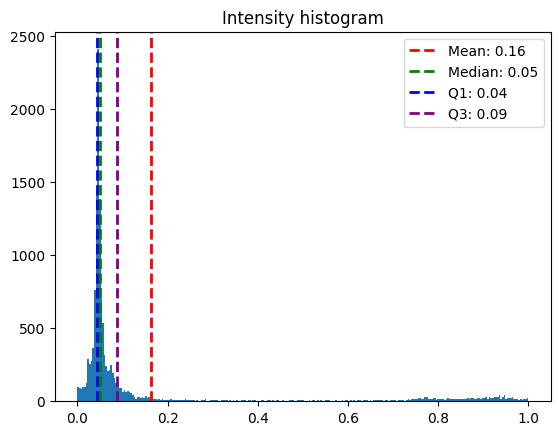

Inclusion Areas:  [1497.]


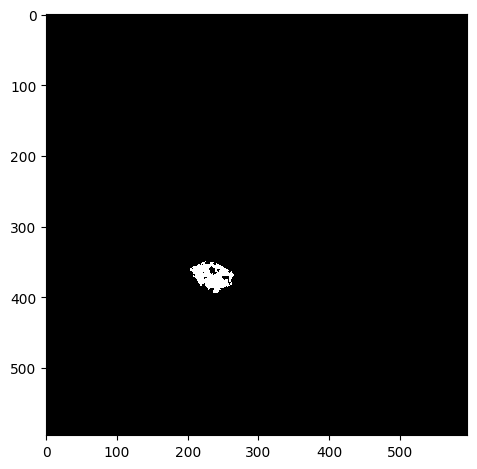

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_05.czi
Red Channel


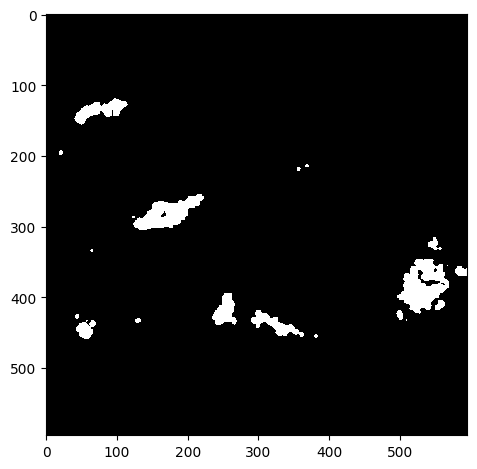

Green Channel


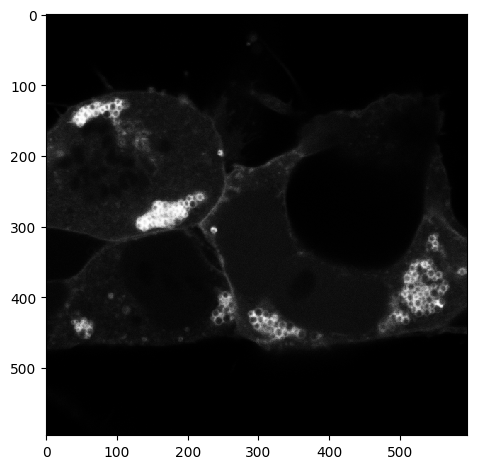

Segmented Cells


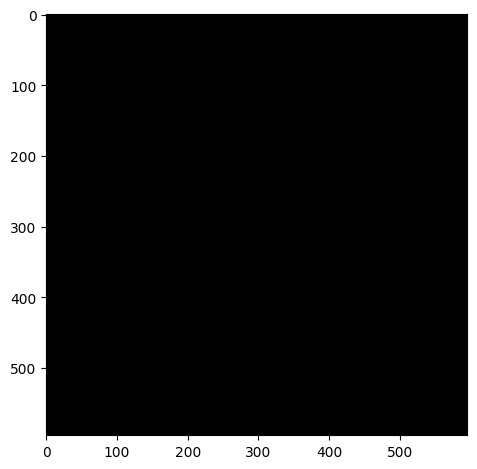

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
3K_SCR_LT_OA_06.czi
Red Channel


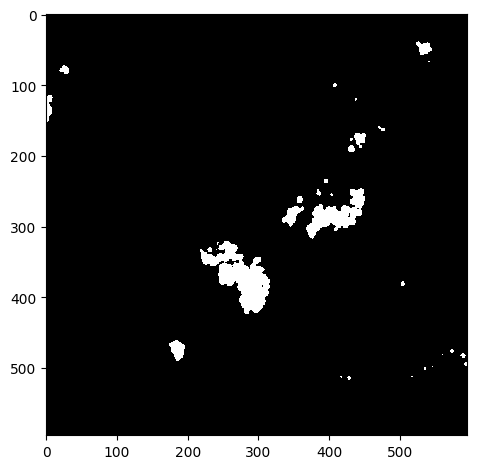

Green Channel


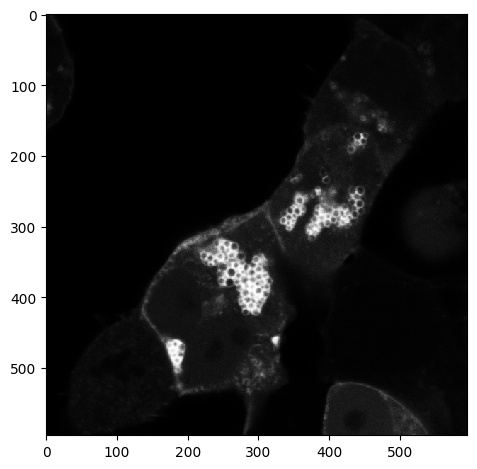

Segmented Cells


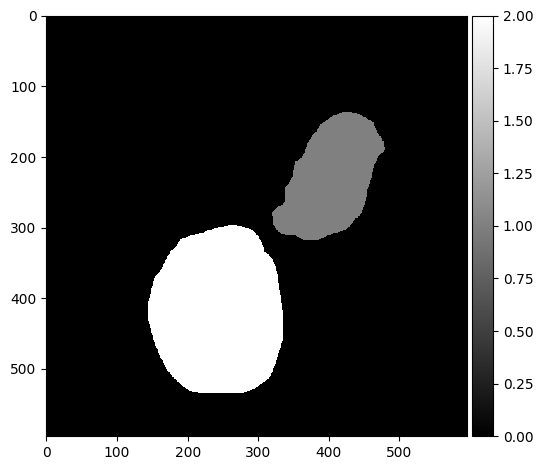

Threshold:  0.5
Bin count 47


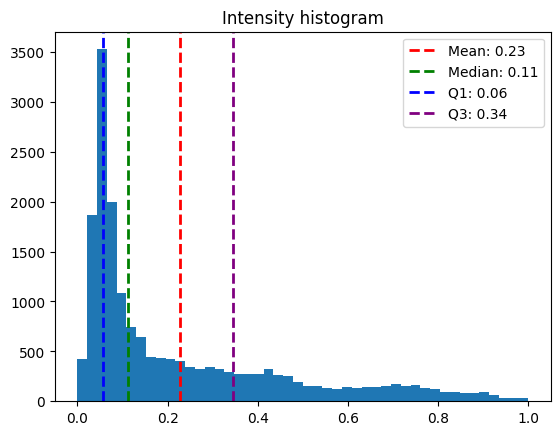

Inclusion Areas:  [  85.   59.  144.  722. 1389.]


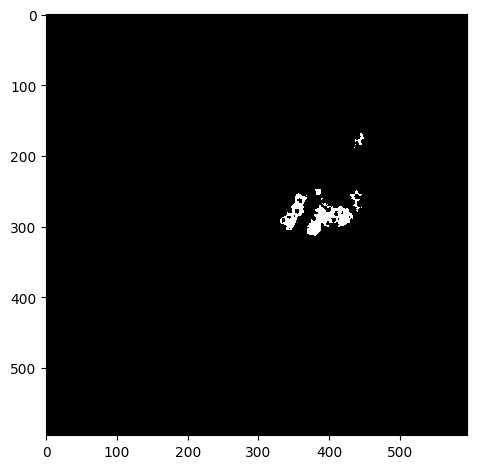

Threshold:  0.5
Bin count 84


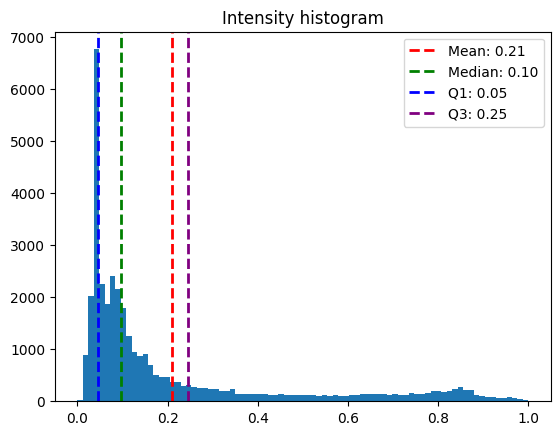

Inclusion Areas:  [4270.   16.   19.   12.   94.  760.]


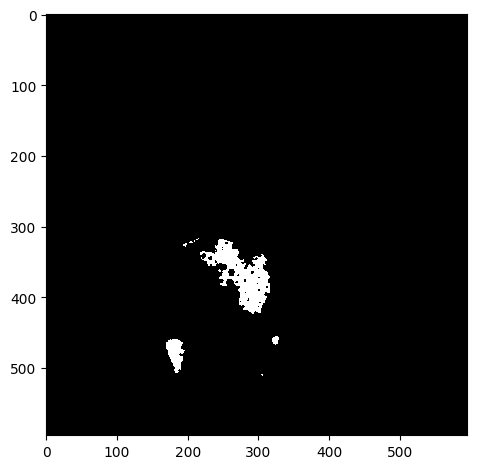

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_01.czi
Red Channel


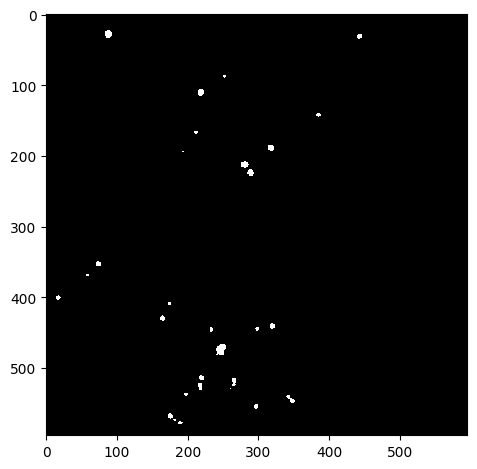

Green Channel


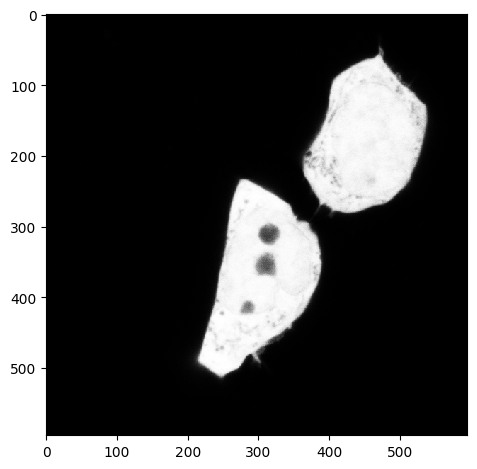

Segmented Cells


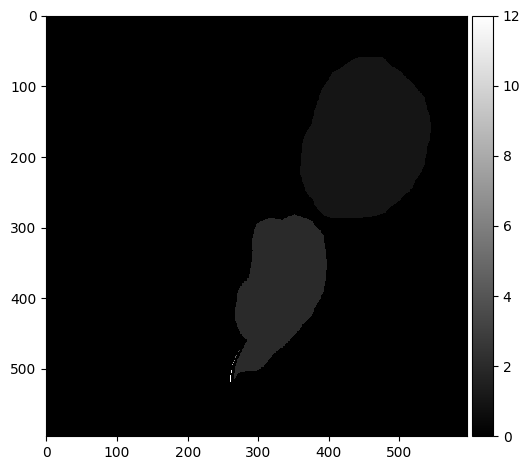

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_02.czi
Red Channel


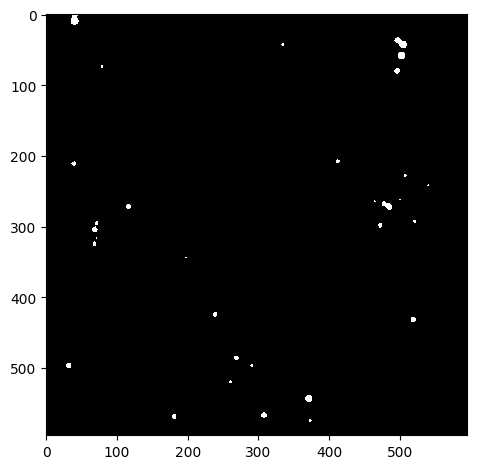

Green Channel


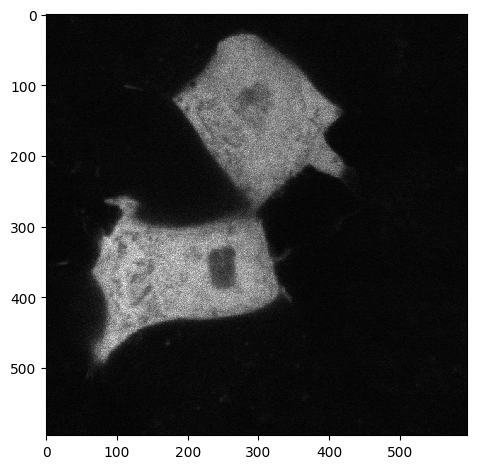

Segmented Cells


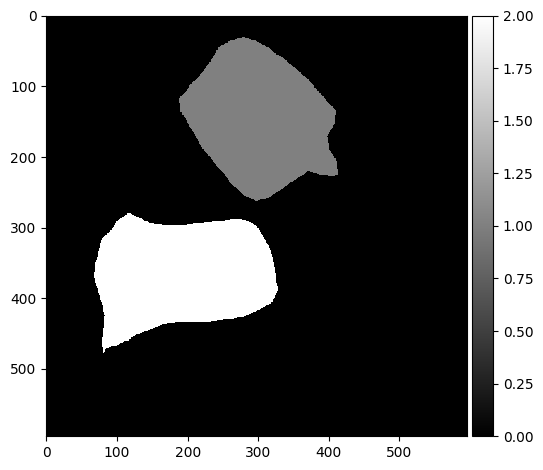

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_03.czi
Red Channel


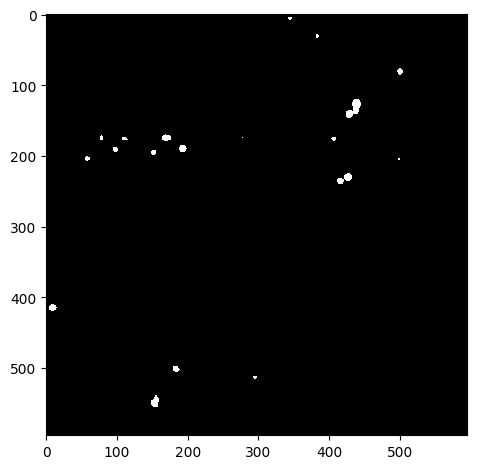

Green Channel


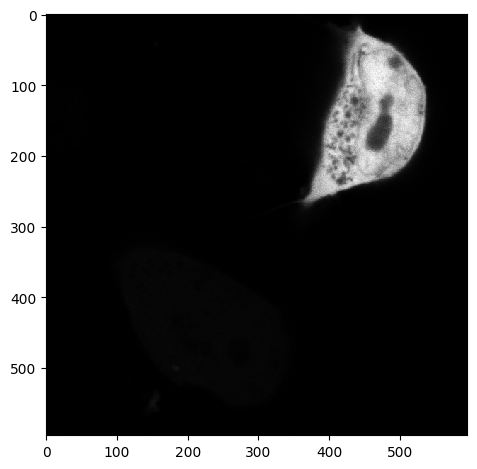

Segmented Cells


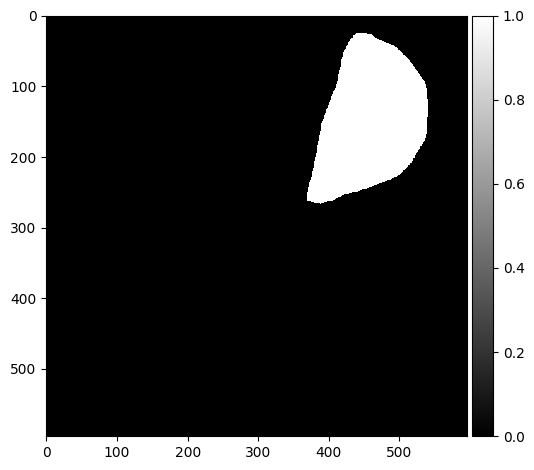

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_04.czi
Red Channel


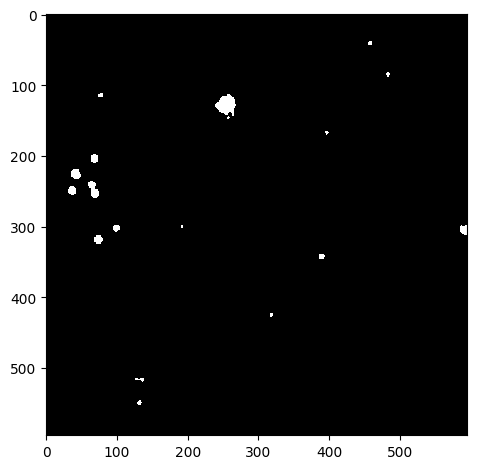

Green Channel


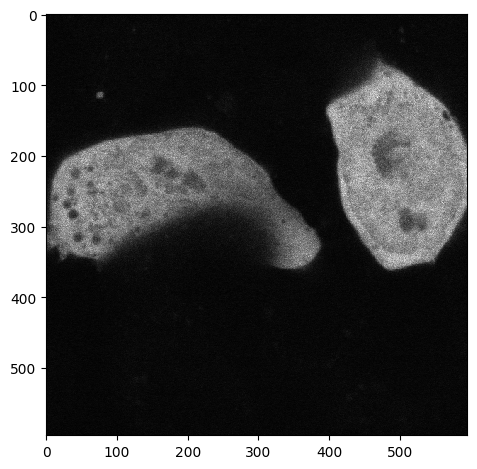

Segmented Cells


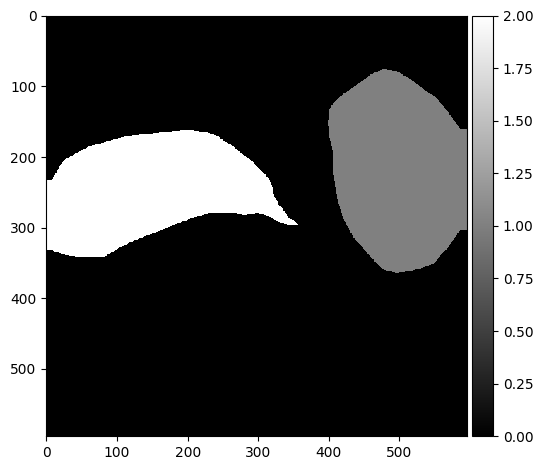

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_05.czi
Red Channel


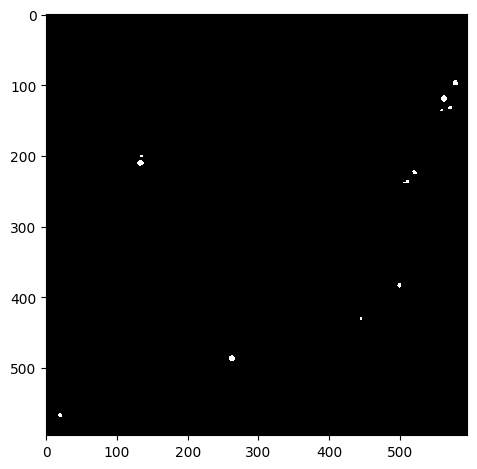

Green Channel


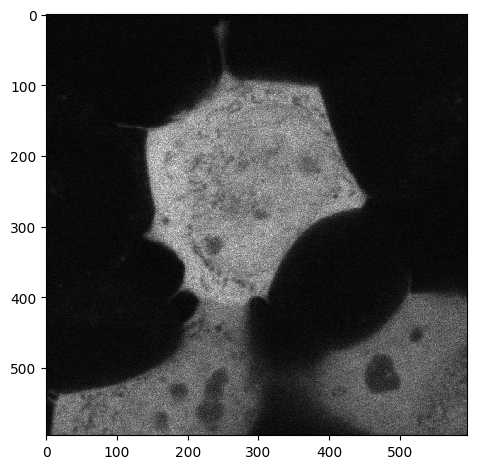

Segmented Cells


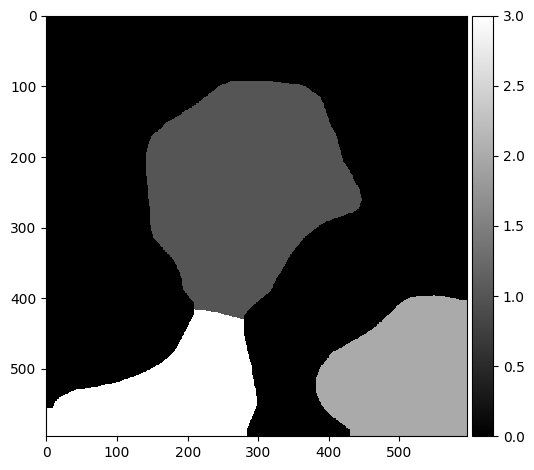

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_noOA_06.czi
Red Channel


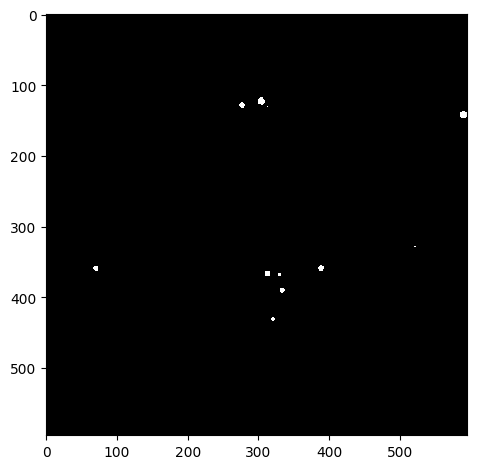

Green Channel


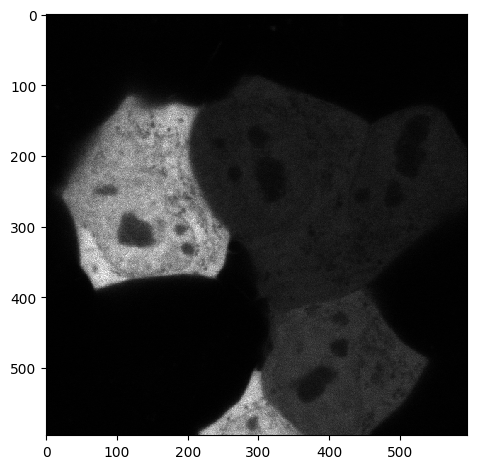

Segmented Cells


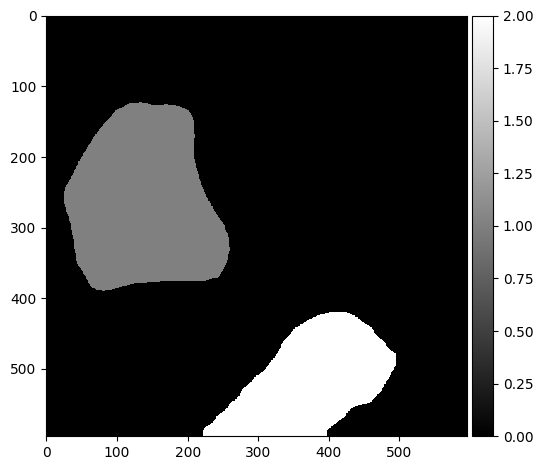

Threshold:  0.5
Bin count 229


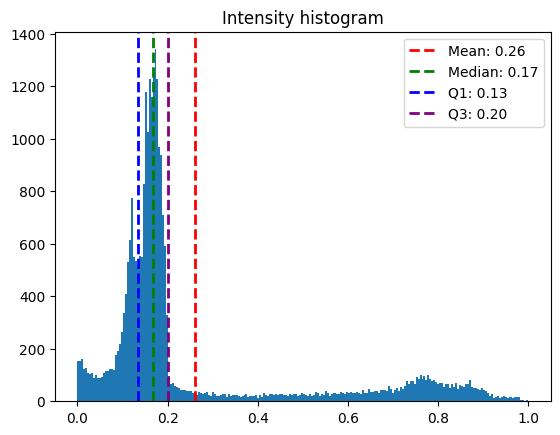

Inclusion Areas:  [3921.]


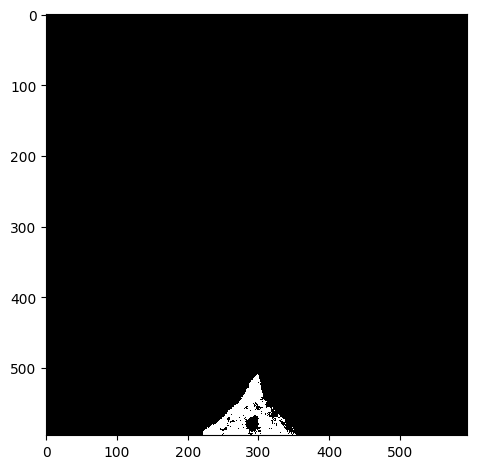

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_01.czi
Red Channel


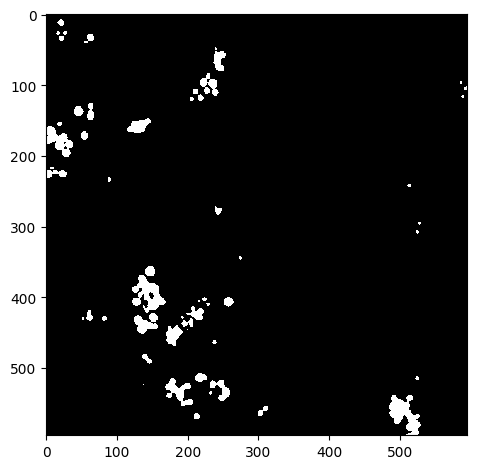

Green Channel


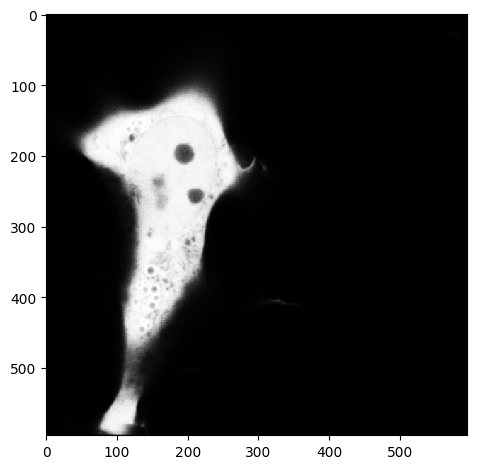

Segmented Cells


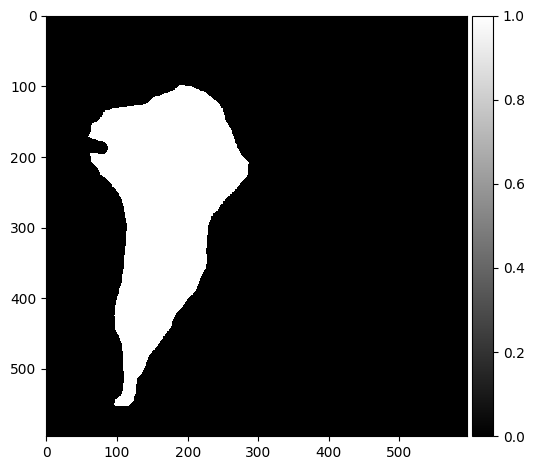

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_02.czi
Red Channel


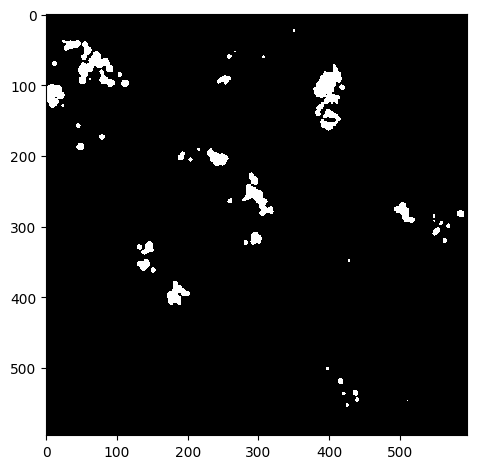

Green Channel


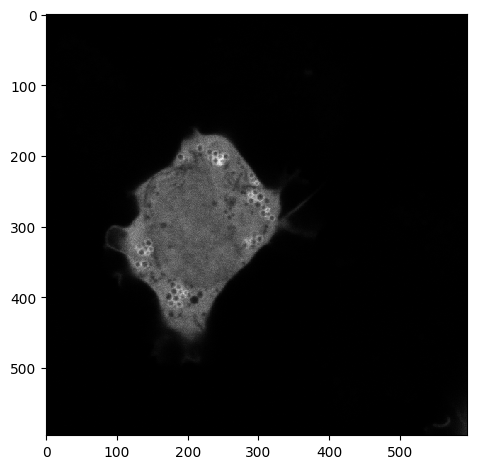

Segmented Cells


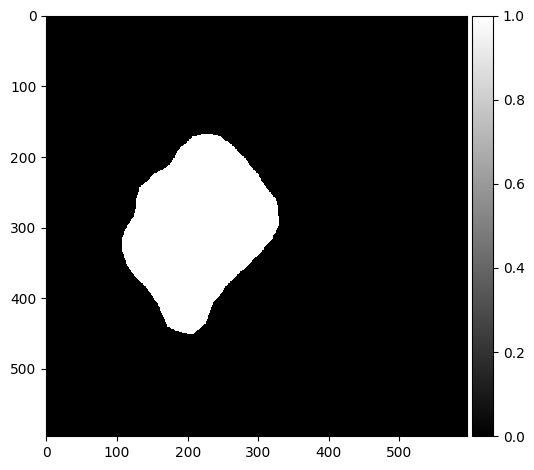

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_03.czi
Red Channel


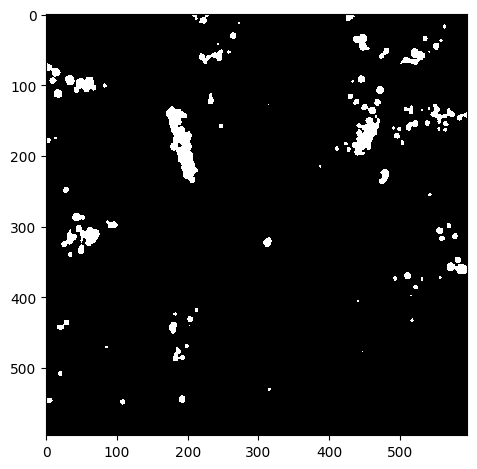

Green Channel


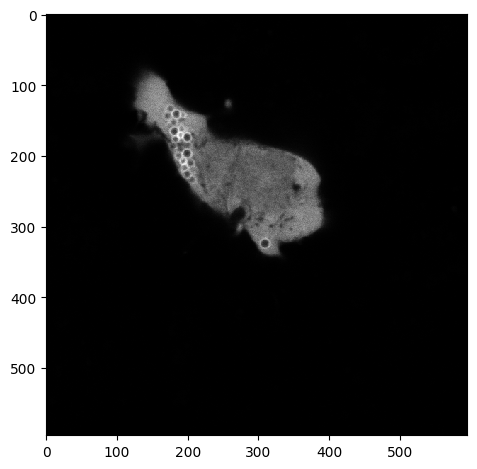

Segmented Cells


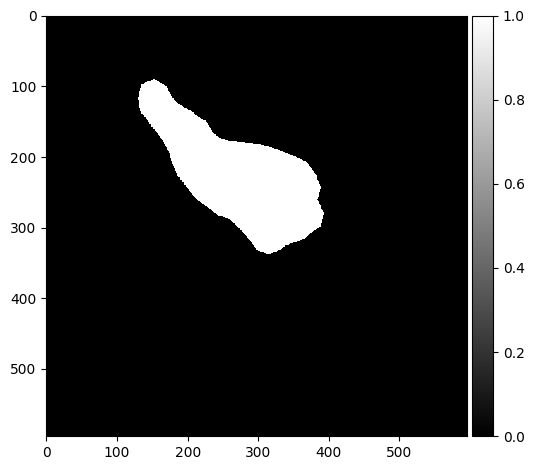

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_04.czi
Red Channel


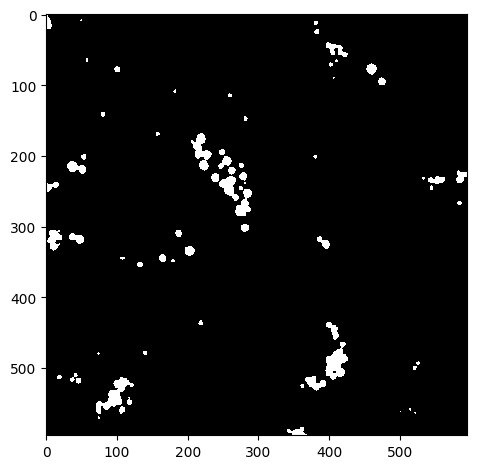

Green Channel


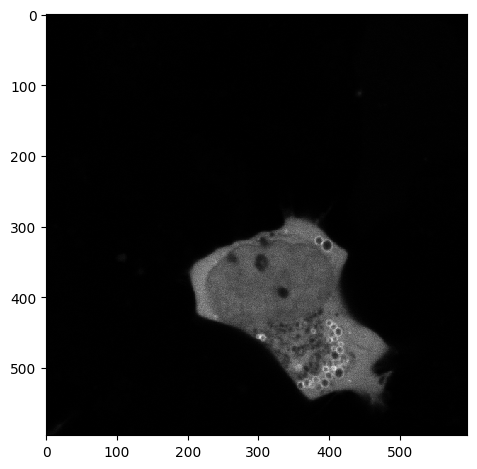

Segmented Cells


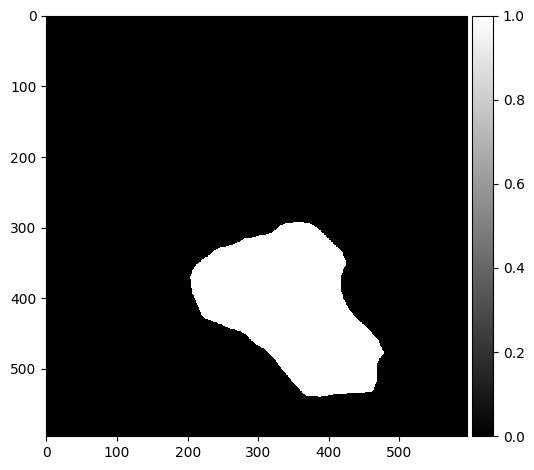

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_05.czi
Red Channel


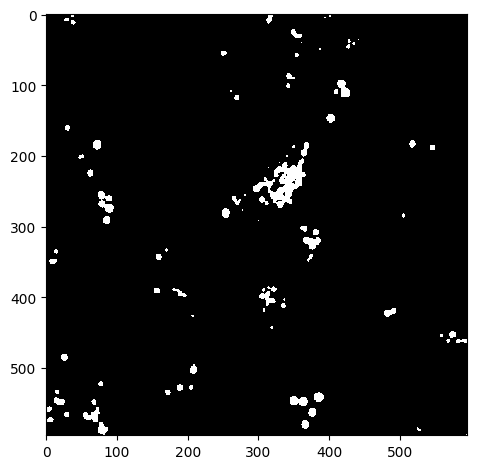

Green Channel


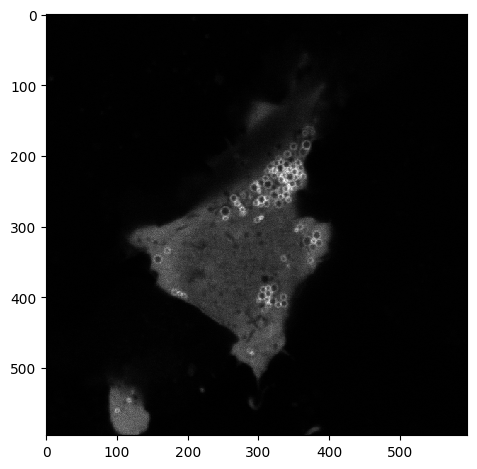

Segmented Cells


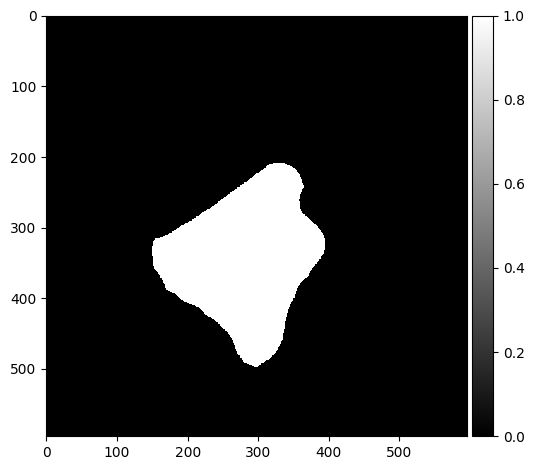

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_FIP200_LT_OA_06.czi
Red Channel


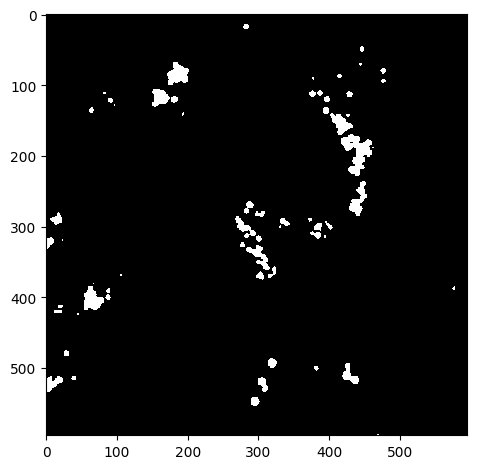

Green Channel


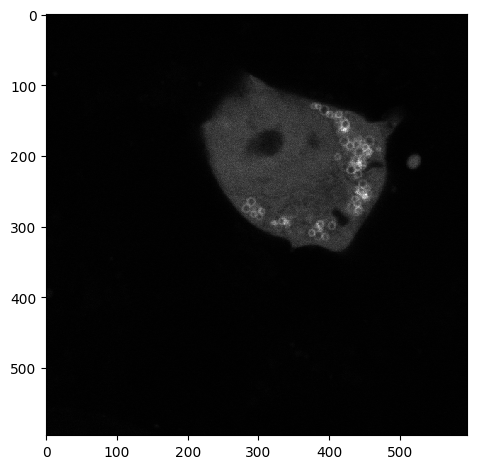

Segmented Cells


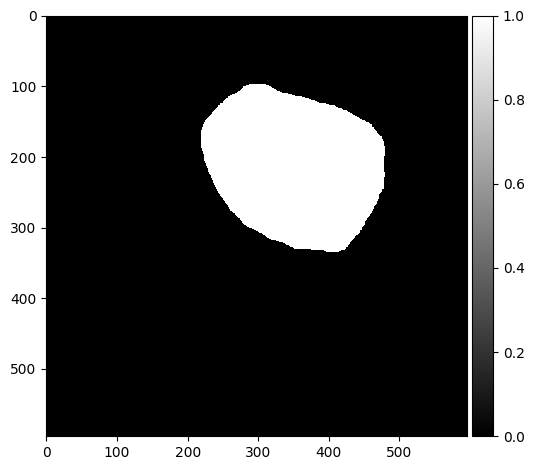

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_01.czi
Red Channel


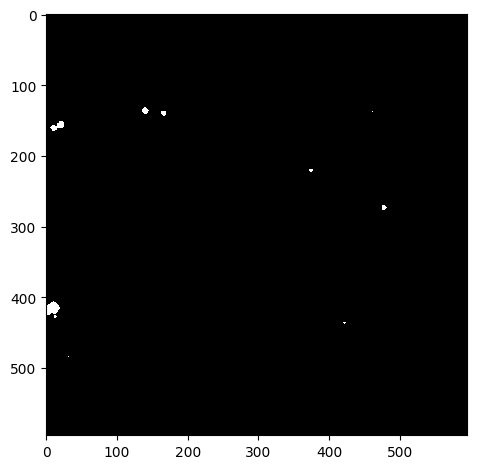

Green Channel


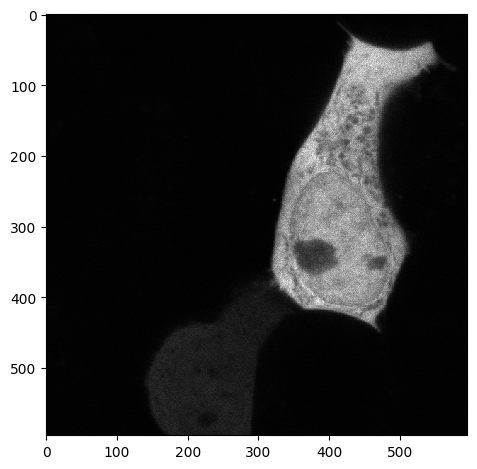

Segmented Cells


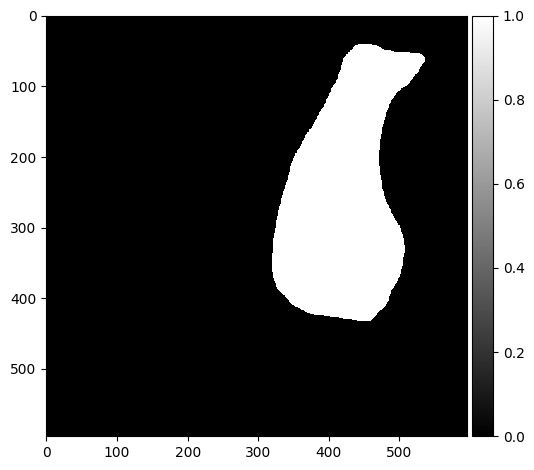

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_02.czi
Red Channel


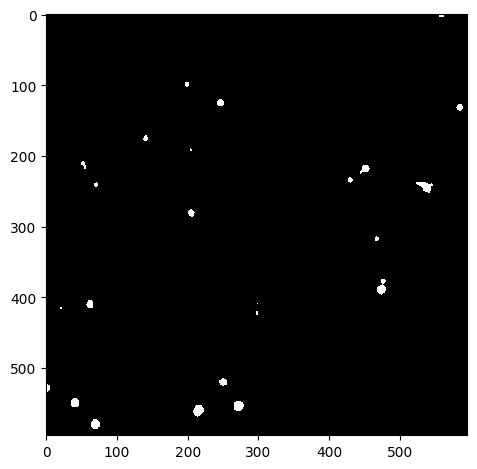

Green Channel


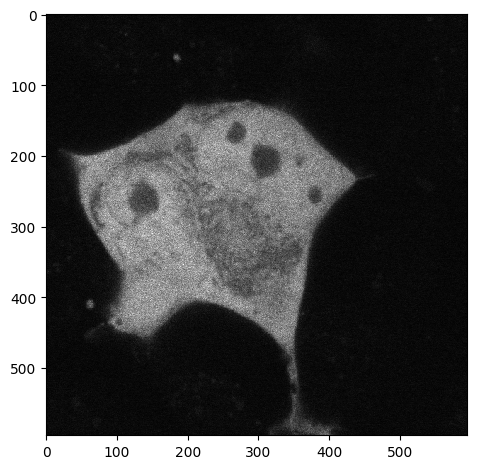

Segmented Cells


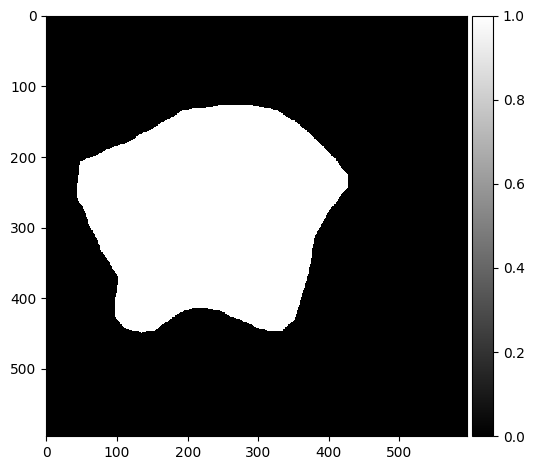

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_03.czi
Red Channel


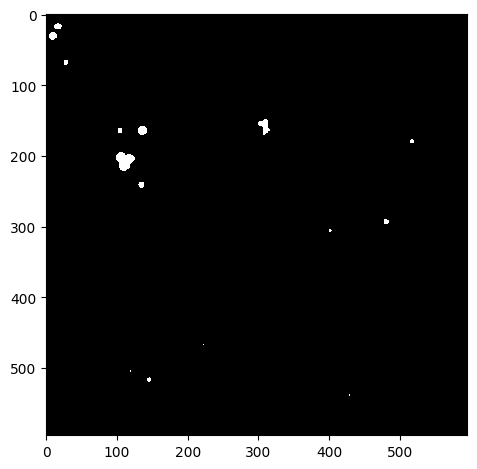

Green Channel


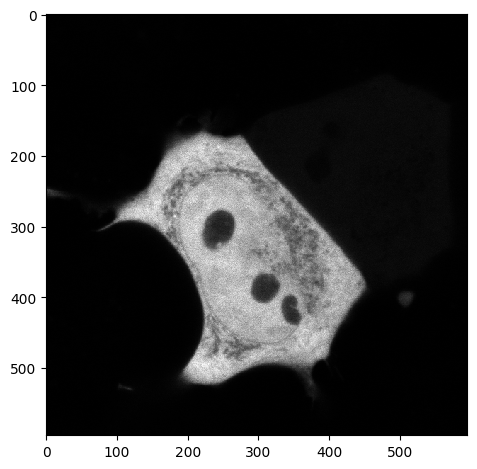

Segmented Cells


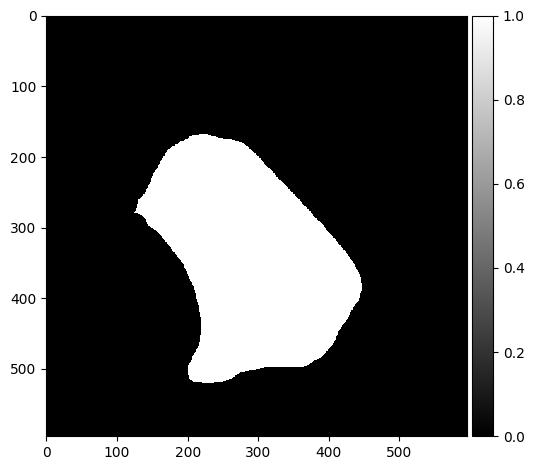

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_04.czi
Red Channel


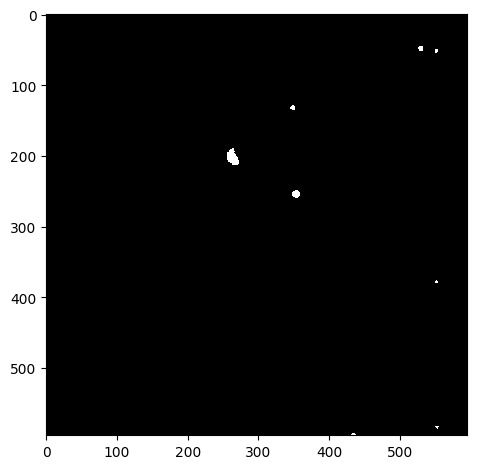

Green Channel


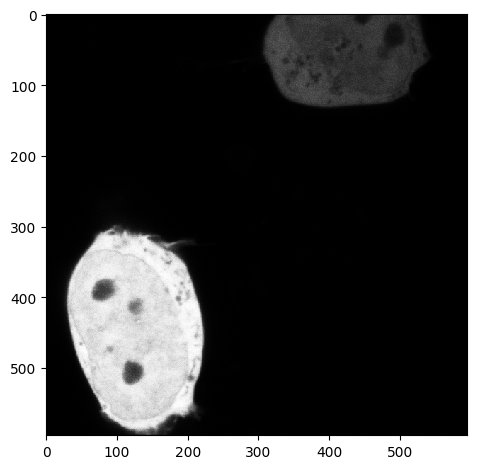

Segmented Cells


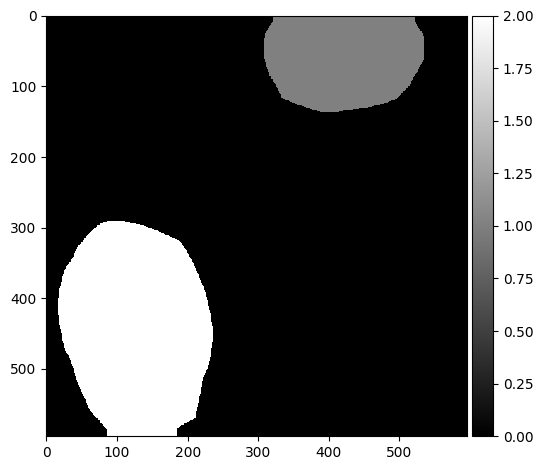

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_05.czi
Red Channel


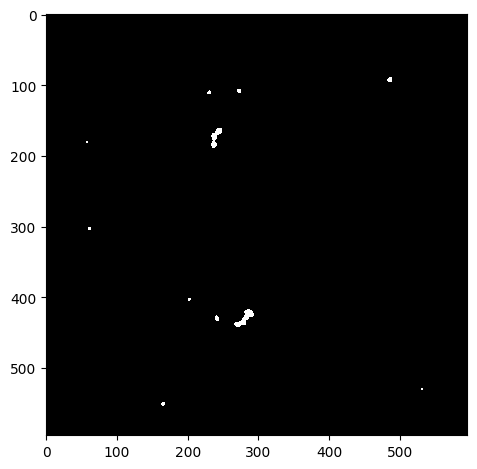

Green Channel


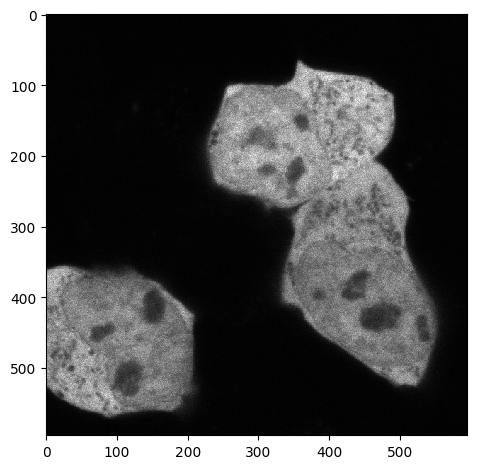

Segmented Cells


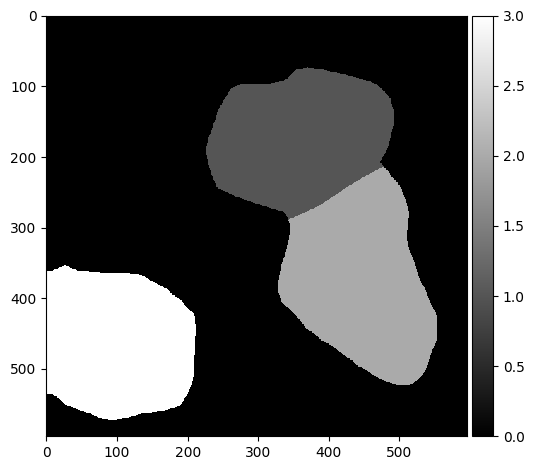

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_noOA_06.czi
Red Channel


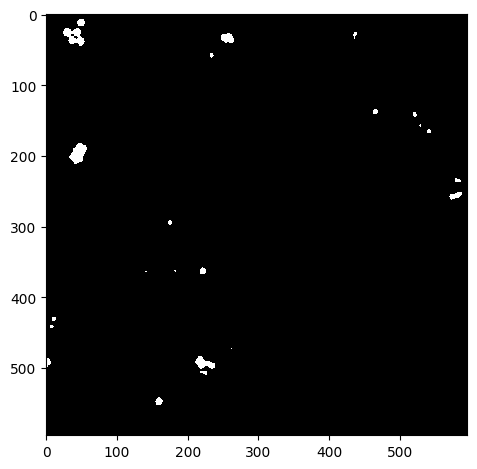

Green Channel


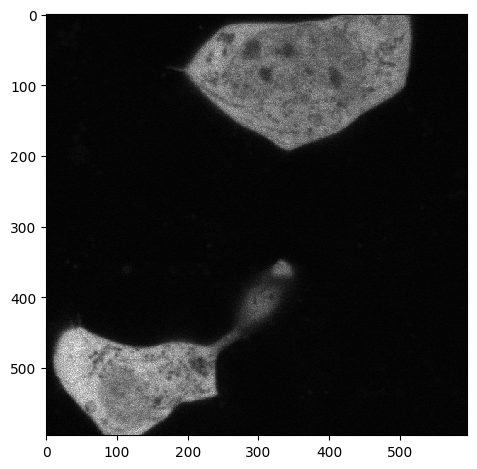

Segmented Cells


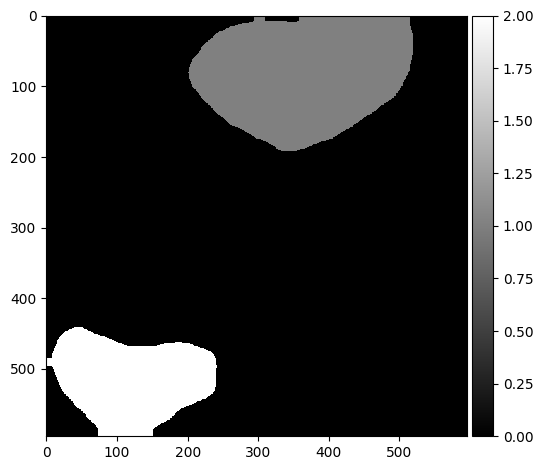

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_01.czi
Red Channel


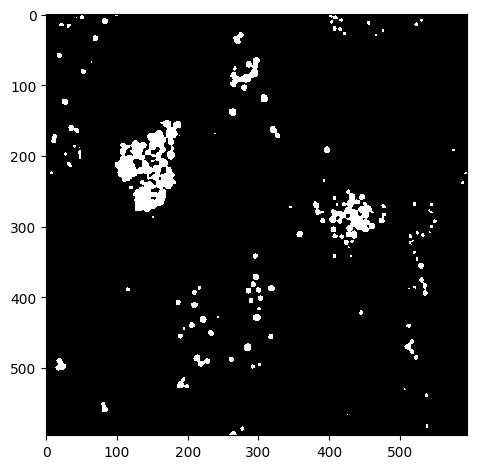

Green Channel


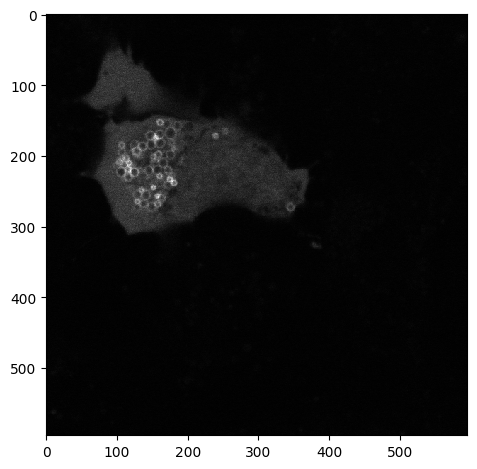

Segmented Cells


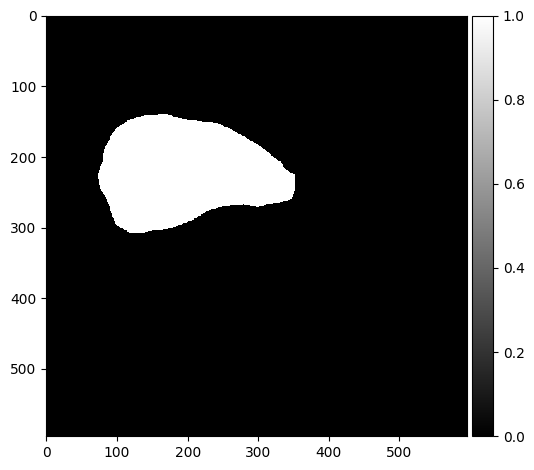

Threshold:  0.5
Bin count 102


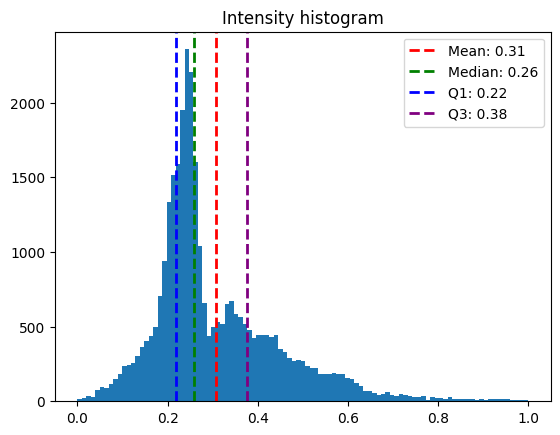

Inclusion Areas:  [ 69.  11. 232.  19.  94.  37.  29.  42.  34.]


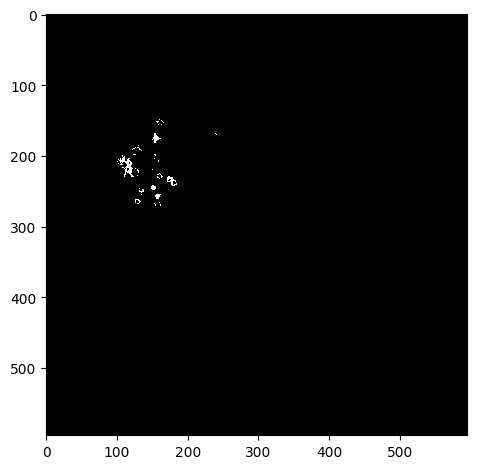

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_02.czi
Red Channel


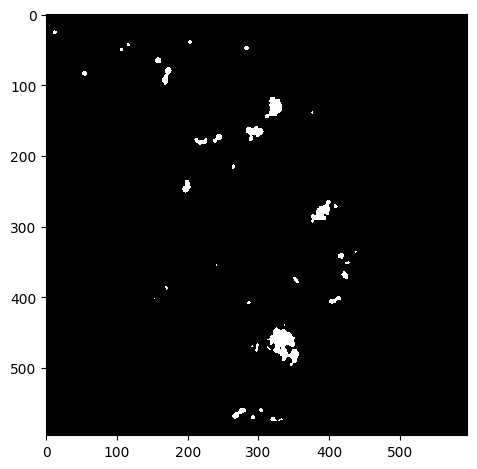

Green Channel


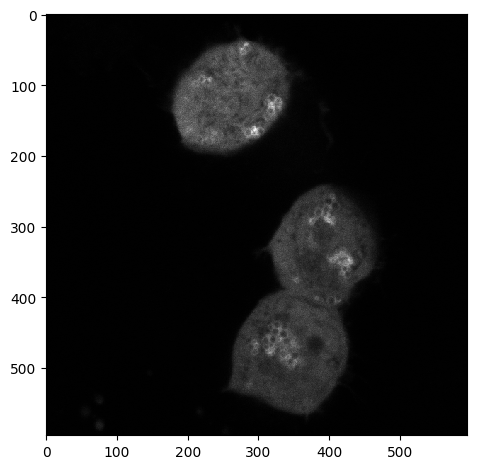

Segmented Cells


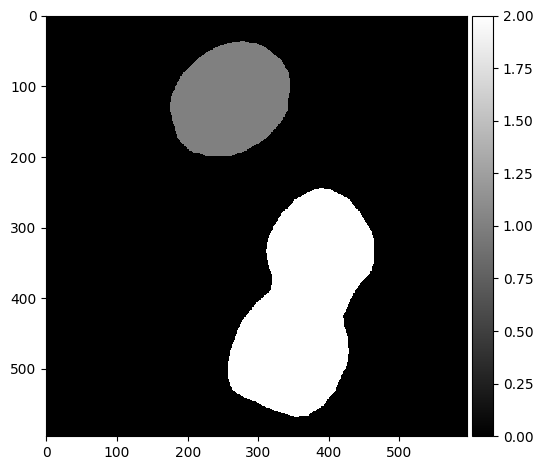

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_03.czi
Red Channel


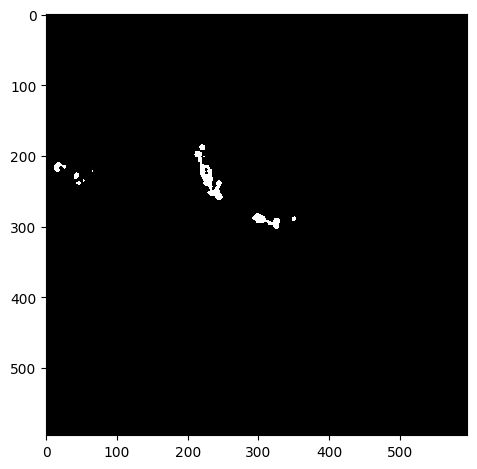

Green Channel


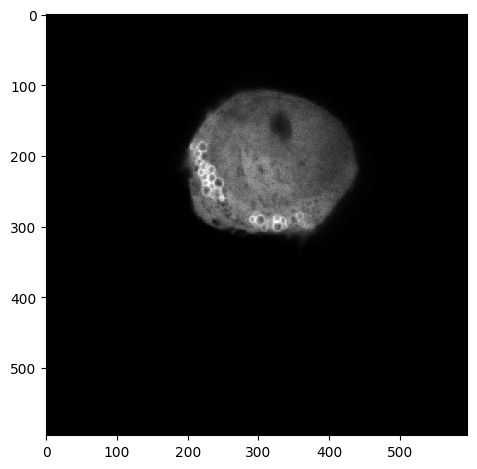

Segmented Cells


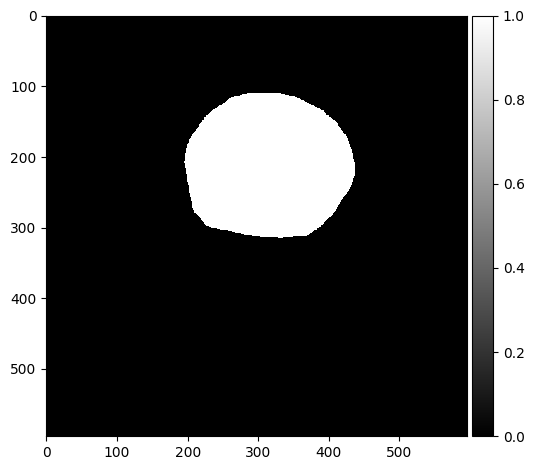

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_04.czi
Red Channel


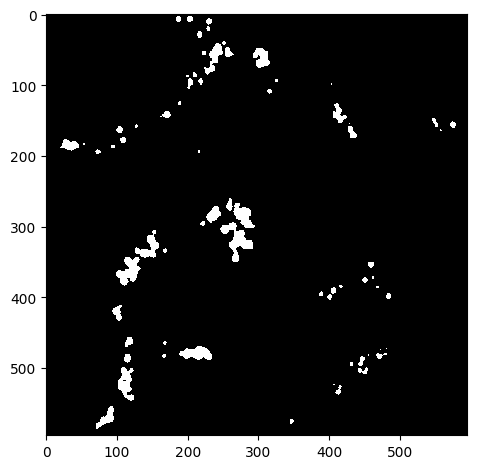

Green Channel


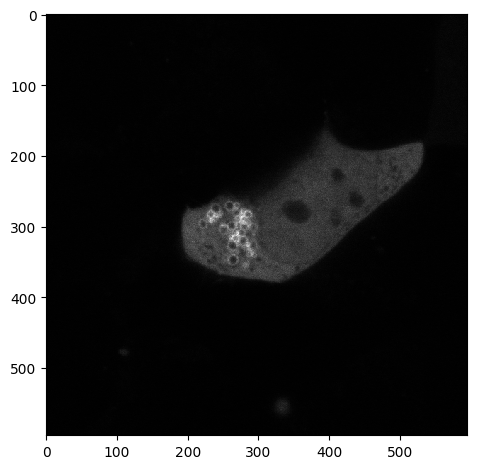

Segmented Cells


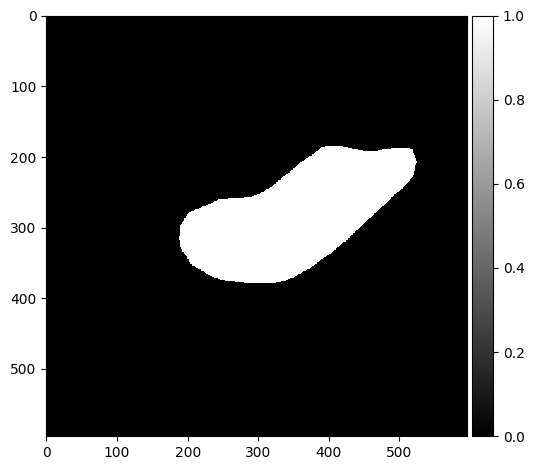

Threshold:  0.5
Bin count 159


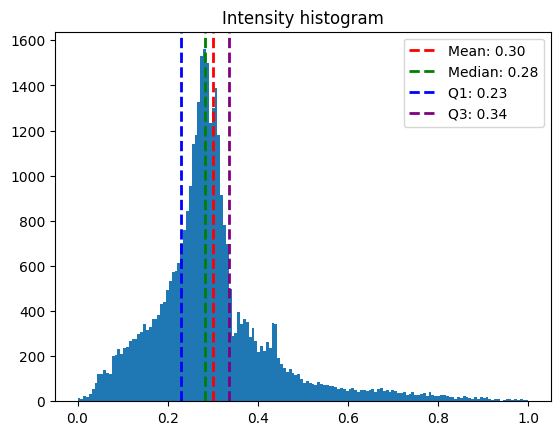

Inclusion Areas:  [ 11. 338. 157.  20. 205. 100.]


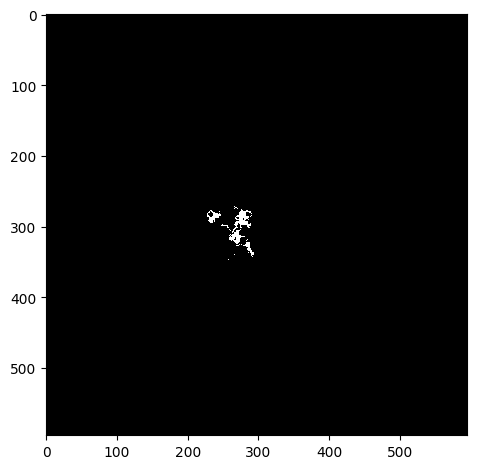

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_05.czi
Red Channel


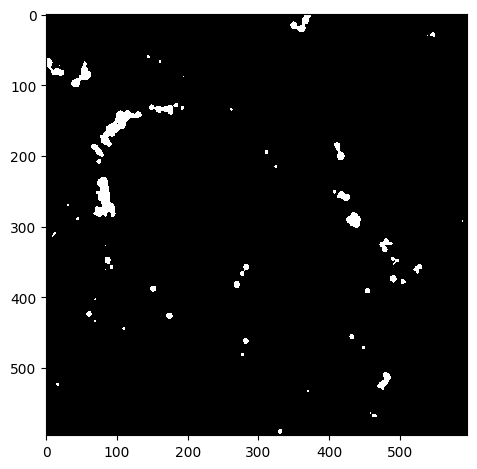

Green Channel


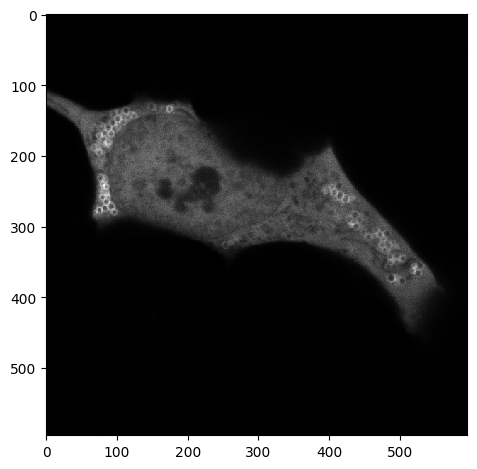

Segmented Cells


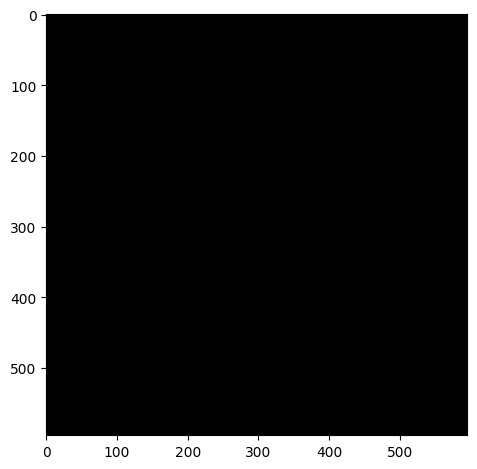

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_LT_OA_06.czi
Red Channel


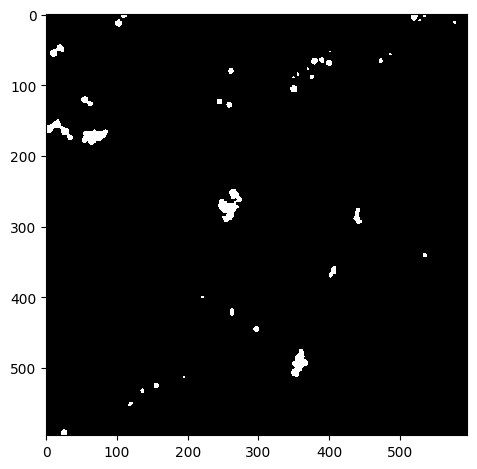

Green Channel


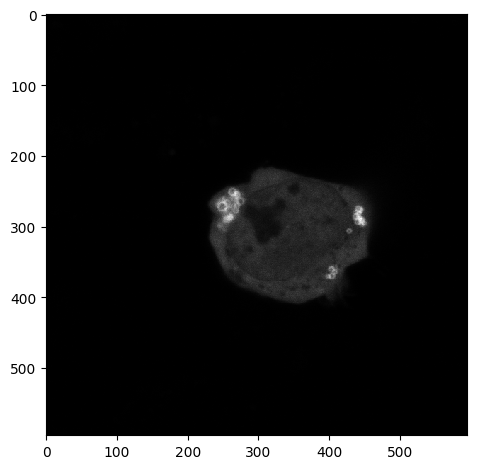

Segmented Cells


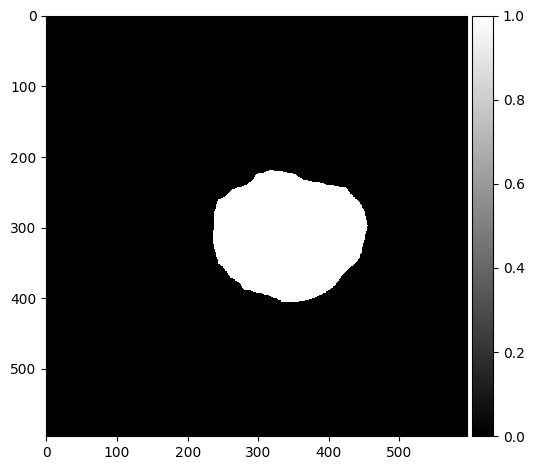

Threshold:  0.5
Bin count 275


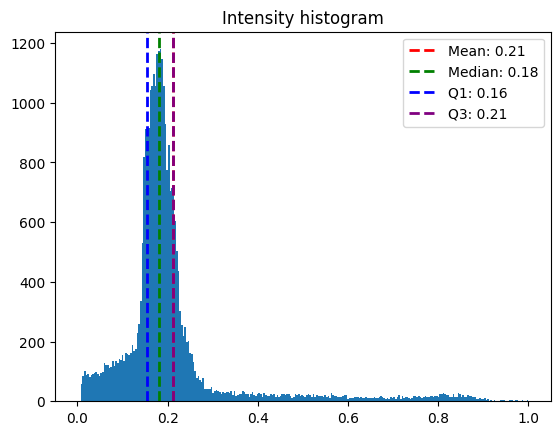

Inclusion Areas:  [237. 206. 257. 137.  38.  20.]


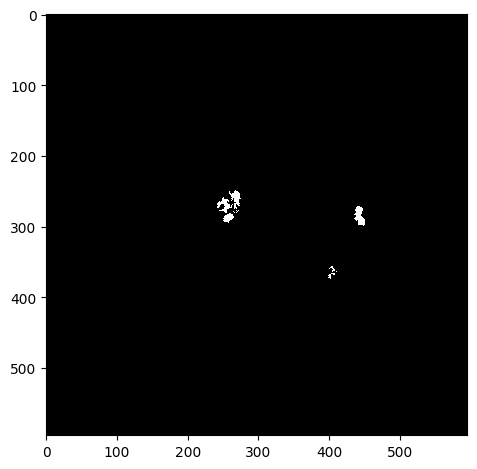

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [19]:

for folder in folders:
    analyze_all_images(folder)
